In [2]:
import os
import sys

import numpy as np
import pandas as pd
import seaborn as sns
import gseapy as gp

from lifelines import KaplanMeierFitter as KM
from lifelines import CoxPHFitter as cox
from matplotlib import pyplot as plt
from pandas import DataFrame as df
from scipy import stats
from IPython.display import Image

import matplotlib
import matplotlib.font_manager as fm
from matplotlib.ft2font import FT2Font
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

def get_font(*args, **kwargs):
    return FT2Font(*args, **kwargs)

fm.get_font = get_font

matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42

In [3]:
import gc
gc.collect()

868

# Global Path

In [5]:
poseidon_home = '/home/dyang-server/hdd/Yue/PROJECTS/POSEIDON/'
data_home = poseidon_home + 'data/'
gsea_home = poseidon_home + 'GSEA/'
cmap_home = data_home + 'CMAP2020_Cancer/'
shift_home = poseidon_home + 'shift_ability/'
panel_home = poseidon_home + 'panels/Figure3/'

In [6]:
gene_sets = {}
with open(gsea_home + '/gene_sets/NREC_REC_91061.gmt', 'r') as f:
    for lines in f:
        lines = lines.rstrip().split('\t')
        gene_sets[lines[0]] = lines[2:]

In [7]:
ec_color = df(index=gene_sets['NREC_profile'] + gene_sets['REC_profile'], columns=['colors'])
ec_color.loc[gene_sets['NREC_profile'], 'colors'] = 'crimson'
ec_color.loc[gene_sets['REC_profile'], 'colors'] = 'royalblue'

In [8]:
# L1000 gene info
bing_landmark = pd.read_csv(data_home + 'CMAP2020_Cancer/landmark_and_bings_L1000.csv',
                            header=0, index_col=0, sep=',', dtype={'Official NCBI gene symbol': 'str'}, converters={'Official NCBI gene symbol': None})
bing_landmark

,Official NCBI gene symbol
Official NCBI gene id,
5720,PSME1
7416,VDAC1
55847,CISD1
10174,SORBS3
25803,SPDEF
...,...
5137,PDE1C
51233,DRICH1
4340,MOG


In [9]:
sig_info = pd.read_csv(data_home + 'CMAP2020_Cancer/siginfo_beta.txt',
                            header=0, index_col='sig_id', sep='\t')

/home/dyang-server/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (0,3,4,28,29) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [19]:
sig_info.columns

Index(['bead_batch', 'nearest_dose', 'pert_dose', 'pert_dose_unit',
       'pert_idose', 'pert_itime', 'pert_time', 'pert_time_unit',
       'cell_mfc_name', 'pert_mfc_id', 'nsample', 'cc_q75', 'ss_ngene', 'tas',
       'pct_self_rank_q25', 'wt', 'median_recall_rank_spearman',
       'median_recall_rank_wtcs_50', 'median_recall_score_spearman',
       'median_recall_score_wtcs_50', 'batch_effect_tstat',
       'batch_effect_tstat_pct', 'is_hiq', 'qc_pass', 'pert_id', 'pert_type',
       'cell_iname', 'det_wells', 'det_plates', 'distil_ids', 'build_name',
       'project_code', 'cmap_name', 'is_exemplar_sig', 'is_ncs_sig',
       'is_null_sig'],
      dtype='object')

In [10]:
compound_info = pd.read_csv(data_home + '/CMAP2020_Cancer/compoundinfo_beta.txt',
                            header=0, index_col=1, sep='\t')
compound_info = compound_info.groupby(level=0).first()
compound_info

,pert_id,target,moa,canonical_smiles,inchi_key,compound_aliases
cmap_name,,,,,,
1-EBIO,BRD-K70586315,NaN,NaN,CCn1c2ccccc2[nH]c1=O,CXUCKELNYMZTRT-UHFFFAOYSA-N,NaN
1-HYDROXYANTHRAQUINONE,BRD-K62620932,NaN,NaN,NaN,NaN,NaN
1-HYDROXYPHENAZINE,BRD-K66151076,NaN,NaN,NaN,NaN,NaN
1-NAPHTHYLAMINE,BRD-K05741221,NaN,NaN,NaN,NaN,NaN
1-NITRONAPHTHALENE,BRD-K72839221,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...
zolpidem,BRD-K44876623,GABRA1,Benzodiazepine receptor agonist,CN(C)C(=O)Cc1c(nc2ccc(C)cn12)-c1ccc(C)cc1,ZAFYATHCZYHLPB-UHFFFAOYSA-N,NaN
zonisamide,BRD-A28095882,SCN11A,Sodium channel blocker,CN1C2CCC1CC(C2)OC(c3ccccc3)c4ccccc4N,KZFDKINRISJFCO-UHFFFAOYSA-N,NaN
zopiclone,BRD-A34309505,GABRA1,GABA receptor agonist,CN1CCN(CC1)C(=O)OC2N(C(=O)c3nccnc23)c4ccc(Cl)cn4,GBBSUAFBMRNDJC-UHFFFAOYSA-N,NaN


In [124]:
icd_selected = ['ANXA1', 'CALR', 'CXCL10', 'HMGB1', 'IL1B', 'IL17B']

# List of cancer with trt_cp available

In [11]:
compound_cancer = ['BLCA', 'BRCA', 'CESC', 'CRC', 'LIHC', 'LUNG',
                   'OV', 'PAAD', 'PRAD', 'SKCM', 'STAD', 'UCEC']

In [12]:
# shifting results
merged_rs_cp_table = pd.read_csv(poseidon_home + 'results/compound_top_moa/all_Rshifting_table.csv',
                                 header=0, index_col=0, sep=',')
merged_rs_cp_table['dosage'] = 'not available'
merged_rs_cp_table.loc[merged_rs_cp_table[merged_rs_cp_table['nearest_dose'] <= 1 ].index, 'dosage'] = 'low'
merged_rs_cp_table.loc[merged_rs_cp_table[(merged_rs_cp_table['nearest_dose'] <= 10 ) & (merged_rs_cp_table['nearest_dose'] > 1)].index, 'dosage'] = 'medium'
merged_rs_cp_table.loc[merged_rs_cp_table[merged_rs_cp_table['nearest_dose'] > 10].index, 'dosage'] = 'high'

merged_rs_cp_table

,NREC_profile,REC_profile,cmap_name,nearest_dose,pert_idose,shift_ability,cell_line,cancer_type,dosage
REP.A023_MCF7_24H:P14,-0.471999,0.456107,floxuridine,3.330,3.33 uM,0.928106,MCF7,BRCA,medium
LKCP002_MCF7_48H:B10,-0.458585,0.468354,tipifarnib,10.000,10 uM,0.926939,MCF7,BRCA,medium
PBIOA016_MCF7_24H:H03,-0.470885,0.447807,fulvestrant,1.110,1.11 uM,0.918692,MCF7,BRCA,medium
REP.A023_MCF7_24H:O15,-0.503013,0.412289,valrubicin,1.110,1.11 uM,0.915302,MCF7,BRCA,medium
REP.A015_MCF7_24H:E11,-0.473579,0.441700,epirubicin,0.125,0.125 uM,0.915279,MCF7,BRCA,low
...,...,...,...,...,...,...,...,...,...
AICHI002_SKMEL5_24H:M12,-0.249891,0.269380,dinaciclib,0.010,0.01 uM,0.519271,SKMEL5,SKCM,low
EMU001_SKMEL5_24H:K14,-0.303896,0.212090,paclitaxel,2.500,2.5 uM,0.515986,SKMEL5,SKCM,medium
AICHI002_SKMEL5_24H:M13,-0.339857,0.167980,CINK-4,10.000,10 uM,0.507837,SKMEL5,SKCM,medium
EMU001_SKMEL5_24H:O13,-0.295800,0.206277,LCB-03-0110,10.000,10 uM,0.502077,SKMEL5,SKCM,medium


In [13]:
# dose dependence
dose_dep = pd.read_csv(poseidon_home + 'results/compound_top_moa/all_Rshifting_dose_dependence.csv',
                       header=0, index_col=0, sep=',')
dose_dep

,shift_r,shift_p,NREC_r,NREC_p,REC_r,REC_p,tas_r,tas_p,cell_line,cancer_type,cmap_name,#experiments,moa,target
MCF7_fulvestrant,0.030026,8.540746e-01,-0.109558,5.009715e-01,0.000570,0.997214,0.315180,0.047594,MCF7,BRCA,fulvestrant,40,Estrogen receptor antagonist,ESR1
MCF7_epirubicin,-0.711386,1.412961e-04,0.823016,1.423191e-06,0.096408,0.661682,0.531764,0.009014,MCF7,BRCA,epirubicin,23,Topoisomerase inhibitor,TOP2A
MCF7_camptothecin,0.125831,4.515943e-01,0.555474,2.944647e-04,0.399573,0.012942,0.464486,0.003306,MCF7,BRCA,camptothecin,38,Topoisomerase inhibitor,TOP1
MCF7_raloxifene,-0.264898,1.817720e-01,-0.169772,3.972228e-01,-0.443919,0.020364,0.738874,0.000011,MCF7,BRCA,raloxifene,27,Estrogen receptor antagonist,ESR1
MCF7_mitoxantrone,-0.618547,2.431909e-08,0.742487,6.411647e-13,0.030143,0.808667,0.310906,0.010443,MCF7,BRCA,mitoxantrone,67,Topoisomerase inhibitor,TOP2A
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SKMEL5_selumetinib,0.900000,3.738607e-02,-0.900000,3.738607e-02,0.600000,0.284757,0.900000,0.037386,SKMEL5,SKCM,selumetinib,5,MEK inhibitor,MAP2K1
SKMEL5_vorinostat,-0.881917,3.760309e-03,0.352767,3.913884e-01,-0.793725,0.018688,0.944911,0.000401,SKMEL5,SKCM,vorinostat,8,HDAC inhibitor,HDAC6
SKMEL5_tanespimycin,-0.300000,6.238377e-01,0.000000,1.000000e+00,-0.300000,0.623838,0.900000,0.037386,SKMEL5,SKCM,tanespimycin,5,HSP inhibitor,HSP90AA1
SKMEL5_sirolimus,0.782624,1.176138e-01,-0.894427,4.051933e-02,-0.111803,0.857945,0.782624,0.117614,SKMEL5,SKCM,sirolimus,5,MTOR inhibitor,FKBP1A


In [14]:
# sigs with dose-dep available
dose_dep_sig_info= pd.read_csv(poseidon_home + 'results/compound_top_moa/dose_dep_sig_info.csv',
                               header=0, index_col=0, sep=',')
dose_dep_sig_info

,bead_batch,nearest_dose,pert_dose,pert_dose_unit,pert_idose,pert_itime,pert_time,pert_time_unit,cell_mfc_name,pert_mfc_id,...,cell_iname,det_wells,det_plates,distil_ids,build_name,project_code,cmap_name,is_exemplar_sig,is_ncs_sig,is_null_sig
sig_id,,,,,,,,,,,,,,,,,,,,,
HOG001_MCF7_24H:BRD-A13122391-001-01-9:0.1234,b10,0.125,0.12340,uM,0.125 uM,24 h,24.0,h,MCF7,BRD-A13122391,...,MCF7,K07,HOG001_MCF7_24H_X1_B10|HOG001_MCF7_24H_X2_B10|...,HOG001_MCF7_24H_X1_B10:K07|HOG001_MCF7_24H_X2_...,NaN,HOG,triptolide,0,1.0,0.0
RAD001_A549_6H:BRD-K37890730-001-10-2:10,f1b5,10.000,10.00000,uM,10 uM,6 h,6.0,h,A549,BRD-K37890730,...,A549,H14,RAD001_A549_6H_X1_F1B5_DUO52HI53LO|RAD001_A549...,RAD001_A549_6H_X1_F1B5_DUO52HI53LO:H14|RAD001_...,NaN,RAD,camptothecin,0,1.0,0.0
HDAC001_PC3_24H:BRD-K04466929-001-05-1:0.15625,f1b3,0.125,0.15625,uM,0.125 uM,24 h,24.0,h,PC3,BRD-K04466929,...,PC3,B12|F10|J08|N08,HDAC001_PC3_24H_X1_F1B3_DUO52HI53LO|HDAC001_PC...,HDAC001_PC3_24H_X1_F1B3_DUO52HI53LO:B12|HDAC00...,NaN,HDAC,Merck60,0,0.0,0.0
POL001_PC3_24H:O01,b23,10.000,10.00000,uM,10 uM,24 h,24.0,h,PC3,BRD-K81418486,...,PC3,O01,POL001_PC3_24H_X1.L2_B23|POL001_PC3_24H_X2.L2_...,POL001_PC3_24H_X1.L2_B23:O01|POL001_PC3_24H_X2...,NaN,POL,vorinostat,0,1.0,0.0
CVD001_HEPG2_6H:BRD-K21680192-300-04-5:2.5,f1b3,2.500,2.50000,uM,2.5 uM,6 h,6.0,h,HEPG2,BRD-K21680192,...,HEPG2,B19,CVD001_HEPG2_6H_X1_F1B3_DUO52HI53LO|CVD001_HEP...,CVD001_HEPG2_6H_X1_F1B3_DUO52HI53LO:B19|CVD001...,NaN,CVD,mitoxantrone,0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
DOSVAL003_HEPG2_24H:BRD-A19037878:5,b19,4.000,5.00000,uM,4 uM,24 h,24.0,h,HEPG2,BRD-A19037878,...,HEPG2,G18,DOSVAL003_HEPG2_24H_X1_B19|DOSVAL003_HEPG2_24H...,DOSVAL003_HEPG2_24H_X1_B19:G18|DOSVAL003_HEPG2...,NaN,DOSVAL,BRD-A19037878,0,1.0,0.0
DOSVAL002_A375_24H:BRD-K81418486:5,b19,4.000,5.00000,uM,4 uM,24 h,24.0,h,A375,BRD-K81418486,...,A375,G15,DOSVAL002_A375_24H_X1_B19|DOSVAL002_A375_24H_X...,DOSVAL002_A375_24H_X1_B19:G15|DOSVAL002_A375_2...,NaN,DOSVAL,vorinostat,0,1.0,0.0
DOSVAL005_MCF7_24H:BRD-A79768653:5,b19,4.000,5.00000,uM,4 uM,24 h,24.0,h,MCF7,BRD-A79768653,...,MCF7,C21,DOSVAL005_MCF7_24H_X1_B19|DOSVAL005_MCF7_24H_X...,DOSVAL005_MCF7_24H_X1_B19:C21|DOSVAL005_MCF7_2...,NaN,DOSVAL,sirolimus,0,1.0,0.0


In [15]:
# top hits by cell line
cl_by_moa = pd.read_csv(poseidon_home + 'results/compound_top_moa/top_Rshifting_moa_count.csv',
                        header=0, index_col=0, sep=',')
cl_by_moa

,MCF7,SKBR3,MDAMB231,BT20,HS578T,HELA,HT29,HEPG2,HUH7,A549,HCC515,YAPC,PC3,LNCAP,VCAP,A375,SKMEL5
Topoisomerase inhibitor,15.0,0.0,0.0,0.0,1.0,5.0,8.0,5.0,1.0,14.0,4.0,1.0,8.0,1.0,7.0,15.0,2.0
CHK inhibitor,1.0,0.0,1.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,2.0,0.0
IKK inhibitor,0.0,1.0,1.0,0.0,1.0,0.0,3.0,1.0,0.0,2.0,1.0,0.0,3.0,0.0,1.0,2.0,0.0
MTOR inhibitor,1.0,0.0,6.0,3.0,1.0,0.0,3.0,0.0,0.0,6.0,2.0,1.0,9.0,0.0,2.0,3.0,2.0
Ribonucleotide reductase inhibitor,2.0,0.0,0.0,0.0,0.0,1.0,2.0,2.0,0.0,2.0,0.0,1.0,2.0,0.0,1.0,2.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Ubiquitin specific protease inhibitor,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Adenylyl cyclase activator,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Guanylyl cyclase activator,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11-beta-HSD1 inhibitor,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [16]:
# ICD from cancer hallmarks
enr_ifn_fdr_matrix = pd.read_csv(poseidon_home + 'results/compound_top_moa/ifn_enr_fdr_dose_dep_subset.csv',
                                 header=0, index_col=0, sep=',')
enr_ifn_nes_matrix = pd.read_csv(poseidon_home + 'results/compound_top_moa/ifn_enr_nes_dose_dep_subset.csv',
                                 header=0, index_col=0, sep=',')
enr_ifn_nes_matrix

,HALLMARK_INTERFERON_ALPHA_RESPONSE,HALLMARK_INTERFERON_GAMMA_RESPONSE,HALLMARK_INFLAMMATORY_RESPONSE,cmap_name,nearest_dose,pert_idose,cancer_type,tas,dose_cat,cell_line
ABY001_SKBR3_XH:BRD-A61304759:0.625:24,-0.863017,-1.393600,-1.408472,tanespimycin,0.66,0.66 uM,BRCA,0.467163,NaN,SKBR3
ABY001_SKBR3_XH:BRD-A61304759:10:24,-1.432136,-1.762094,-1.569211,tanespimycin,10.00,10 uM,BRCA,0.524551,NaN,SKBR3
ABY001_SKBR3_XH:BRD-A61304759:2.5:24,-1.398923,-1.229592,-1.349167,tanespimycin,2.50,2.5 uM,BRCA,0.499233,NaN,SKBR3
ABY001_SKBR3_XH:BRD-K19687926:0.625:24,0.754320,0.697921,0.786509,lapatinib,0.66,0.66 uM,BRCA,0.412509,low,SKBR3
ABY001_SKBR3_XH:BRD-K19687926:10:24,0.632933,-0.821940,1.388737,lapatinib,10.00,10 uM,BRCA,0.616939,medium,SKBR3
...,...,...,...,...,...,...,...,...,...,...
REP.B028_A375_24H:K20,2.594172,2.315770,2.131658,brequinar,0.74,0.74 uM,SKCM,0.695585,low,A375
REP.B028_A375_24H:K21,2.380718,2.309238,1.805624,brequinar,0.25,0.25 uM,SKCM,0.626767,low,A375
REP.B028_A375_24H:L07,1.950852,2.343760,1.885631,BRD-K63750851,2.22,2.22 uM,SKCM,0.696944,medium,A375
REP.B028_A375_24H:L08,1.642406,2.187147,2.295121,BRD-K63750851,0.74,0.74 uM,SKCM,0.648442,low,A375


In [40]:
# dose dependence on ifn signaling
dose_dep_ifn = pd.read_csv(poseidon_home + 'results/compound_top_moa/all_Rshifting_IFN_dose_dependence.csv',
                           header=0, index_col=0, sep=',')
dose_dep_ifn

,ifn_a_r,ifn_a_p,ifn_g_r,ifn_g_p,iflm_r,iflm_p,cell_line,cancer_type,cmap_name,#experiments,moa,target
SKBR3_mitoxantrone,-0.882735,0.019820,-0.882735,0.019820,-0.971008,0.001249,SKBR3,BRCA,mitoxantrone,6,Topoisomerase inhibitor,TOP2A
SKBR3_afatinib,0.343099,0.366029,-0.242680,0.529241,-0.426782,0.251957,SKBR3,BRCA,afatinib,9,EGFR inhibitor,EGFR
SKBR3_neratinib,0.242680,0.529241,0.610884,0.080542,0.610884,0.080542,SKBR3,BRCA,neratinib,9,EGFR inhibitor,EGFR
SKBR3_CGP-60474,0.250775,0.484646,-0.103980,0.774987,-0.373104,0.288275,SKBR3,BRCA,CGP-60474,10,CDK inhibitor,CDK1
SKBR3_alvocidib,0.257143,0.622787,0.142857,0.787172,-0.885714,0.018845,SKBR3,BRCA,alvocidib,6,CDK inhibitor,CDK2
...,...,...,...,...,...,...,...,...,...,...,...,...
SKMEL5_mitoxantrone,-0.472650,0.087874,-0.360648,0.205237,0.658574,0.010434,SKMEL5,SKCM,mitoxantrone,14,Topoisomerase inhibitor,TOP2A
SKMEL5_selumetinib,-0.500000,0.391002,-0.200000,0.747060,0.900000,0.037386,SKMEL5,SKCM,selumetinib,5,MEK inhibitor,MAP2K1
SKMEL5_bortezomib,0.497930,0.172532,0.565446,0.112580,0.675160,0.045988,SKMEL5,SKCM,bortezomib,9,Proteasome inhibitor,PSMB1
SKMEL5_dinaciclib,0.200000,0.704000,0.371429,0.468478,-0.600000,0.208000,SKMEL5,SKCM,dinaciclib,6,CDK inhibitor,CDK2


# Run ICD enrichment

In [16]:
def pre_rank_run(cancer_path, pert_type, pert_matrix, sig_info, permutate_time):
        # out put dir
        if 'enr_result_' + pert_type not in os.listdir(gsea_home + cancer_path):
            os.mkdir(gsea_home + cancer_path + '/enr_result_' + pert_type)

        prerank_nes = df(index=['ICD_chemical'], columns=pert_matrix.columns)
        prerank_fdr = df(index=['ICD_chemical'], columns=pert_matrix.columns)
        prerank_es = df(index=['ICD_chemical'], columns=pert_matrix.columns)

        for p in pert_matrix.columns:
            p_rename = '__'.join(p.split(':'))
            rnk = pd.read_csv(gsea_home + cancer_path + '/' + pert_type + '/' + p_rename + '.rnk', header=None, sep="\t")
            pre_res = gp.prerank(rnk=rnk, gene_sets=gsea_home + '/gene_sets/ICD_hallmarks.gmt',
                                 processes=1,
                                 permutation_num=permutate_time, # reduce number to speed up testing
                                 outdir=None, format='png', seed=0, min_size=0, max_size=10000)
            prerank_nes[p] = pre_res.res2d['nes']
            prerank_fdr[p] = pre_res.res2d['fdr']
            prerank_es[p] = pre_res.res2d['es']

        prerank_fdr = prerank_fdr.T
        prerank_es = prerank_es.T
        prerank_nes = prerank_nes.T

        prerank_fdr['cmap_name'] = sig_info['cmap_name']
        prerank_fdr['nearest_dose'] = sig_info['nearest_dose']
        prerank_fdr['pert_idose'] = sig_info['pert_idose']

        prerank_es['cmap_name'] = sig_info['cmap_name']
        prerank_es['nearest_dose'] = sig_info['nearest_dose']
        prerank_es['pert_idose'] = sig_info['pert_idose']

        prerank_nes['cmap_name'] = sig_info['cmap_name']
        prerank_nes['nearest_dose'] = sig_info['nearest_dose']
        prerank_nes['pert_idose'] = sig_info['pert_idose']

        prerank_es.to_csv(gsea_home + cancer_path + '/enr_result_' + pert_type + '/es_hallmark_ICD.csv', sep=',')
        prerank_nes.to_csv(gsea_home + cancer_path + '/enr_result_' + pert_type + '/nes_hallmark_ICD.csv', sep=',')
        prerank_fdr.to_csv(gsea_home + cancer_path + '/enr_result_' + pert_type + '/fdr_hallmark_ICD.csv', sep=',')

        return prerank_es

In [21]:
for ct in compound_cancer:
    pre_rank_run(cancer_path=ct,
                 pert_type='trt_cp',
                 pert_matrix=pd.read_csv(cmap_home + ct + '/CMAP2020_lv5_trt_cp_merged.csv', header=0, index_col=0, sep=','),
                 sig_info=sig_info,
                 permutate_time=100,
                )

In [17]:
def pre_rank_run(cancer_path, pert_type, pert_matrix, sig_info, permutate_time):
        # out put dir
        if 'enr_result_' + pert_type not in os.listdir(gsea_home + cancer_path):
            os.mkdir(gsea_home + cancer_path + '/enr_result_' + pert_type)

        prerank_nes = df(index=['HALLMARK_APOPTOSIS'], columns=pert_matrix.columns)
        prerank_fdr = df(index=['HALLMARK_APOPTOSIS'], columns=pert_matrix.columns)
        prerank_es = df(index=['HALLMARK_APOPTOSIS'], columns=pert_matrix.columns)

        for p in pert_matrix.columns:
            p_rename = '__'.join(p.split(':'))
            rnk = pd.read_csv(gsea_home + cancer_path + '/' + pert_type + '/' + p_rename + '.rnk', header=None, sep="\t")
            pre_res = gp.prerank(rnk=rnk, gene_sets=gsea_home + '/gene_sets/h_apoptosis.gmt',
                                 processes=1,
                                 permutation_num=permutate_time, # reduce number to speed up testing
                                 outdir=None, format='png', seed=0, min_size=0, max_size=10000)
            prerank_nes[p] = pre_res.res2d['nes']
            prerank_fdr[p] = pre_res.res2d['fdr']
            prerank_es[p] = pre_res.res2d['es']

        prerank_fdr = prerank_fdr.T
        prerank_es = prerank_es.T
        prerank_nes = prerank_nes.T

        prerank_fdr['cmap_name'] = sig_info['cmap_name']
        prerank_fdr['nearest_dose'] = sig_info['nearest_dose']
        prerank_fdr['pert_idose'] = sig_info['pert_idose']

        prerank_es['cmap_name'] = sig_info['cmap_name']
        prerank_es['nearest_dose'] = sig_info['nearest_dose']
        prerank_es['pert_idose'] = sig_info['pert_idose']

        prerank_nes['cmap_name'] = sig_info['cmap_name']
        prerank_nes['nearest_dose'] = sig_info['nearest_dose']
        prerank_nes['pert_idose'] = sig_info['pert_idose']

        prerank_es.to_csv(gsea_home + cancer_path + '/enr_result_' + pert_type + '/es_hallmark_apoptosis.csv', sep=',')
        prerank_nes.to_csv(gsea_home + cancer_path + '/enr_result_' + pert_type + '/nes_hallmark_apoptosis.csv', sep=',')
        prerank_fdr.to_csv(gsea_home + cancer_path + '/enr_result_' + pert_type + '/fdr_hallmark_apoptosis.csv', sep=',')

        return prerank_es

In [18]:
for ct in compound_cancer:
    pre_rank_run(cancer_path=ct,
                 pert_type='trt_cp',
                 pert_matrix=pd.read_csv(cmap_home + ct + '/CMAP2020_lv5_trt_cp_merged.csv', header=0, index_col=0, sep=','),
                 sig_info=sig_info,
                 permutate_time=100,
                )

# ICD expression

In [137]:
# take the selected ICD expression
icd_selected_expr_list = []
for ct in compound_cancer:
    tmp_expr = pd.read_csv(cmap_home + ct + '/CMAP2020_lv5_trt_cp_merged.csv', header=0, index_col=0, sep=',').rename(index=bing_landmark['Official NCBI gene symbol'])
    tmp_expr_icd = tmp_expr[tmp_expr.index.isin(icd_selected)].T
    tmp_expr_icd['cancer_type'] = ct
    icd_selected_expr_list.append(tmp_expr_icd)

In [144]:
icd_selected_expr_matrix= pd.concat(icd_selected_expr_list, axis=0)

In [145]:
# add treatment time
icd_selected_expr_matrix['time'] = sig_info['pert_time']

# add tas
icd_selected_expr_matrix['tas'] = sig_info['tas']

# add cell line
icd_selected_expr_matrix['cell_line'] = sig_info['cell_mfc_name']

In [146]:
icd_selected_expr_matrix

rid,IL17B,ANXA1,HMGB1,IL1B,CXCL10,CALR,cancer_type,time,tas,cell_line
ERBB2001_VMCUB1_24H:BRD-K42805893:10,1.065863,-0.665341,-2.598585,0.256573,-0.607125,-0.813373,BLCA,24.0,0.633699,VMCUB1
ERBB2001_VMCUB1_24H:BRD-K66175015:10,0.558250,-0.393914,-1.904354,-1.145570,1.171627,0.363095,BLCA,24.0,0.642751,VMCUB1
ERBB2002_5637_24H:BRD-K66175015:10,0.929344,-0.028918,-1.388544,-2.969193,0.370372,0.015968,BLCA,24.0,0.547723,5637
ERBB2002_J82_24H:BRD-K42805893:10,-1.159787,0.069895,0.408093,0.900532,0.889911,0.049361,BLCA,24.0,0.401416,J82
ERBB2002_J82_24H:BRD-K66175015:10,-0.521837,-0.069417,0.928936,1.412037,0.775241,-0.183128,BLCA,24.0,0.543158,J82
...,...,...,...,...,...,...,...,...,...,...
CPC006_SNGM_6H:BRD-K92317137-001-04-0:10,2.486800,0.187000,0.033700,-0.373850,-0.454500,0.390100,UCEC,6.0,0.481806,SNGM
ERBB2001_MFE319_24H:BRD-K42805893:10,0.769918,-0.123391,-1.866836,0.470981,0.170996,-1.074604,UCEC,24.0,0.420342,MFE319
ERBB2002_AN3CA_24H:BRD-K42805893:10,-0.681339,-0.732108,-0.554586,2.528354,-0.331987,-1.005733,UCEC,24.0,0.440858,AN3CA
ERBB2002_AN3CA_24H:BRD-K66175015:10,1.051560,0.434184,0.462464,0.525633,-0.369940,-0.583740,UCEC,24.0,0.428437,AN3CA


In [151]:
icd_selected_expr_matrix.to_csv(poseidon_home + 'ICD/ICD_selected_expr_matrix.csv', sep=',')

In [149]:
icd_rs_expr = icd_selected_expr_matrix[icd_selected_expr_matrix.index.isin(merged_rs_cp_table.index)]
icd_rs_expr['shift_ability'] = merged_rs_cp_table['shift_ability']
icd_rs_expr['NREC_score'] = merged_rs_cp_table['NREC_profile']
icd_rs_expr['REC_score'] = merged_rs_cp_table['REC_profile']
icd_rs_expr['dose_cat'] = merged_rs_cp_table['dosage']

<ipython-input-149-fde1d91d2168>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  icd_rs_expr['shift_ability'] = merged_rs_cp_table['shift_ability']
<ipython-input-149-fde1d91d2168>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  icd_rs_expr['NREC_score'] = merged_rs_cp_table['NREC_profile']
<ipython-input-149-fde1d91d2168>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentat

In [150]:
icd_rs_expr

rid,IL17B,ANXA1,HMGB1,IL1B,CXCL10,CALR,cancer_type,time,tas,cell_line,shift_ability,NREC_score,REC_score,dose_cat
ABY001_SKBR3_XH:BRD-K19687926:0.625:24,0.725488,-0.080558,-1.902264,0.099334,-1.196432,-0.798939,BRCA,24.0,0.412509,SKBR3,0.700579,-0.416129,0.284450,low
ABY001_SKBR3_XH:BRD-K19687926:10:24,2.245165,0.645034,-1.938760,0.943041,-0.744277,-0.265049,BRCA,24.0,0.616939,SKBR3,0.620540,-0.361039,0.259501,medium
ABY001_SKBR3_XH:BRD-K19687926:2.5:24,1.704193,-0.069342,-1.956619,0.831625,-0.583914,-1.188802,BRCA,24.0,0.533049,SKBR3,0.561296,-0.358472,0.202824,medium
ABY001_SKBR3_XH:BRD-K21680192:2.5:24,-0.708493,-1.509188,-0.739603,2.333850,2.008200,1.216831,BRCA,24.0,0.636131,SKBR3,0.530530,-0.263938,0.266592,medium
ABY001_SKBR3_XH:BRD-K66175015:0.625:24,2.041274,0.258538,-1.501830,0.577796,1.269013,0.184602,BRCA,24.0,0.502163,SKBR3,0.690177,-0.341525,0.348652,low
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
REP.B028_A375_24H:K20,0.329950,0.267350,-2.871000,3.171600,2.476500,0.127500,SKCM,24.0,0.695585,A375,0.953838,-0.407992,0.545847,low
REP.B028_A375_24H:K21,-0.391300,-0.576100,-1.246500,3.648500,0.994700,-0.410800,SKCM,24.0,0.626767,A375,0.927420,-0.407876,0.519543,low
REP.B028_A375_24H:L07,-0.179300,0.695850,-3.437850,5.451600,1.976300,-1.651000,SKCM,24.0,0.696944,A375,0.945450,-0.406314,0.539136,medium
REP.B028_A375_24H:L08,0.899700,0.181400,-2.168100,4.372800,1.355750,-1.420200,SKCM,24.0,0.648442,A375,0.909560,-0.386062,0.523497,low


In [155]:
icd_rs_expr['icd_ave'] = icd_rs_expr[icd_selected].mean(axis=1)

<ipython-input-155-ab32e14044e2>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  icd_rs_expr['icd_ave'] = icd_rs_expr[icd_selected].mean(axis=1)


In [156]:
icd_rs_expr

rid,IL17B,ANXA1,HMGB1,IL1B,CXCL10,CALR,cancer_type,time,tas,cell_line,shift_ability,NREC_score,REC_score,dose_cat,icd_ave
ABY001_SKBR3_XH:BRD-K19687926:0.625:24,0.725488,-0.080558,-1.902264,0.099334,-1.196432,-0.798939,BRCA,24.0,0.412509,SKBR3,0.700579,-0.416129,0.284450,low,-0.525562
ABY001_SKBR3_XH:BRD-K19687926:10:24,2.245165,0.645034,-1.938760,0.943041,-0.744277,-0.265049,BRCA,24.0,0.616939,SKBR3,0.620540,-0.361039,0.259501,medium,0.147526
ABY001_SKBR3_XH:BRD-K19687926:2.5:24,1.704193,-0.069342,-1.956619,0.831625,-0.583914,-1.188802,BRCA,24.0,0.533049,SKBR3,0.561296,-0.358472,0.202824,medium,-0.210477
ABY001_SKBR3_XH:BRD-K21680192:2.5:24,-0.708493,-1.509188,-0.739603,2.333850,2.008200,1.216831,BRCA,24.0,0.636131,SKBR3,0.530530,-0.263938,0.266592,medium,0.433600
ABY001_SKBR3_XH:BRD-K66175015:0.625:24,2.041274,0.258538,-1.501830,0.577796,1.269013,0.184602,BRCA,24.0,0.502163,SKBR3,0.690177,-0.341525,0.348652,low,0.471566
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
REP.B028_A375_24H:K20,0.329950,0.267350,-2.871000,3.171600,2.476500,0.127500,SKCM,24.0,0.695585,A375,0.953838,-0.407992,0.545847,low,0.583650
REP.B028_A375_24H:K21,-0.391300,-0.576100,-1.246500,3.648500,0.994700,-0.410800,SKCM,24.0,0.626767,A375,0.927420,-0.407876,0.519543,low,0.336417
REP.B028_A375_24H:L07,-0.179300,0.695850,-3.437850,5.451600,1.976300,-1.651000,SKCM,24.0,0.696944,A375,0.945450,-0.406314,0.539136,medium,0.475933
REP.B028_A375_24H:L08,0.899700,0.181400,-2.168100,4.372800,1.355750,-1.420200,SKCM,24.0,0.648442,A375,0.909560,-0.386062,0.523497,low,0.536892


In [158]:
icd_rs_expr.to_csv(poseidon_home + 'ICD/ICD_selected_R_shifting_expr_mega.csv', sep=',')

## cluster on ICD genes

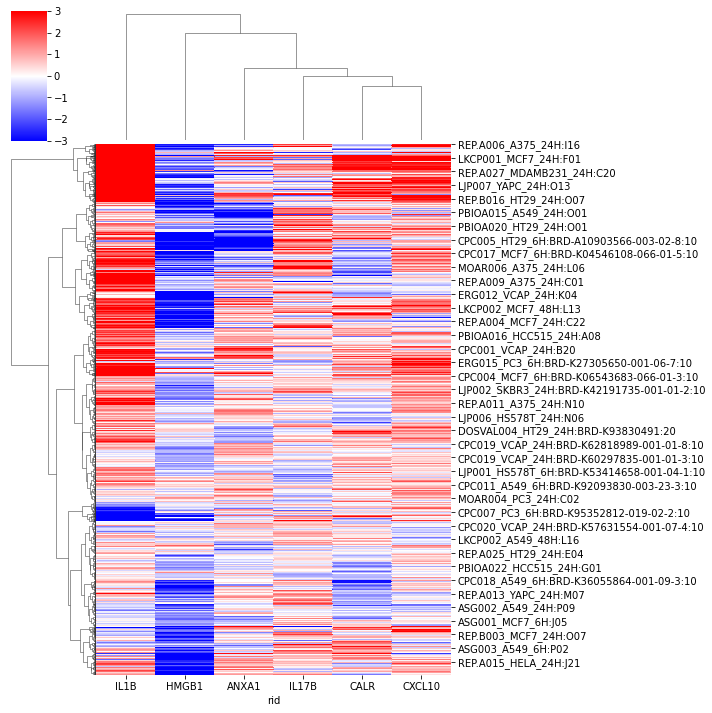

In [182]:
sns.clustermap(icd_rs_expr[icd_selected], cmap='bwr', vmin=-3, vmax=3, method='ward')

/home/dyang-server/anaconda3/lib/python3.8/site-packages/seaborn/matrix.py:659: UserWarning: Clustering large matrix with scipy. Installing `fastcluster` may give better performance.
  warnings.warn(msg)


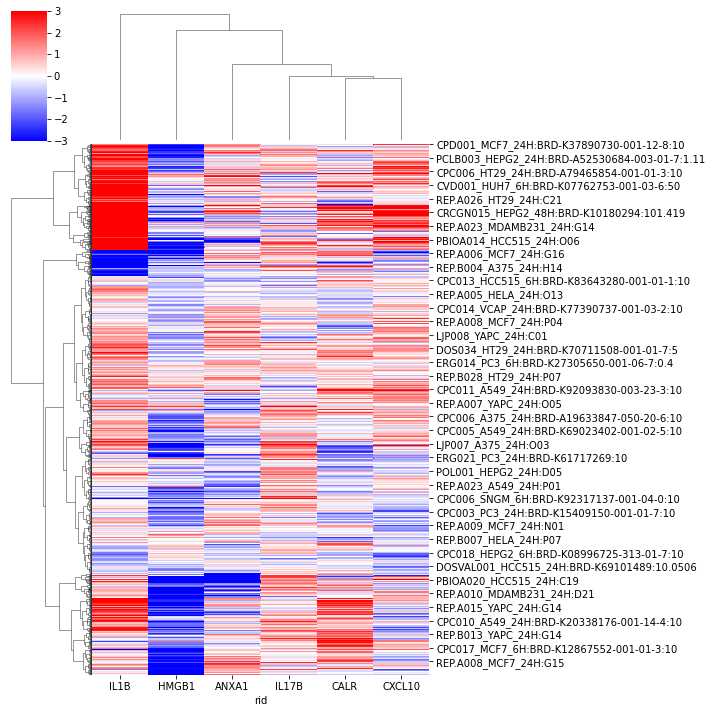

In [183]:
sns.clustermap(icd_selected_expr_matrix[icd_selected], cmap='bwr', vmin=-3, vmax=3, method='ward')

## ICD expr with shift ability

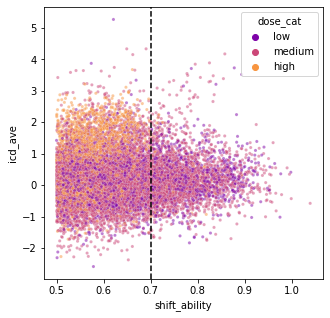

In [171]:
# shift_ability vs. icd_ave, only show 24h treatment
plt.figure(figsize=(5, 5))
sns.scatterplot(x='shift_ability',
                y='icd_ave',
                hue='dose_cat',
                palette='plasma',
                s=10, alpha=0.5,
                data=icd_rs_expr[icd_rs_expr['time'] == 24.])
plt.axvline(x=0.7, ls='--', c='k')

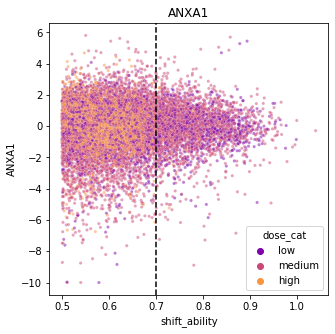

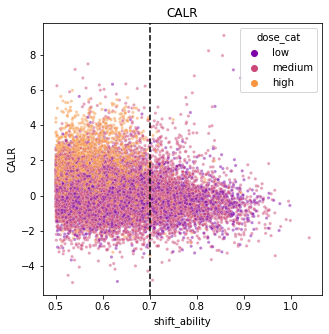

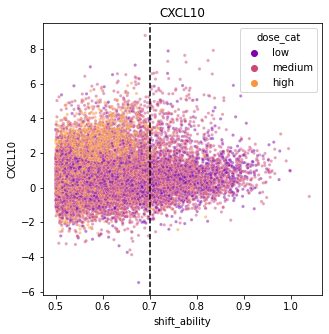

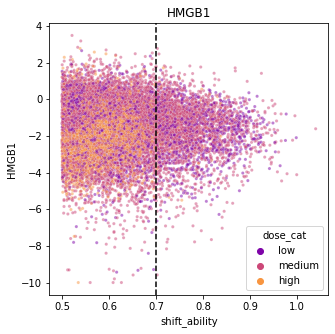

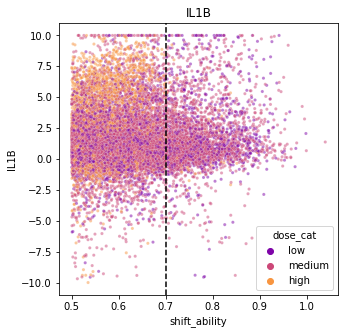

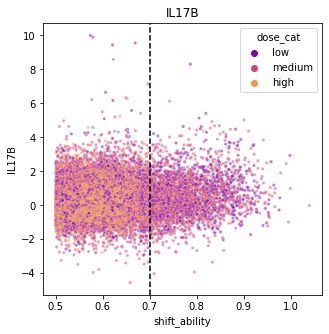

In [170]:
# shift_ability vs. icd individual genes, only show 24h treatment
for g in icd_selected:
    plt.figure(figsize=(5, 5))
    sns.scatterplot(x='shift_ability',
                    y=g,
                    hue='dose_cat',
                    palette='plasma',
                    s=10, alpha=0.5,
                    data=icd_rs_expr[icd_rs_expr['time'] == 24.])
    plt.axvline(x=0.7, ls='--', c='k')
    plt.title(g)
    plt.show()

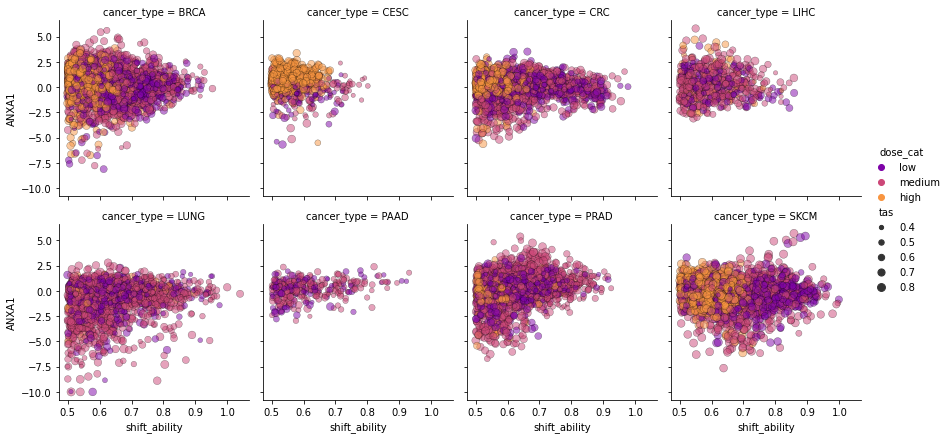

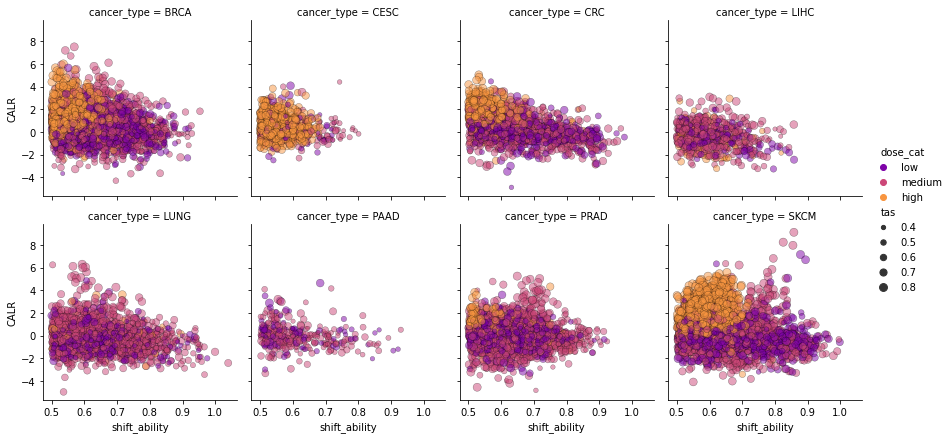

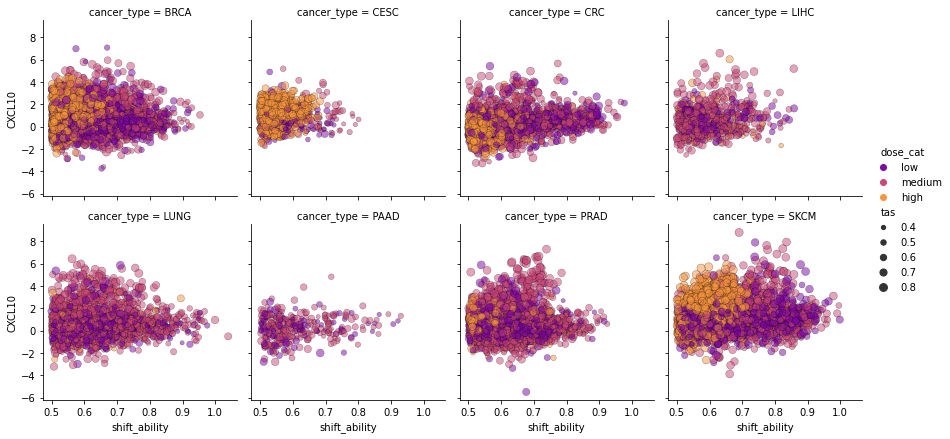

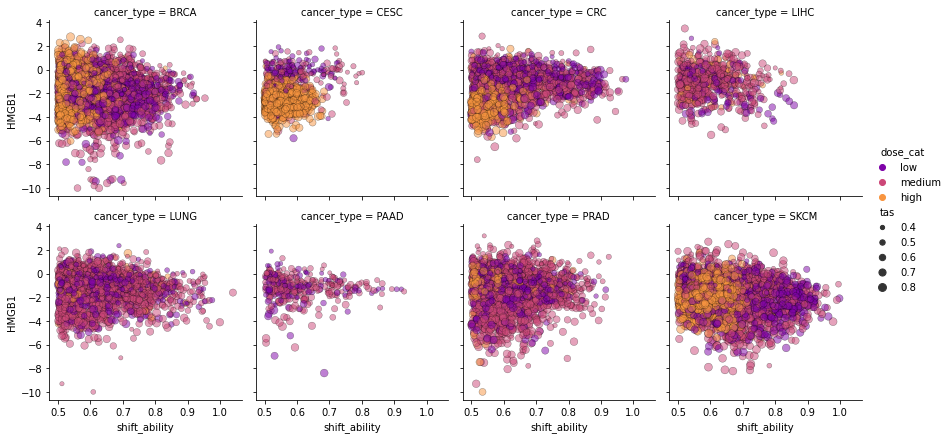

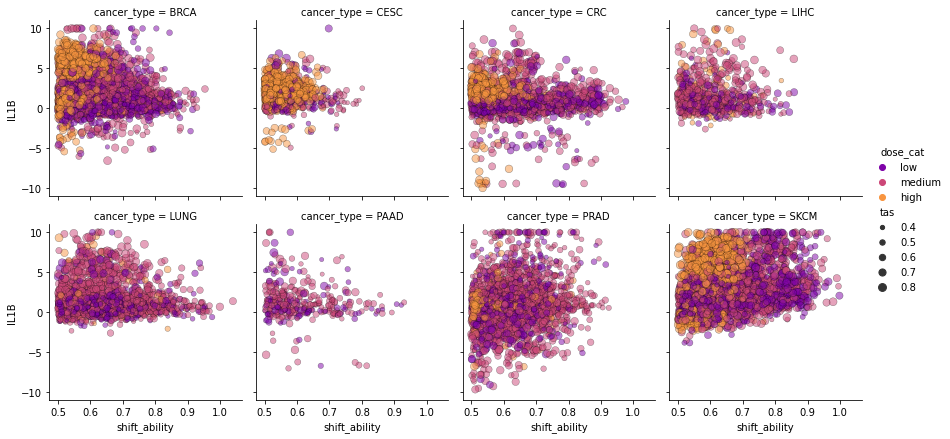

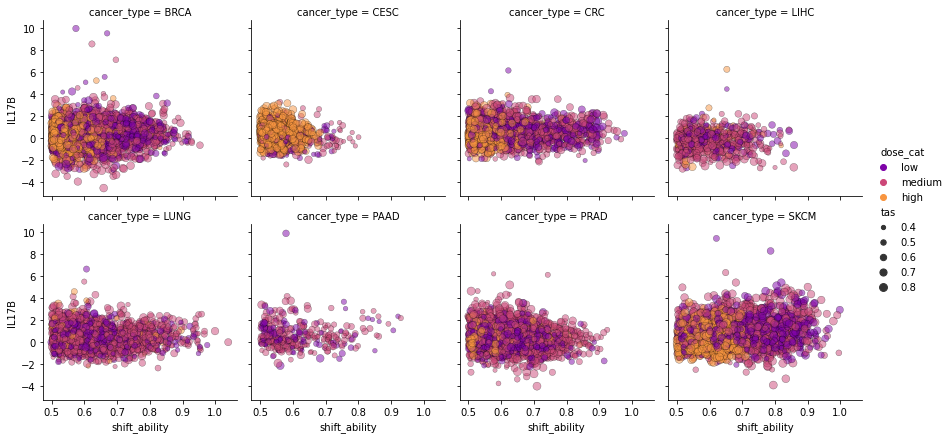

In [176]:
# shift_ability vs. icd individual genes, only show 24h treatment, by cancer
for g in icd_selected:
    sns.relplot(x='shift_ability', y=g,
                col='cancer_type', col_wrap=4,
                size='tas', size_order=['high', 'medium', 'low'],
                height=3, aspect=1,
                vmin=0.4, vmax=1,
                hue='dose_cat', palette='plasma',
                alpha=0.5, edgecolor='k',
                data=icd_rs_expr[icd_rs_expr['time'] == 24.])
    plt.show()

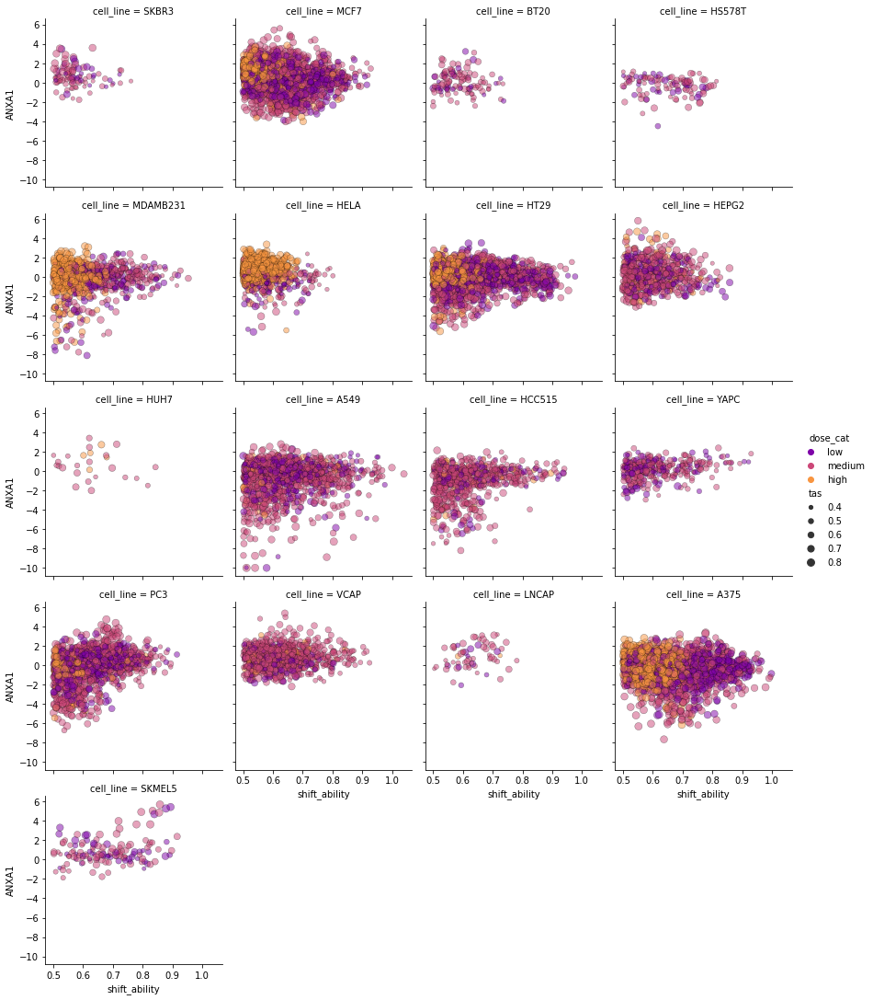

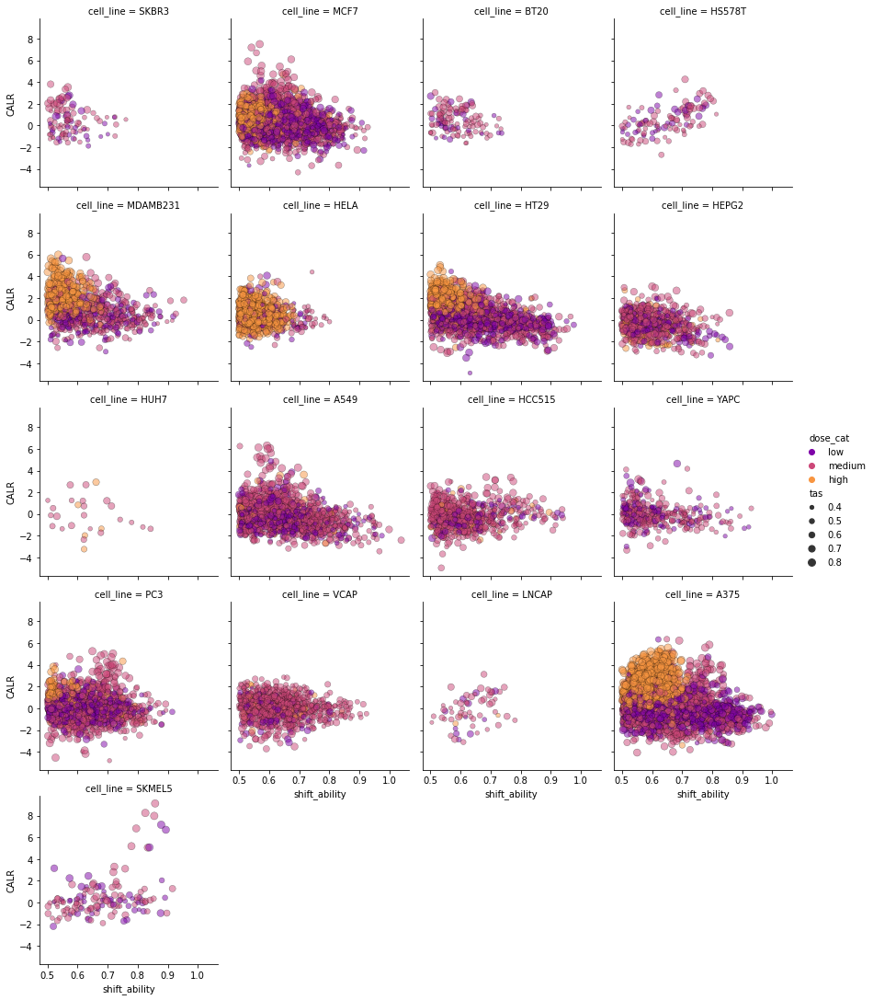

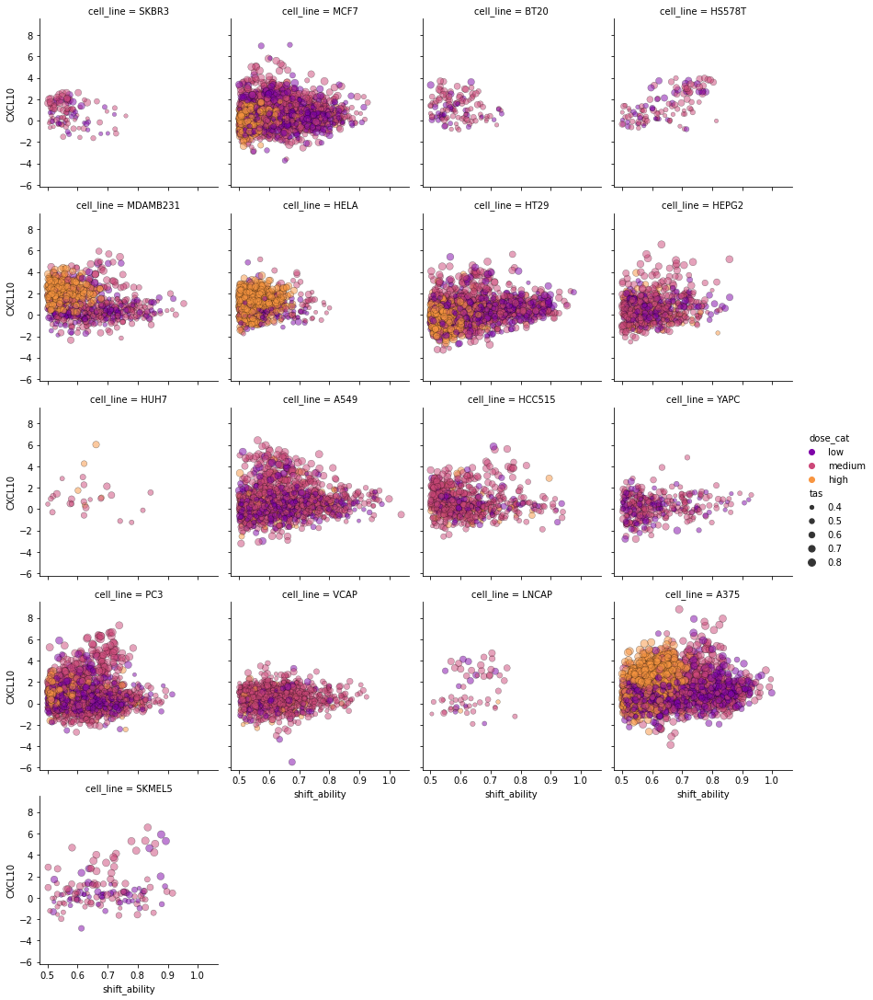

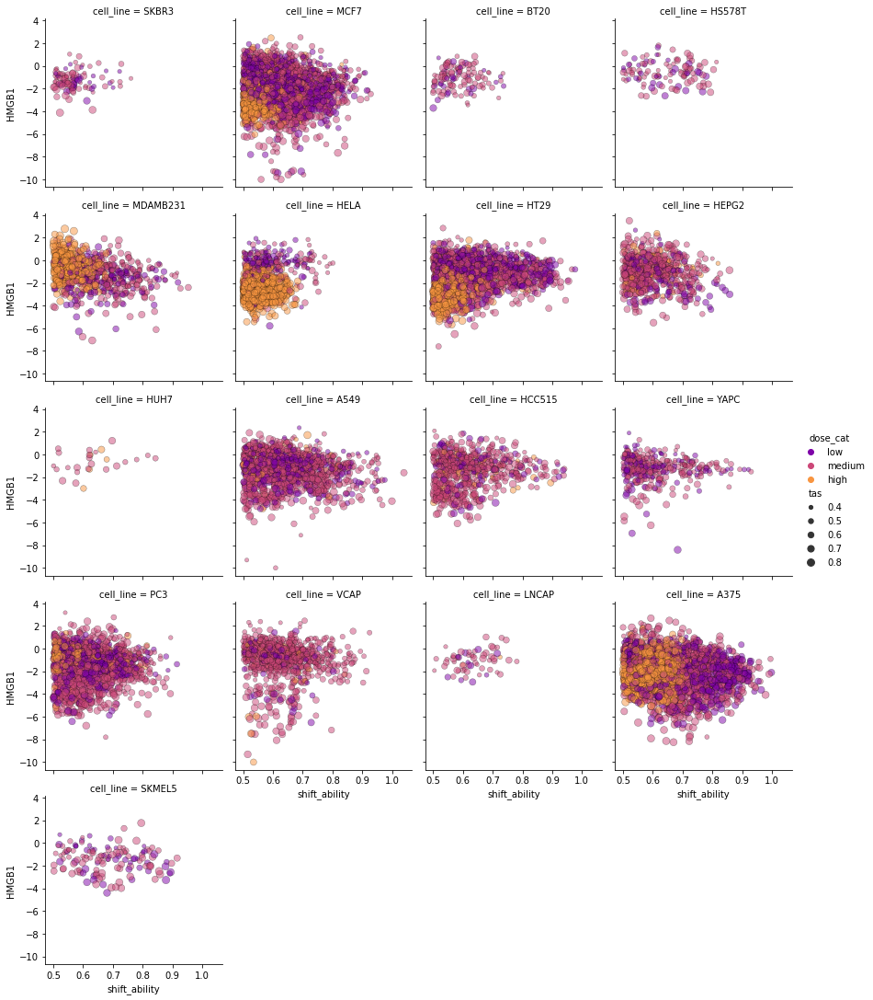

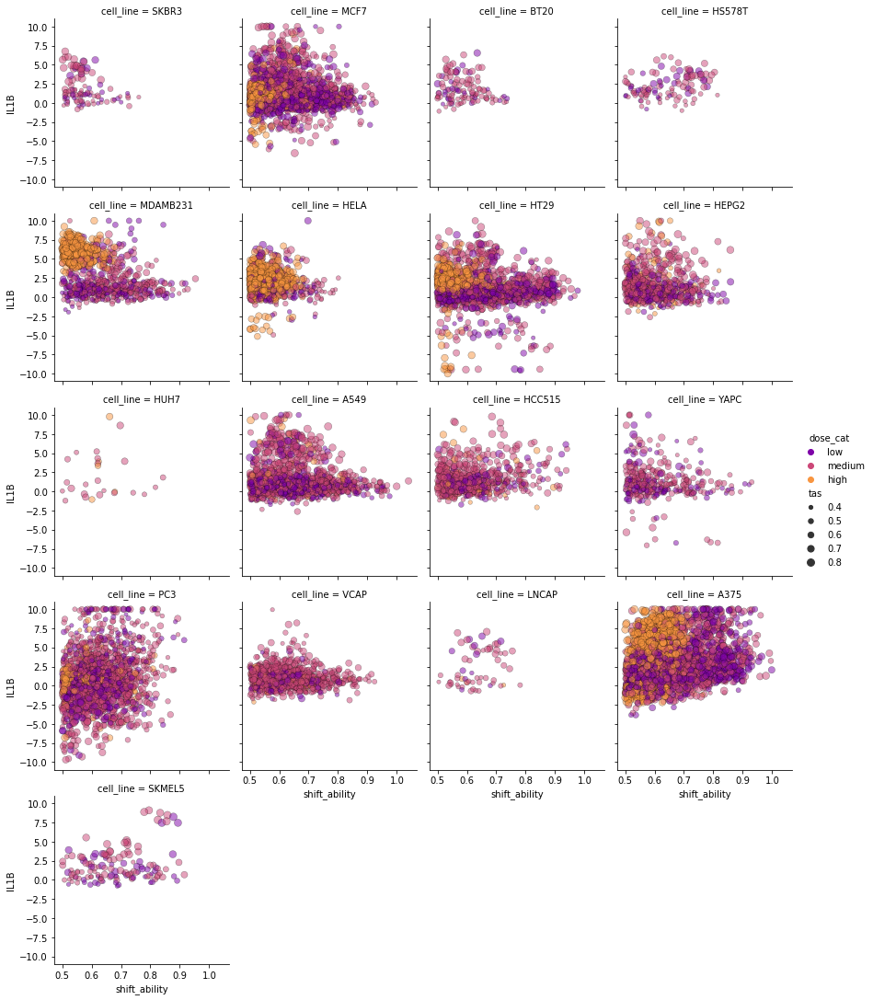

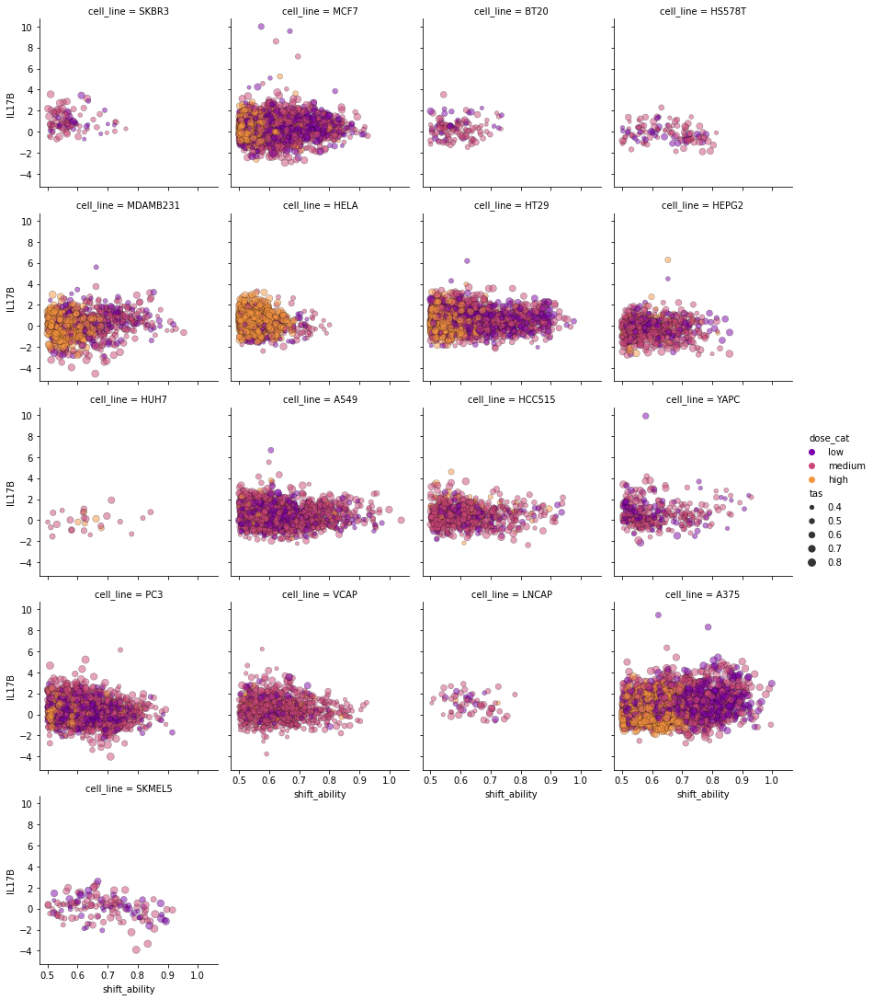

In [177]:
# shift_ability vs. icd individual genes, only show 24h treatment, by cell line
for g in icd_selected:
    sns.relplot(x='shift_ability', y=g,
                col='cell_line', col_wrap=4,
                size='tas', size_order=['high', 'medium', 'low'],
                height=3, aspect=1,
                vmin=0.4, vmax=1,
                hue='dose_cat', palette='plasma',
                alpha=0.5, edgecolor='k',
                data=icd_rs_expr[icd_rs_expr['time'] == 24.])
    plt.show()

In [191]:
icd_rs_expr_24h = icd_rs_expr[icd_rs_expr['time'] == 24.]

In [192]:
icd_rs_expr_24h['nearest_dose'] = sig_info['nearest_dose']

<ipython-input-192-53c6ea8ce2aa>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  icd_rs_expr_24h['nearest_dose'] = sig_info['nearest_dose']


In [193]:
icd_rs_expr_24h['cmap_name'] = enr_icd_nes_rs['cmap_name']

<ipython-input-193-95221b82aefa>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  icd_rs_expr_24h['cmap_name'] = enr_icd_nes_rs['cmap_name']


In [195]:
icd_rs_expr_24h.to_csv(poseidon_home + 'ICD/ICD_selected_R_shifting_expr_mega_24h.csv', sep=',')

In [197]:
icd_rs_expr_24h

rid,IL17B,ANXA1,HMGB1,IL1B,CXCL10,CALR,cancer_type,time,tas,cell_line,shift_ability,NREC_score,REC_score,dose_cat,icd_ave,nearest_dose,cmap_name
ABY001_SKBR3_XH:BRD-K19687926:0.625:24,0.725488,-0.080558,-1.902264,0.099334,-1.196432,-0.798939,BRCA,24.0,0.412509,SKBR3,0.700579,-0.416129,0.284450,low,-0.525562,0.66,lapatinib
ABY001_SKBR3_XH:BRD-K19687926:10:24,2.245165,0.645034,-1.938760,0.943041,-0.744277,-0.265049,BRCA,24.0,0.616939,SKBR3,0.620540,-0.361039,0.259501,medium,0.147526,10.00,lapatinib
ABY001_SKBR3_XH:BRD-K19687926:2.5:24,1.704193,-0.069342,-1.956619,0.831625,-0.583914,-1.188802,BRCA,24.0,0.533049,SKBR3,0.561296,-0.358472,0.202824,medium,-0.210477,2.50,lapatinib
ABY001_SKBR3_XH:BRD-K21680192:2.5:24,-0.708493,-1.509188,-0.739603,2.333850,2.008200,1.216831,BRCA,24.0,0.636131,SKBR3,0.530530,-0.263938,0.266592,medium,0.433600,2.50,mitoxantrone
ABY001_SKBR3_XH:BRD-K66175015:0.625:24,2.041274,0.258538,-1.501830,0.577796,1.269013,0.184602,BRCA,24.0,0.502163,SKBR3,0.690177,-0.341525,0.348652,low,0.471566,0.66,afatinib
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
REP.B028_A375_24H:K20,0.329950,0.267350,-2.871000,3.171600,2.476500,0.127500,SKCM,24.0,0.695585,A375,0.953838,-0.407992,0.545847,low,0.583650,0.74,brequinar
REP.B028_A375_24H:K21,-0.391300,-0.576100,-1.246500,3.648500,0.994700,-0.410800,SKCM,24.0,0.626767,A375,0.927420,-0.407876,0.519543,low,0.336417,0.25,brequinar
REP.B028_A375_24H:L07,-0.179300,0.695850,-3.437850,5.451600,1.976300,-1.651000,SKCM,24.0,0.696944,A375,0.945450,-0.406314,0.539136,medium,0.475933,2.22,BRD-K63750851
REP.B028_A375_24H:L08,0.899700,0.181400,-2.168100,4.372800,1.355750,-1.420200,SKCM,24.0,0.648442,A375,0.909560,-0.386062,0.523497,low,0.536892,0.74,BRD-K63750851


In [201]:
# dosage-dependence in each cell line (R-shifting): gene level, 24h treatment only
dose_dep_icd_rs_g24 = df(columns=['shift_r', 'shift_p', 'rec_r', 'rec_p', 'nrec_r', 'nrec_p',
                            'icd_ave_r', 'icd_ave_p'])
for ct in icd_rs_expr_24h['cancer_type'].unique():
    tmp_rs = icd_rs_expr_24h[icd_rs_expr_24h['cancer_type'] == ct]
    for cl in tmp_rs['cell_line'].unique():
        tmp_rs_cl = tmp_rs[tmp_rs['cell_line'] == cl]
        for d in tmp_rs_cl['cmap_name'].unique():
            tmp_rs_cl_d = tmp_rs_cl[tmp_rs_cl['cmap_name'] == d]
            if tmp_rs_cl_d.shape[0] >= 5:
                tmp_a_r, tmp_a_p = stats.spearmanr(tmp_rs_cl_d['shift_ability'], tmp_rs_cl_d['nearest_dose'])
                tmp_g_r, tmp_g_p = stats.spearmanr(tmp_rs_cl_d['REC_score'], tmp_rs_cl_d['nearest_dose'])
                tmp_ng_r, tmp_ng_p = stats.spearmanr(tmp_rs_cl_d['NREC_score'], tmp_rs_cl_d['nearest_dose'])
                tmp_m_r, tmp_m_p = stats.spearmanr(tmp_rs_cl_d['icd_ave'], tmp_rs_cl_d['nearest_dose'])
                
                dose_dep_icd_rs_g24.at[cl + '_' + d, 'shift_r'] = tmp_a_r
                dose_dep_icd_rs_g24.at[cl + '_' + d, 'shift_p'] = tmp_a_p
                dose_dep_icd_rs_g24.at[cl + '_' + d, 'rec_r'] = tmp_g_r
                dose_dep_icd_rs_g24.at[cl + '_' + d, 'rec_p'] = tmp_g_p
                dose_dep_icd_rs_g24.at[cl + '_' + d, 'nrec_r'] = tmp_ng_r
                dose_dep_icd_rs_g24.at[cl + '_' + d, 'nrec_p'] = tmp_ng_p
                dose_dep_icd_rs_g24.at[cl + '_' + d, 'icd_ave_r'] = tmp_m_r
                dose_dep_icd_rs_g24.at[cl + '_' + d, 'icd_ave_p'] = tmp_m_p
                
                
                for g in icd_selected:
                    tmp_a_r, tmp_a_p = stats.spearmanr(tmp_rs_cl_d[g], tmp_rs_cl_d['nearest_dose'])
                    dose_dep_icd_rs_g24.at[cl + '_' + d, g + '_r'] = tmp_a_r
                    dose_dep_icd_rs_g24.at[cl + '_' + d, g + '_p'] = tmp_a_p
                
                
                dose_dep_icd_rs_g24.at[cl + '_' + d, 'cancer_type'] = ct
                dose_dep_icd_rs_g24.at[cl + '_' + d, 'cell_line'] = cl
                dose_dep_icd_rs_g24.at[cl + '_' + d, 'cmap_name'] = d
                dose_dep_icd_rs_g24.at[cl + '_' + d, '#experiments'] = tmp_rs_cl_d.shape[0]
                dose_dep_icd_rs_g24.at[cl + '_' + d, 'moa'] = compound_info.loc[d, 'moa']
                dose_dep_icd_rs_g24.at[cl + '_' + d, 'target'] = compound_info.loc[d, 'target']

/home/dyang-server/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


In [202]:
dose_dep_icd_rs_g24

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_ave_r,icd_ave_p,ANXA1_r,ANXA1_p,...,IL1B_r,IL1B_p,IL17B_r,IL17B_p,cancer_type,cell_line,cmap_name,#experiments,moa,target
SKBR3_mitoxantrone,0.176547,0.737931,-0.0882735,0.867934,-0.882735,0.0198204,0.794461,0.0590276,0.706188,0.116807,...,0.882735,0.019820,0.794461,0.059028,BRCA,SKBR3,mitoxantrone,6.0,Topoisomerase inhibitor,TOP2A
SKBR3_afatinib,0.0857143,0.871743,-0.257143,0.622787,-0.0857143,0.871743,0.371429,0.468478,-0.485714,0.328723,...,0.028571,0.957155,-0.142857,0.787172,BRCA,SKBR3,afatinib,6.0,EGFR inhibitor,EGFR
SKBR3_neratinib,-0.175734,0.651084,0.43515,0.241757,0.661094,0.0525229,0.217575,0.573875,-0.460255,0.212522,...,0.569043,0.109804,0.000000,1.000000,BRCA,SKBR3,neratinib,9.0,EGFR inhibitor,EGFR
SKBR3_CGP-60474,-0.265079,0.525768,-0.25303,0.545429,-0.0843435,0.842604,0.228932,0.585514,0.337374,0.413785,...,0.144589,0.732651,0.192785,0.647384,BRCA,SKBR3,CGP-60474,8.0,CDK inhibitor,CDK1
SKBR3_NVP-BEZ235,-0.6,0.284757,-0.6,0.284757,0.7,0.18812,-0.6,0.284757,0.100000,0.872889,...,-0.700000,0.188120,0.100000,0.872889,BRCA,SKBR3,NVP-BEZ235,5.0,MTOR inhibitor,MTOR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SKMEL5_cobimetinib,0.6,0.208,0.485714,0.328723,-0.828571,0.0415627,0.542857,0.265703,0.485714,0.328723,...,0.085714,0.871743,0.371429,0.468478,SKCM,SKMEL5,cobimetinib,6.0,NaN,NaN
SKMEL5_selumetinib,0.9,0.0373861,0.6,0.284757,-0.9,0.0373861,0.2,0.74706,0.200000,0.747060,...,0.500000,0.391002,-0.100000,0.872889,SKCM,SKMEL5,selumetinib,5.0,MEK inhibitor,MAP2K1
SKMEL5_bortezomib,0.126592,0.745527,0.126592,0.745527,0.253185,0.51098,0.970542,1.40362e-05,0.903026,0.000849,...,0.936784,0.000197,-0.438854,0.237315,SKCM,SKMEL5,bortezomib,9.0,Proteasome inhibitor,PSMB1
SKMEL5_dinaciclib,0.2,0.704,0.257143,0.622787,-0.142857,0.787172,0.942857,0.00480466,0.371429,0.468478,...,0.828571,0.041563,0.428571,0.396501,SKCM,SKMEL5,dinaciclib,6.0,CDK inhibitor,CDK2


In [203]:
dose_dep_icd_rs_g24.to_csv(poseidon_home + 'results/compound_top_moa/all_Rshifting_ICD_gene_24h_dose_dependence.csv', sep=',')

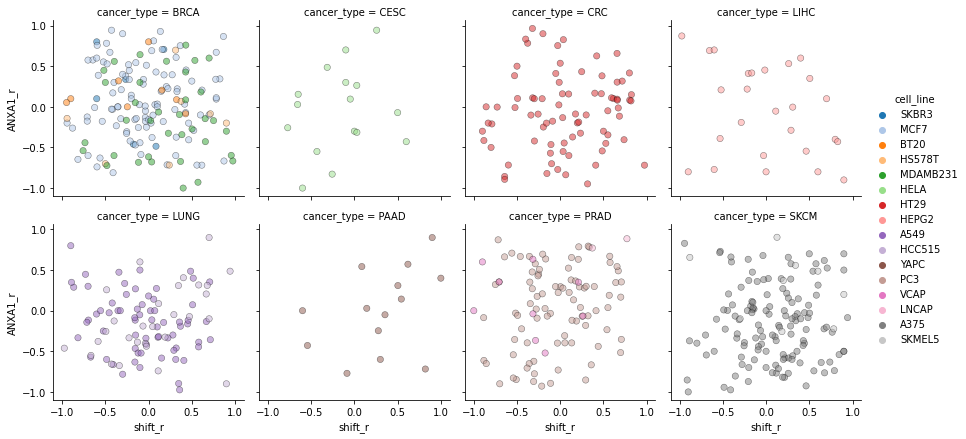

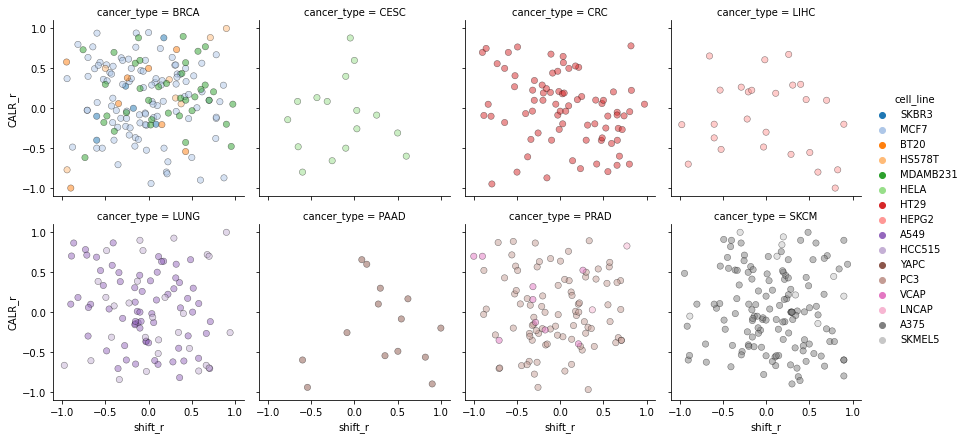

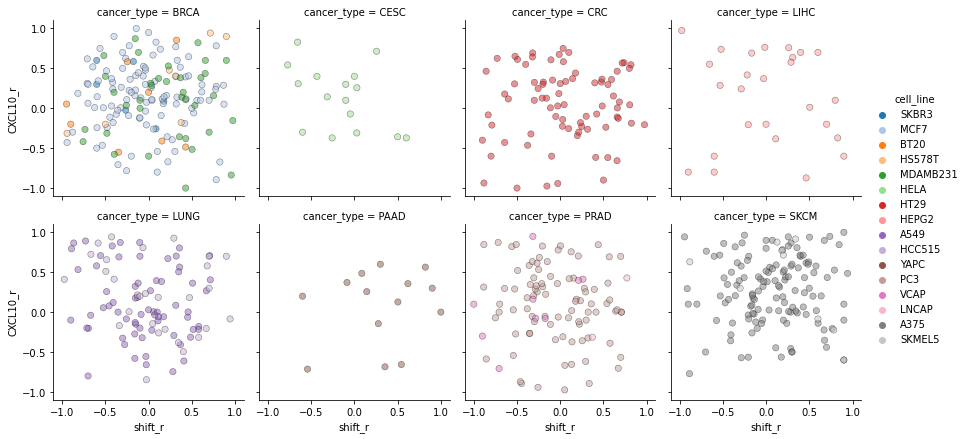

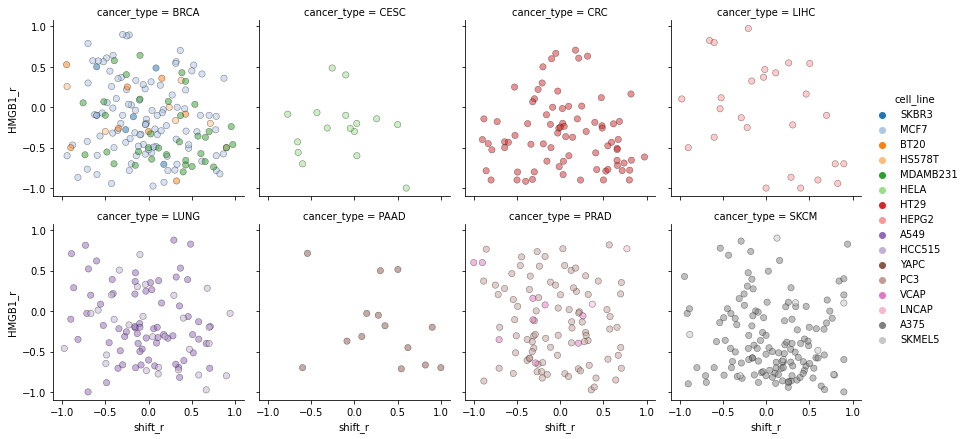

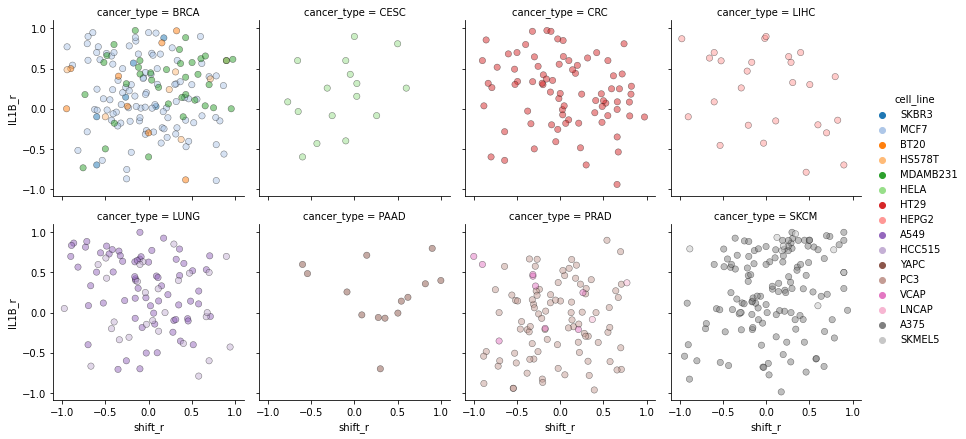

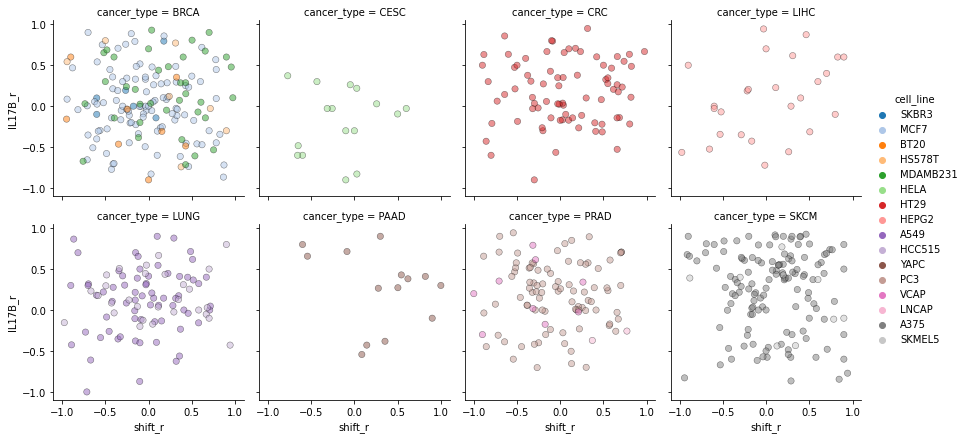

In [212]:
# dose-dep: shift_ability vs. icd individual genes, only show 24h treatment, by cell line
for g in icd_selected:
    sns.relplot(x='shift_r', y=g + '_r',
                col='cancer_type', col_wrap=4,
                hue='cell_line', palette='tab20',
                s=40,
                height=3, aspect=1,
                vmin=0.4, vmax=1,
                alpha=0.5, edgecolor='k',
                data=dose_dep_icd_rs_g24)
    plt.show()

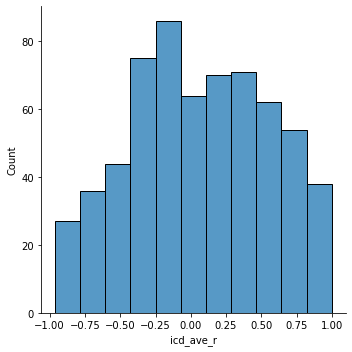

In [214]:
# dose-dep: icd_ave all
sns.displot(dose_dep_icd_rs_g24['icd_ave_r'])

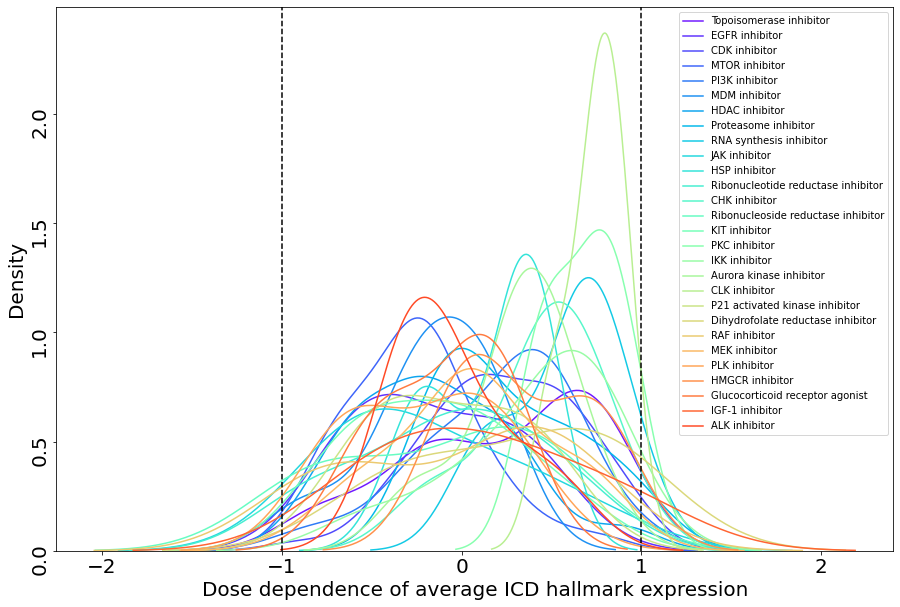

In [229]:
sns.set_palette('rainbow', 30)
plt.figure(figsize=(15, 10))
for m in dose_dep_icd_rs_g24['moa'].unique():
    tmp = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24['moa'] == m]
    if tmp.shape[0] >= 5:
        sns.kdeplot(tmp['icd_ave_r'].astype(float), label=m)

plt.axvline(x=-1., ls='--', c='k')
plt.axvline(x=1., ls='--', c='k')
plt.xticks(fontsize=20)
plt.yticks(fontsize=20, rotation=90)
plt.xlabel('Dose dependence of average ICD hallmark expression', fontsize=20)
plt.ylabel('Density', fontsize=20)
plt.legend()

In [231]:
dose_dep_icd_rs_g24.sort_values(by='icd_ave_r', ascending=False)[:20]

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_ave_r,icd_ave_p,ANXA1_r,ANXA1_p,...,IL1B_r,IL1B_p,IL17B_r,IL17B_p,cancer_type,cell_line,cmap_name,#experiments,moa,target
MCF7_OTS-167,-0.3,0.623838,0,1,-0.1,0.872889,1,1.40427e-24,0.900000,0.037386,...,0.200000,7.470601e-01,0.300000,0.623838,BRCA,MCF7,OTS-167,5.0,NaN,NaN
MDAMB231_PHA-793887,-0.153897,0.804829,-0.153897,0.804829,0.410391,0.492536,0.974679,0.00481823,0.051299,0.934713,...,0.974679,4.818230e-03,0.205196,0.740582,BRCA,MDAMB231,PHA-793887,5.0,CDK inhibitor,CDK2
SKMEL5_bortezomib,0.126592,0.745527,0.126592,0.745527,0.253185,0.51098,0.970542,1.40362e-05,0.903026,0.000849,...,0.936784,1.965329e-04,-0.438854,0.237315,SKCM,SKMEL5,bortezomib,9.0,Proteasome inhibitor,PSMB1
HCC515_daunorubicin,0.29277,0.481618,0.58554,0.127247,0.29277,0.481618,0.951503,0.000274893,-0.048795,0.908654,...,0.853913,6.965288e-03,-0.024398,0.954273,LUNG,HCC515,daunorubicin,8.0,RNA synthesis inhibitor,TOP2A
VCAP_troglitazone,-0.316228,0.604181,0,1,0.632456,0.252215,0.948683,0.0138468,0.632456,0.252215,...,0.474342,4.195311e-01,0.790569,0.111367,PRAD,VCAP,troglitazone,5.0,Insulin sensitizer,PPARG
MCF7_KUC111774N,0,1,-0.158114,0.799525,-0.316228,0.604181,0.948683,0.0138468,-0.158114,0.799525,...,0.948683,1.384683e-02,0.000000,1.000000,BRCA,MCF7,KUC111774N,5.0,NaN,NaN
MCF7_R-547,0.136201,0.726787,0.519266,0.151965,0.29794,0.436166,0.944895,0.000122522,0.927870,0.000309,...,0.681005,4.343356e-02,-0.263890,0.492636,BRCA,MCF7,R-547,9.0,NaN,NaN
A549_staurosporine,0.485714,0.328723,0.485714,0.328723,0.142857,0.787172,0.942857,0.00480466,0.485714,0.328723,...,0.142857,7.871720e-01,0.714286,0.110787,LUNG,A549,staurosporine,6.0,PKC inhibitor,CDK2
SKMEL5_dinaciclib,0.2,0.704,0.257143,0.622787,-0.142857,0.787172,0.942857,0.00480466,0.371429,0.468478,...,0.828571,4.156268e-02,0.428571,0.396501,SKCM,SKMEL5,dinaciclib,6.0,CDK inhibitor,CDK2
MCF7_epirubicin,-0.644909,0.00698893,0.043093,0.874093,0.775673,0.000413602,0.930214,1.79486e-07,0.576554,0.019393,...,0.948045,2.386998e-08,-0.508200,0.044439,BRCA,MCF7,epirubicin,16.0,Topoisomerase inhibitor,TOP2A


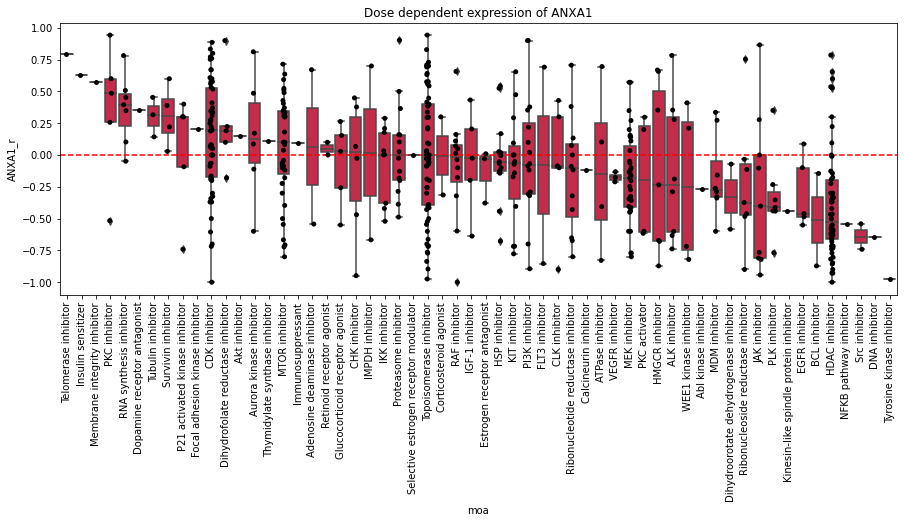

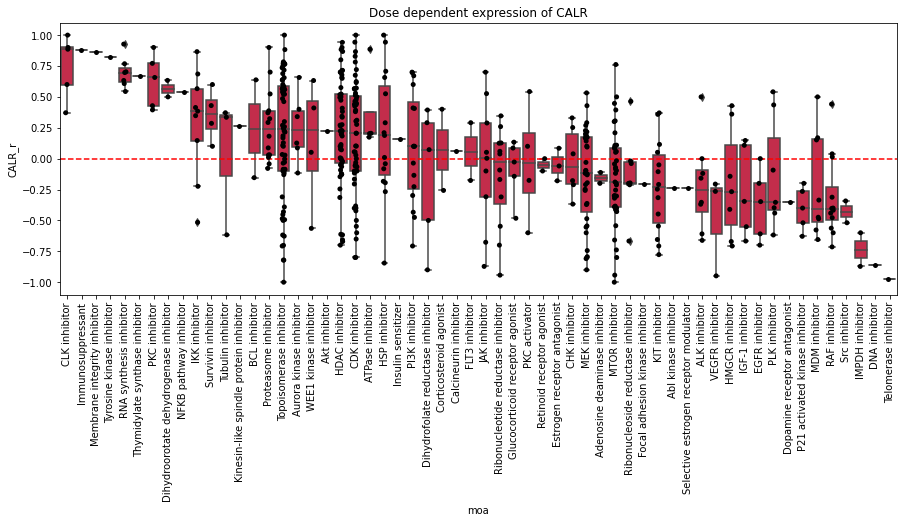

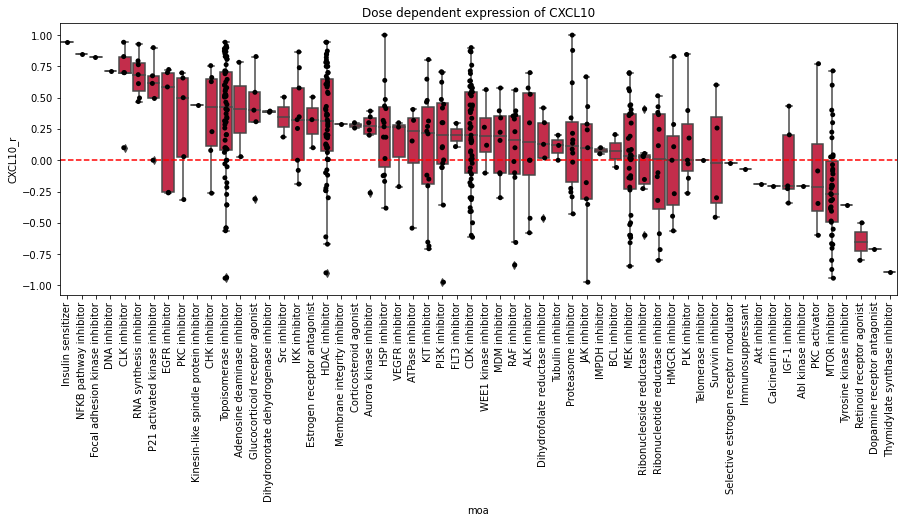

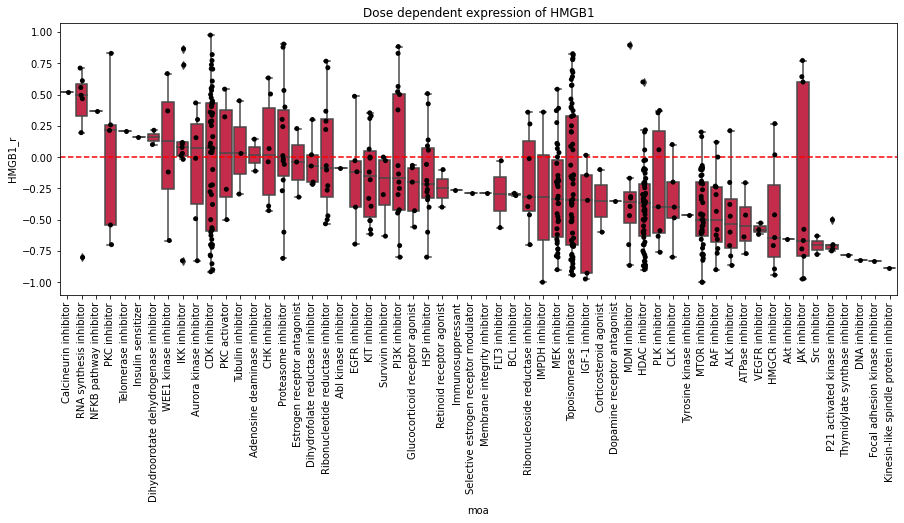

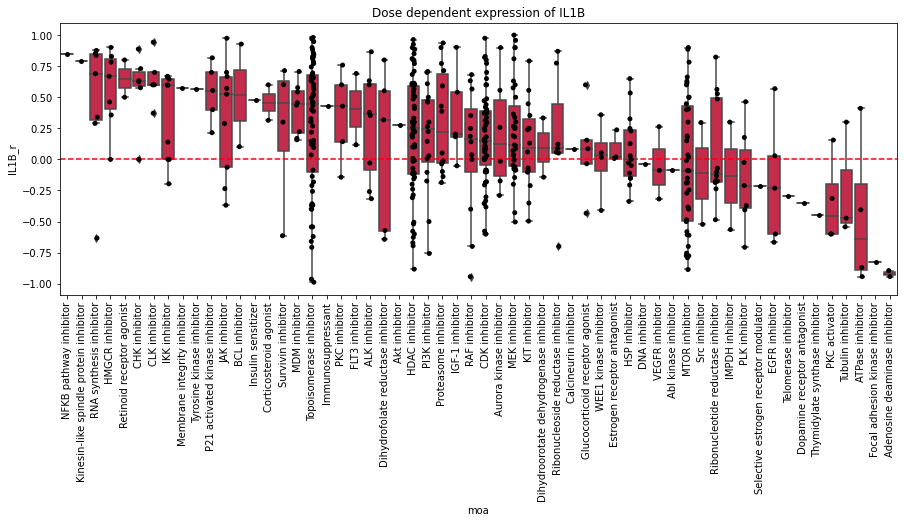

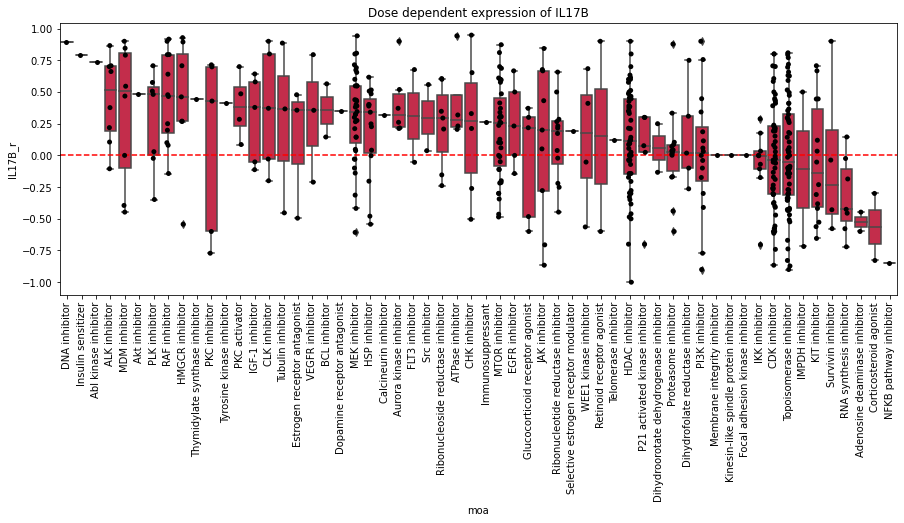

In [246]:
for g in icd_selected:
    plt.figure(figsize=(15, 5))
    sns.boxplot(x='moa', y=g + '_r', color='crimson',
                order=df(dose_dep_icd_rs_g24.groupby(['moa']).median()).sort_values(by=g + '_r', ascending=False).index,
                data=dose_dep_icd_rs_g24)

    sns.stripplot(x='moa', y=g + '_r',
                  order=df(dose_dep_icd_rs_g24.groupby(['moa']).median()).sort_values(by=g + '_r', ascending=False).index,
                  color='k', size=5, data=dose_dep_icd_rs_g24)

    plt.xticks(rotation=90)
    plt.axhline(y=0.0, ls='--', color='r')
    plt.title('Dose dependent expression of ' + g)
    fig = plt.gcf()
    fig.savefig(panel_home + g + '_ICD_dose_dependence_by_moa.png', transparent=True, dpi=300)
    fig.savefig(panel_home + g + '_ICD_dose_dependence_by_moa.pdf', transparent=True)


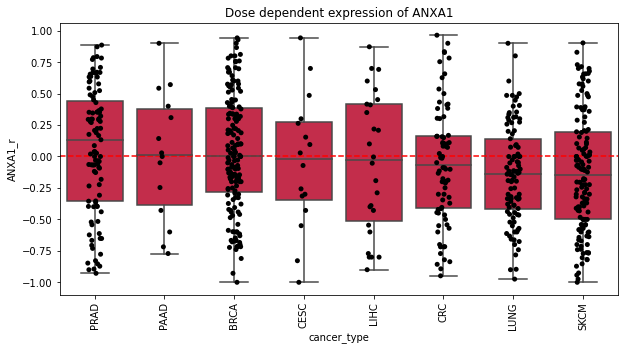

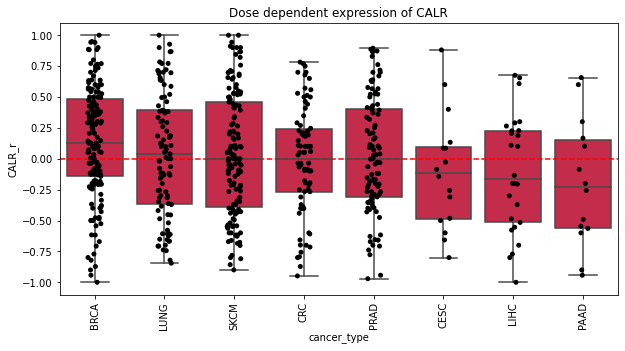

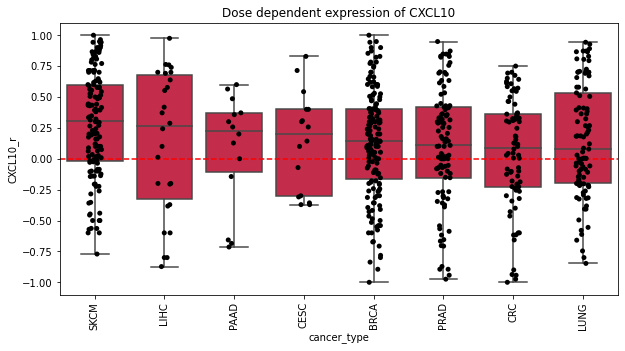

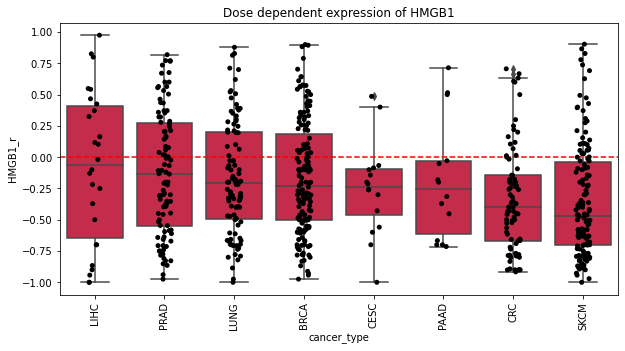

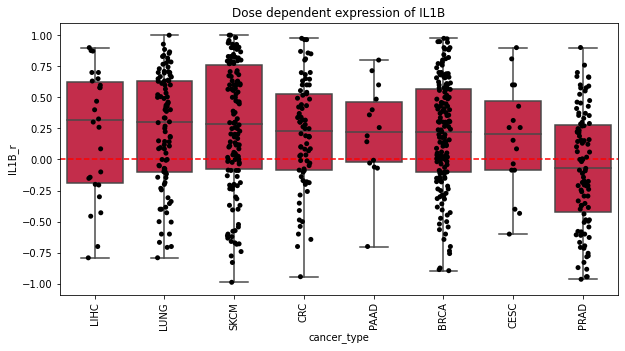

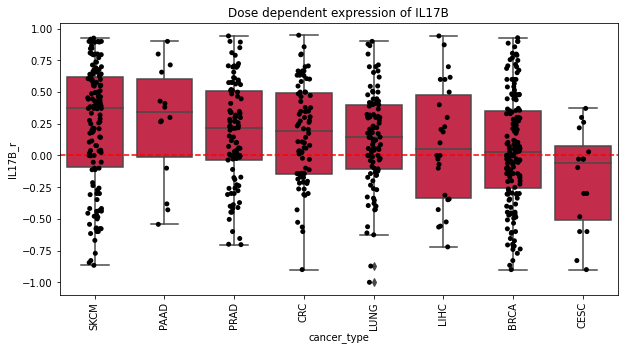

In [257]:
for g in icd_selected:
    plt.figure(figsize=(10, 5))
    sns.boxplot(x='cancer_type', y=g + '_r', color='crimson',
                order=df(dose_dep_icd_rs_g24.groupby(['cancer_type']).median()).sort_values(by=g + '_r', ascending=False).index,
                data=dose_dep_icd_rs_g24)

    sns.stripplot(x='cancer_type', y=g + '_r',
                  order=df(dose_dep_icd_rs_g24.groupby(['cancer_type']).median()).sort_values(by=g + '_r', ascending=False).index,
                  color='k', size=5, data=dose_dep_icd_rs_g24)

    plt.xticks(rotation=90)
    plt.axhline(y=0.0, ls='--', color='r')
    plt.title('Dose dependent expression of ' + g)
    fig = plt.gcf()
    fig.savefig(panel_home + g + '_ICD_dose_dependence_by_cancer.png', transparent=True, dpi=300)
    fig.savefig(panel_home + g + '_ICD_dose_dependence_by_cancer.pdf', transparent=True)

Text(0.5, 1.0, 'Average ICD hallmarks')

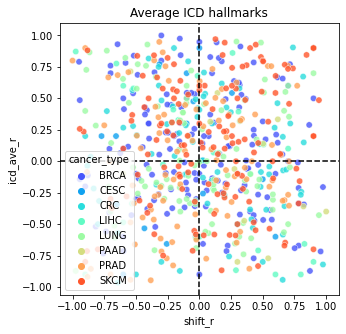

In [298]:
plt.figure(figsize=(5, 5))
sns.scatterplot(x='shift_r',
                y='icd_ave_r',
                hue='cancer_type',
                palette='rainbow',
                s=40, alpha=0.8,
                data=dose_dep_icd_rs_g24)
plt.axvline(x=0.0, ls='--', c='k')
plt.axhline(y=0.0, ls='--', c='k')
plt.title('Average ICD hallmarks')

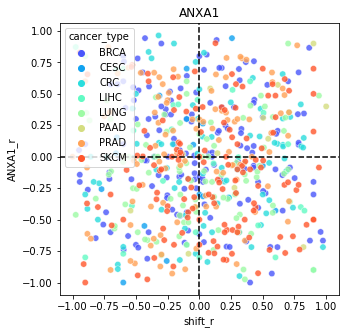

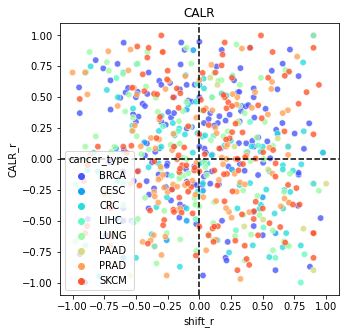

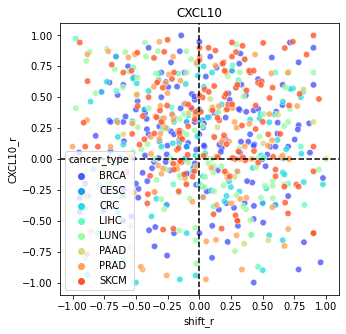

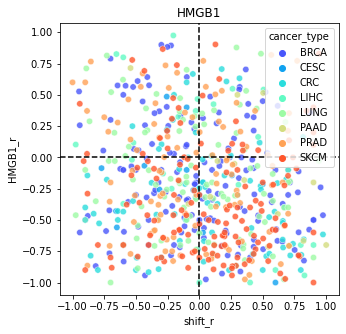

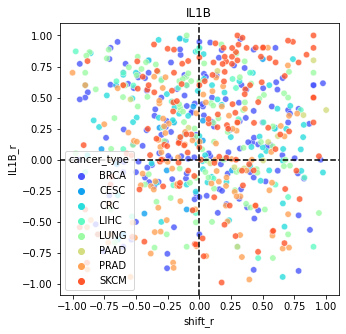

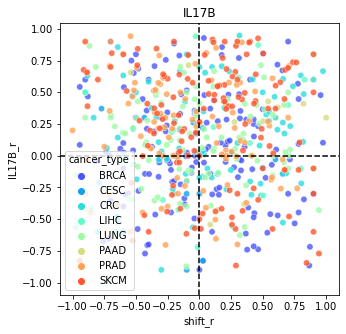

In [254]:
# dose_dependence: shift_ability vs. icd individual genes, only show 24h treatment
for g in icd_selected:
    plt.figure(figsize=(5, 5))
    sns.scatterplot(x='shift_r',
                    y=g + '_r',
                    hue='cancer_type',
                    palette='rainbow',
                    s=40, alpha=0.8,
                    data=dose_dep_icd_rs_g24)
    plt.axvline(x=0.0, ls='--', c='k')
    plt.axhline(y=0.0, ls='--', c='k')
    plt.title(g)
    plt.show()

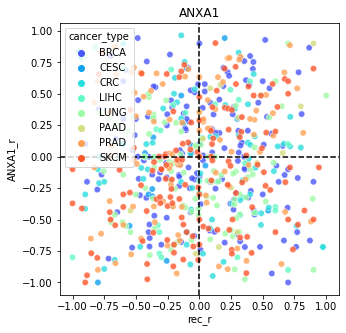

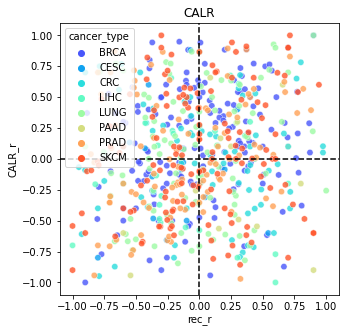

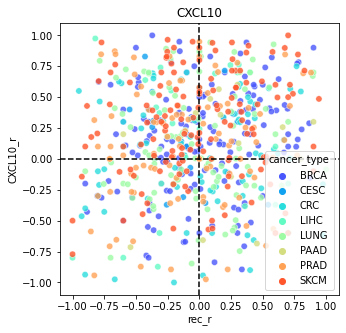

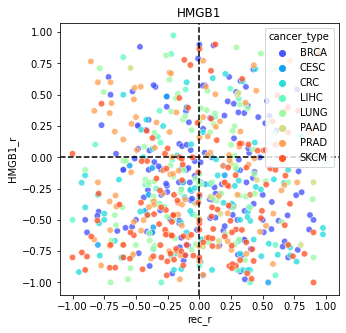

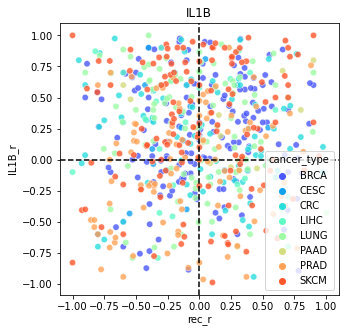

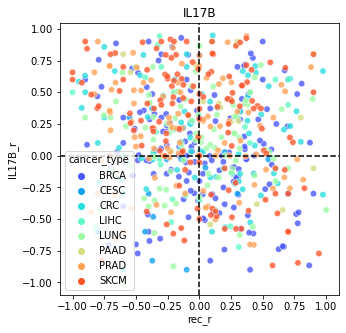

In [255]:
# dose_dependence: REC_score vs. icd individual genes, only show 24h treatment
for g in icd_selected:
    plt.figure(figsize=(5, 5))
    sns.scatterplot(x='rec_r',
                    y=g + '_r',
                    hue='cancer_type',
                    palette='rainbow',
                    s=40, alpha=0.8,
                    data=dose_dep_icd_rs_g24)
    plt.axvline(x=0.0, ls='--', c='k')
    plt.axhline(y=0.0, ls='--', c='k')
    plt.title(g)
    plt.show()

In [258]:
# I: Shift through ICD at low dosage: high shift and high ICD at low dosage, low shift and low ICD at high dosage
# II: Shift through ICD at high dosage: high shift and high ICD at high dosage, low shift and low ICD at low dosage
# III: Shift through ICD-independent at low dosage: high shift and low ICD at low dosage, low shift at high dosage
# IV: Shift through ICD-independent at high dosage: high shift and low ICD at high dosage, low shift at low dosage

In [297]:
dose_dep_icd_rs_g24.shape

(639, 26)

## Primary selection: Ave ICD expression

In [284]:
cat_I = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24['shift_r'] < -.5]
cat_I = cat_I[cat_I['icd_ave_r'] < -.5]
cat_I_icd = cat_I[[g + '_r' for g in icd_selected]]
print(cat_I_icd.shape)

cat_I_icd_moa = cat_I_icd.copy()
cat_I_icd_moa['moa'] = dose_dep_icd_rs_g24['moa']

(20, 6)


In [285]:
cat_I_icd_moa['moa'].value_counts()

HDAC inhibitor                        6
Ribonucleotide reductase inhibitor    2
Ribonucleoside reductase inhibitor    1
ATPase inhibitor                      1
RAF inhibitor                         1
CDK inhibitor                         1
EGFR inhibitor                        1
MTOR inhibitor                        1
PLK inhibitor                         1
Name: moa, dtype: int64

In [296]:
cat_I

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_ave_r,icd_ave_p,ANXA1_r,ANXA1_p,...,IL1B_r,IL1B_p,IL17B_r,IL17B_p,cancer_type,cell_line,cmap_name,#experiments,moa,target
SKBR3_NVP-BEZ235,-0.6,0.284757,-0.6,0.284757,0.7,0.18812,-0.6,0.284757,0.100000,8.728886e-01,...,-0.700000,0.188120,0.100000,0.872889,BRCA,SKBR3,NVP-BEZ235,5.0,MTOR inhibitor,MTOR
MCF7_PCI-24781,-0.817206,0.00715465,-0.391578,0.297311,0.851257,0.00360193,-0.519266,0.151965,-0.646955,5.965874e-02,...,-0.519266,0.151965,-0.042563,0.913423,BRCA,MCF7,PCI-24781,9.0,HDAC inhibitor,HDAC6
MCF7_SB-939,-0.59666,0.0898701,0.00840366,0.982881,0.613467,0.0789152,-0.714311,0.0306167,-0.739522,2.276753e-02,...,0.243706,0.527446,0.025211,0.948668,BRCA,MCF7,SB-939,9.0,HDAC inhibitor,HDAC5
MDAMB231_BI-2536,-0.735612,0.0956108,-0.647339,0.164625,-0.470792,0.345986,-0.559065,0.248771,-0.441367,3.809392e-01,...,0.176547,0.737931,0.029424,0.955876,BRCA,MDAMB231,BI-2536,6.0,PLK inhibitor,PLK1
MDAMB231_BRD-K68552125,-0.757576,0.0111434,-0.393939,0.259998,0.733333,0.0158006,-0.733333,0.0158006,-0.539394,1.075932e-01,...,-0.735566,0.015323,-0.672727,0.033041,BRCA,MDAMB231,BRD-K68552125,10.0,NaN,NaN
HELA_dinaciclib,-0.6,0.284757,-0.8,0.104088,-0.1,0.872889,-0.9,0.0373861,-1.000000,1.404265e-24,...,-0.600000,0.284757,-0.600000,0.284757,CESC,HELA,dinaciclib,5.0,CDK inhibitor,CDK2
HT29_PCI-24781,-0.642857,0.119392,-0.0714286,0.879048,0.464286,0.293934,-0.571429,0.180202,-0.857143,1.369733e-02,...,-0.285714,0.534509,0.142857,0.759945,CRC,HT29,PCI-24781,7.0,HDAC inhibitor,HDAC6
HT29_bruceantin,-0.642857,0.119392,-0.75,0.0521814,0.642857,0.119392,-0.964286,0.000454149,-0.892857,6.807187e-03,...,-0.642857,0.119392,0.857143,0.013697,CRC,HT29,bruceantin,7.0,NaN,NaN
HEPG2_gemcitabine,-0.9,0.0373861,-1,1.40427e-24,0,1,-0.9,0.0373861,-0.800000,1.040880e-01,...,-0.100000,0.872889,0.500000,0.391002,LIHC,HEPG2,gemcitabine,5.0,Ribonucleotide reductase inhibitor,RRM1
A549_BRD-K68202742,-0.669894,0.099684,-0.35465,0.435066,0.157622,0.735724,-0.512272,0.239805,-0.571380,1.802475e-01,...,0.334947,0.462729,-0.610786,0.145145,LUNG,A549,BRD-K68202742,7.0,NaN,NaN


<AxesSubplot:>

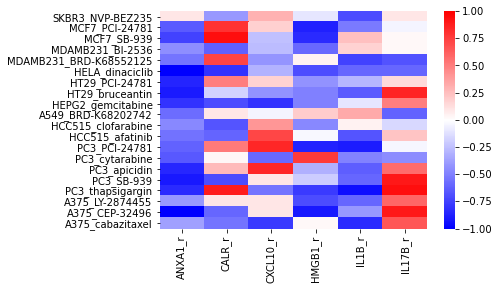

In [300]:
sns.heatmap(cat_I_icd, cmap='bwr', vmin=-1, vmax=1)

In [286]:
cat_I_icd_moa

,ANXA1_r,CALR_r,CXCL10_r,HMGB1_r,IL1B_r,IL17B_r,moa
SKBR3_NVP-BEZ235,0.100000,-0.400000,0.300000,-0.100000,-0.700000,0.100000,MTOR inhibitor
MCF7_PCI-24781,-0.646955,0.800181,0.187276,-0.868282,-0.519266,-0.042563,HDAC inhibitor
MCF7_SB-939,-0.739522,0.941210,-0.243706,-0.831962,0.243706,0.025211,HDAC inhibitor
MDAMB231_BI-2536,-0.441367,-0.617914,-0.264820,-0.588490,0.176547,0.029424,PLK inhibitor
MDAMB231_BRD-K68552125,-0.539394,0.733333,-0.418182,0.054545,-0.735566,-0.672727,NaN
HELA_dinaciclib,-1.000000,-0.800000,-0.300000,-0.700000,-0.600000,-0.600000,CDK inhibitor
HT29_PCI-24781,-0.857143,0.500000,0.178571,-0.428571,-0.285714,0.142857,HDAC inhibitor
HT29_bruceantin,-0.892857,-0.178571,-0.428571,-0.500000,-0.642857,0.857143,NaN
HEPG2_gemcitabine,-0.800000,-0.700000,-0.800000,-0.500000,-0.100000,0.500000,Ribonucleotide reductase inhibitor
A549_BRD-K68202742,-0.571380,0.098514,-0.039406,0.197028,0.334947,-0.610786,NaN


In [287]:
cat_II = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24['shift_r'] > .5]
cat_II = cat_II[cat_II['icd_ave_r'] > .5]
cat_II_icd = cat_II[[g + '_r' for g in icd_selected]]
print(cat_II_icd.shape)

cat_II_icd_moa = cat_II_icd.copy()
cat_II_icd_moa['moa'] = dose_dep_icd_rs_g24['moa']

(26, 6)


In [288]:
cat_II_icd_moa['moa'].value_counts()

CDK inhibitor                        5
Topoisomerase inhibitor              3
MEK inhibitor                        2
CLK inhibitor                        2
PKC inhibitor                        1
Dihydrofolate reductase inhibitor    1
PI3K inhibitor                       1
HMGCR inhibitor                      1
Proteasome inhibitor                 1
NFKB pathway inhibitor               1
Name: moa, dtype: int64

<AxesSubplot:>

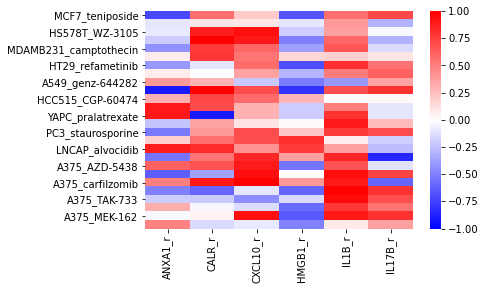

In [301]:
sns.heatmap(cat_II_icd, cmap='bwr', vmin=-1, vmax=1)

In [289]:
cat_II_icd_moa

,ANXA1_r,CALR_r,CXCL10_r,HMGB1_r,IL1B_r,IL17B_r,moa
MCF7_teniposide,-0.718185,0.564288,0.205196,-0.666886,0.564288,0.718185,Topoisomerase inhibitor
MCF7_AT-13387,-0.100000,0.100000,0.100000,-0.100000,0.400000,-0.300000,NaN
HS578T_WZ-3105,-0.085714,0.885714,0.942857,-0.200000,0.371429,-0.028571,CLK inhibitor
HS578T_BMS-387032,-0.200000,1.000000,0.900000,-0.500000,0.600000,-0.300000,CDK inhibitor
MDAMB231_camptothecin,-0.428571,0.771429,0.600000,-0.371429,0.657143,-0.142857,Topoisomerase inhibitor
HT29_CGP-60474,0.072739,0.781947,0.545545,0.163663,0.181848,0.109109,CDK inhibitor
HT29_refametinib,-0.404762,-0.095238,0.571429,-0.690476,0.809524,0.547619,MEK inhibitor
A549_OTS-167,0.072739,0.000000,0.363696,-0.290957,0.521298,0.618284,NaN
A549_genz-644282,0.400000,0.300000,-0.216667,-0.516667,-0.400000,0.366667,Topoisomerase inhibitor
HCC515_WZ-3105,-0.900000,1.000000,0.700000,-0.800000,0.700000,0.800000,CLK inhibitor


In [290]:
cat_III = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24['shift_r'] < -.5]
cat_III = cat_III[cat_III['icd_ave_r'] > .5]
cat_III_icd = cat_III[[g + '_r' for g in icd_selected]]
print(cat_III_icd.shape)

cat_III_icd_moa = cat_III_icd.copy()
cat_III_icd_moa['moa'] = dose_dep_icd_rs_g24['moa']

(24, 6)


In [291]:
cat_III_icd_moa['moa'].value_counts()

Topoisomerase inhibitor               8
HDAC inhibitor                        2
IKK inhibitor                         2
Ribonucleotide reductase inhibitor    1
Aurora kinase inhibitor               1
JAK inhibitor                         1
CHK inhibitor                         1
RNA synthesis inhibitor               1
Name: moa, dtype: int64

<AxesSubplot:>

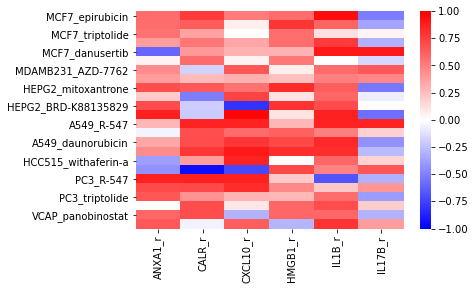

In [302]:
sns.heatmap(cat_III_icd, cmap='bwr', vmin=-1, vmax=1)

In [292]:
cat_III_icd_moa

,ANXA1_r,CALR_r,CXCL10_r,HMGB1_r,IL1B_r,IL17B_r,moa
MCF7_epirubicin,0.576554,0.769730,0.518602,0.575068,0.948045,-0.508200,Topoisomerase inhibitor
MCF7_mitoxantrone,0.575262,0.636502,0.063100,0.789290,0.603479,-0.352398,Topoisomerase inhibitor
MCF7_triptolide,0.552428,0.362118,0.006167,0.563001,0.124230,0.042291,NaN
MCF7_doxorubicin,0.387899,0.538437,0.343927,0.572763,0.771760,-0.305115,Topoisomerase inhibitor
MCF7_danusertib,-0.600000,0.400000,0.300000,0.300000,0.900000,0.900000,Aurora kinase inhibitor
BT20_GSK-1059615,0.052705,0.579751,0.052705,0.527046,0.000000,-0.158114,NaN
MDAMB231_AZD-7762,0.449217,-0.177992,0.661112,0.067806,0.576354,0.652636,CHK inhibitor
HT29_mitoxantrone,0.383411,0.269719,0.305582,0.249876,0.492974,0.473440,Topoisomerase inhibitor
HEPG2_mitoxantrone,0.692378,0.655316,0.552459,0.825911,0.631397,-0.524060,Topoisomerase inhibitor
HEPG2_withaferin-a,0.208546,-0.515414,0.739484,0.116951,0.597176,-0.069860,IKK inhibitor


In [293]:
cat_IV = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24['shift_r'] > .5]
cat_IV = cat_IV[cat_IV['icd_ave_r'] < -.5]
cat_IV_icd = cat_IV[[g + '_r' for g in icd_selected]]
print(cat_IV_icd.shape)

cat_IV_icd_moa = cat_IV_icd.copy()
cat_IV_icd_moa['moa'] = dose_dep_icd_rs_g24['moa']

(18, 6)


In [294]:
cat_IV_icd_moa['moa'].value_counts()

RAF inhibitor                         2
KIT inhibitor                         2
MEK inhibitor                         1
Ribonucleoside reductase inhibitor    1
JAK inhibitor                         1
IGF-1 inhibitor                       1
HDAC inhibitor                        1
MTOR inhibitor                        1
Topoisomerase inhibitor               1
Thymidylate synthase inhibitor        1
IMPDH inhibitor                       1
P21 activated kinase inhibitor        1
Name: moa, dtype: int64

<AxesSubplot:>

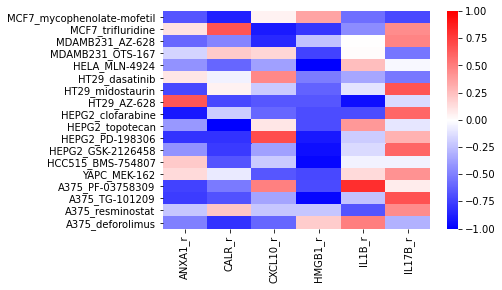

In [303]:
sns.heatmap(cat_IV_icd, cmap='bwr', vmin=-1, vmax=1)

In [295]:
cat_IV_icd_moa

,ANXA1_r,CALR_r,CXCL10_r,HMGB1_r,IL1B_r,IL17B_r,moa
MCF7_mycophenolate-mofetil,-0.666886,-0.872082,0.051299,0.359092,-0.564288,-0.718185,IMPDH inhibitor
MCF7_trifluridine,0.111803,0.670820,-0.894427,-0.782624,-0.447214,0.447214,Thymidylate synthase inhibitor
MDAMB231_AZ-628,-0.597614,-0.478091,-0.836660,-0.239046,0.000000,0.478091,RAF inhibitor
MDAMB231_OTS-167,-0.169725,0.206095,0.157602,-0.739516,0.012123,-0.533422,NaN
HELA_MLN-4924,-0.428571,-0.600000,-0.371429,-1.000000,0.257143,-0.028571,NaN
HT29_dasatinib,0.094100,-0.050187,0.464226,-0.508139,-0.351306,-0.526959,KIT inhibitor
HT29_midostaurin,-0.718185,0.051299,-0.205196,-0.615587,-0.102598,0.666886,KIT inhibitor
HT29_AZ-628,0.657143,-0.714286,-0.657143,-0.657143,-0.942857,-0.142857,RAF inhibitor
HEPG2_clofarabine,-0.900000,-0.200000,-0.600000,-0.700000,-0.700000,0.600000,Ribonucleoside reductase inhibitor
HEPG2_topotecan,-0.400000,-1.000000,0.100000,-0.700000,0.400000,-0.100000,Topoisomerase inhibitor


In [271]:
dose_dep_icd_rs_g24.loc['A375_PF-03758309', :]

shift_r                               0.553317
shift_p                               0.122249
rec_r                                 0.255377
rec_p                                 0.507201
nrec_r                               -0.451166
nrec_p                                0.222869
icd_ave_r                            -0.536292
icd_ave_p                             0.136631
ANXA1_r                              -0.740593
ANXA1_p                              0.0224672
CALR_r                               -0.519266
CALR_p                                0.151965
CXCL10_r                              0.493729
CXCL10_p                              0.176759
HMGB1_r                              -0.706543
HMGB1_p                               0.033349
IL1B_r                                0.817206
IL1B_p                              0.00715465
IL17B_r                              0.0766131
IL17B_p                               0.844686
cancer_type                               SKCM
cell_line    

In [ ]:
for ct in icd_rs_expr_24h['cancer_type'].unique():
    tmp_rs = icd_rs_expr_24h[icd_rs_expr_24h['cancer_type'] == ct]
    for cl in tmp_rs['cell_line'].unique():
        tmp_rs_cl = tmp_rs[tmp_rs['cell_line'] == cl]
        for d in tmp_rs_cl['cmap_name'].unique():
            tmp_rs_cl_d = tmp_rs_cl[tmp_rs_cl['cmap_name'] == d]
            if tmp_rs_cl_d.shape[0] >= 5:
                tmp_a_r, tmp_a_p = stats.spearmanr(tmp_rs_cl_d['shift_ability'], tmp_rs_cl_d['nearest_dose'])
                tmp_g_r, tmp_g_p = stats.spearmanr(tmp_rs_cl_d['REC_score'], tmp_rs_cl_d['nearest_dose'])
                tmp_ng_r, tmp_ng_p = stats.spearmanr(tmp_rs_cl_d['NREC_score'], tmp_rs_cl_d['nearest_dose'])
                tmp_m_r, tmp_m_p = stats.spearmanr(tmp_rs_cl_d['icd_ave'], tmp_rs_cl_d['nearest_dose'])
                
                for g in icd_selected:
                    tmp_a_r, tmp_a_p = stats.spearmanr(tmp_rs_cl_d[g], tmp_rs_cl_d['nearest_dose'])
                    dose_dep_icd_rs_g24.at[cl + '_' + d, g + '_r'] = tmp_a_r
                    dose_dep_icd_rs_g24.at[cl + '_' + d, g + '_p'] = tmp_a_p

In [517]:
# visualize the selected case by line plot
def visual_ICD_lineplot(case, merge_24h, icd_glist, save_path=None):
    tmp_c, tmp_d = case.split('_')[0], case.split('_')[1]
    tmp_rs = merge_24h[merge_24h['cell_line'] == tmp_c]
    tmp_rs = tmp_rs[tmp_rs['cmap_name'] == tmp_d]

    f, axes = plt.subplots(1, 3, figsize=(10, 3))

    sns.set_palette('tab10', len(icd_glist))
    for g in icd_glist:
        sns.lineplot(x='nearest_dose',
                     y=g,
                     ci=False,
                     label=g,
                     data=tmp_rs,
                     ax=axes[0])

    plt.sca(axes[0])
    plt.legend()
    plt.ylabel('EC from CMAP2020:\n' + tmp_d)
    plt.yticks(rotation=90)
    

    sns.boxplot(x='nearest_dose',
                y='shift_ability',
                color='thistle',
                data=tmp_rs,
                ax=axes[1])
    
    sns.stripplot(x='nearest_dose',
                  y='shift_ability',
                  color='black',
                  data=tmp_rs,
                  ax=axes[1])
    plt.sca(axes[1])
    plt.yticks(rotation=90)
    
    sns.boxplot(x='nearest_dose',
                y='NREC_score',
                color='crimson',
                data=tmp_rs,
                ax=axes[2])
    
    sns.stripplot(x='nearest_dose',
                  y='NREC_score',
                  color='black',
                  data=tmp_rs,
                  ax=axes[2])
    plt.sca(axes[2])
    plt.yticks(rotation=90)
    
    plt.subplots_adjust(wspace=0.3, bottom=0.2)
    
    if save_path == None:
        plt.show()
    else:
        fig = plt.gcf()
        fig.savefig(save_path + case + '.pdf', transparent=True)
        fig.savefig(save_path + case + '.png', dpi=300, transparent=True)
    
    return


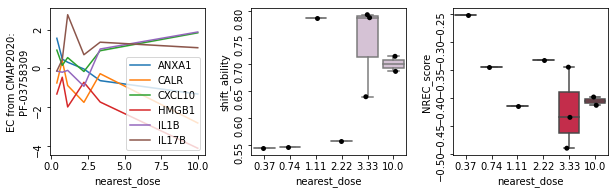

In [518]:
visual_ICD_lineplot(case='A375_PF-03758309',
                    merge_24h=icd_rs_expr_24h,
                    icd_glist=icd_selected,
                    save_path=poseidon_home + 'ICD/selected_case/class_iv/')

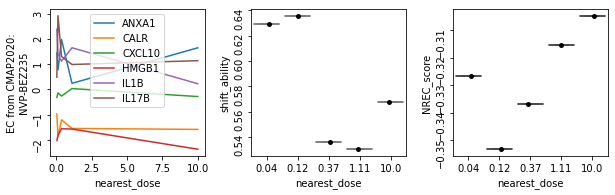

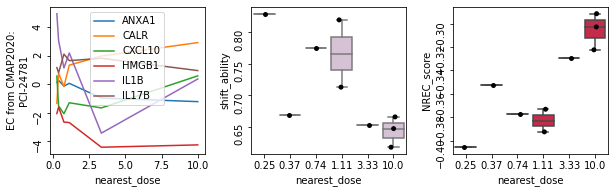

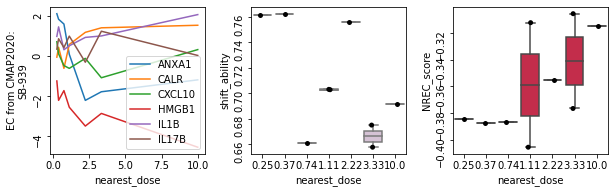

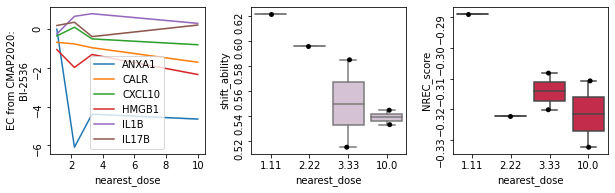

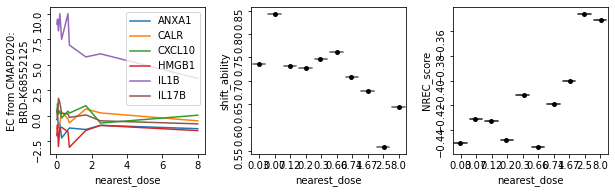

...

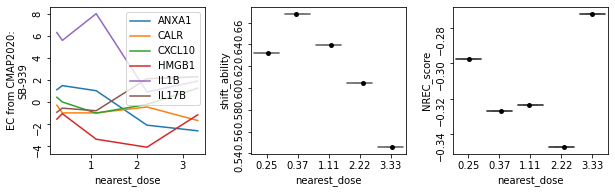

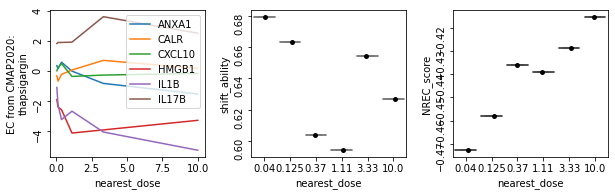

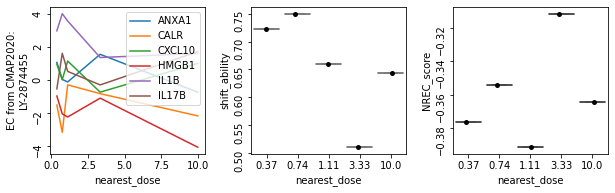

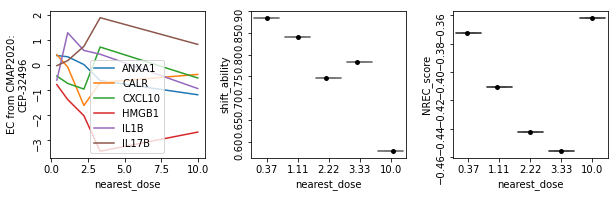

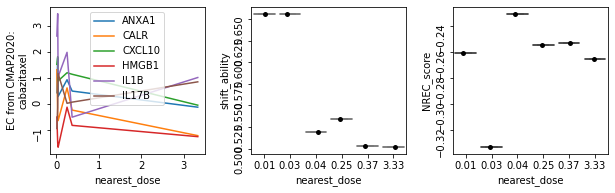

In [519]:
for c in cat_I_icd_moa.index:
    visual_ICD_lineplot(case=c,
                        merge_24h=icd_rs_expr_24h,
                        icd_glist=icd_selected,
                        save_path=poseidon_home + 'ICD/selected_case/class_i/')

<ipython-input-517-00bab48010d5>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axes = plt.subplots(1, 3, figsize=(10, 3))


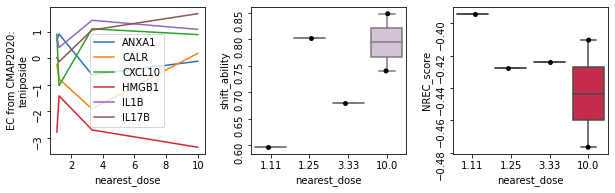

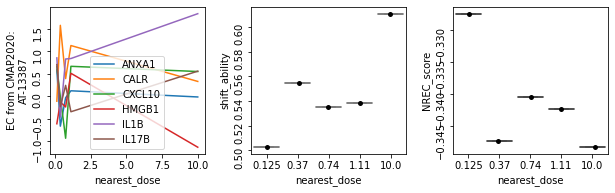

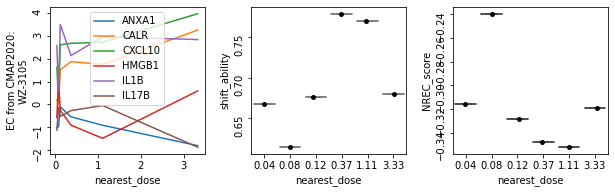

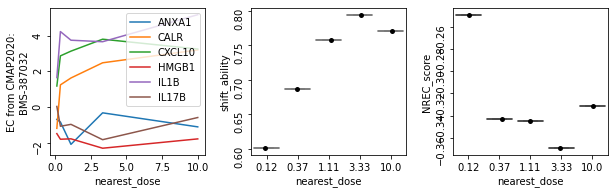

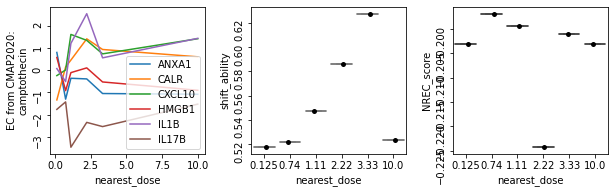

...

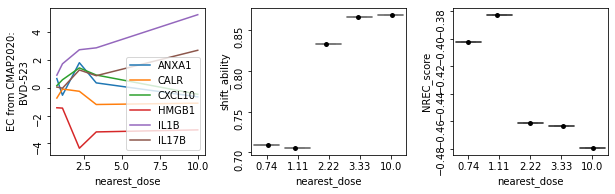

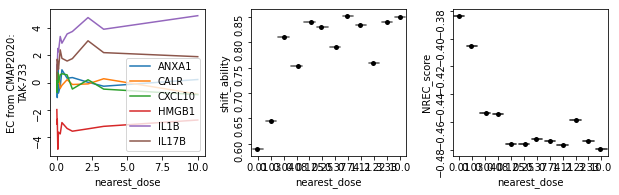

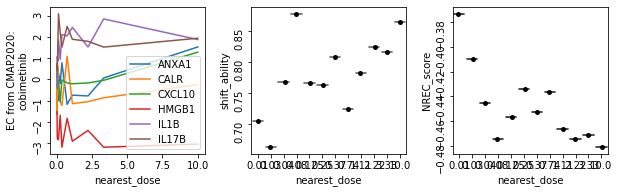

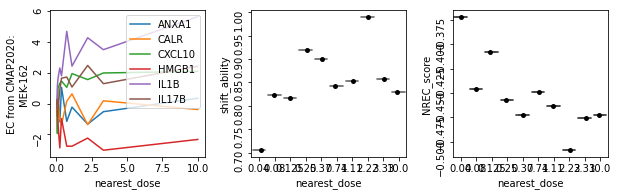

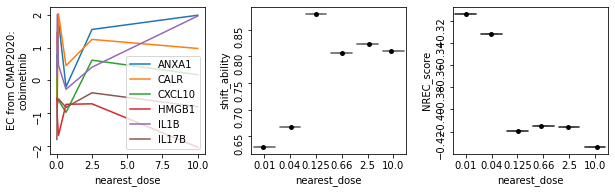

In [520]:
for c in cat_II_icd_moa.index:
    visual_ICD_lineplot(case=c,
                        merge_24h=icd_rs_expr_24h,
                        icd_glist=icd_selected,
                        save_path=poseidon_home + 'ICD/selected_case/class_ii/')

<ipython-input-517-00bab48010d5>:7: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f, axes = plt.subplots(1, 3, figsize=(10, 3))


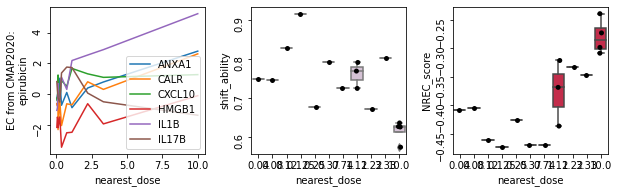

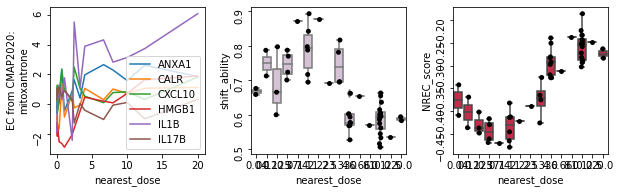

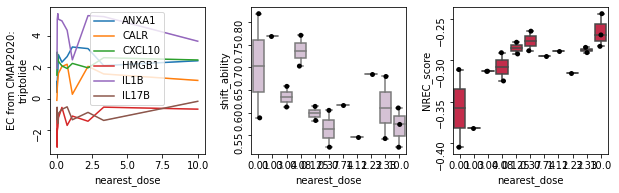

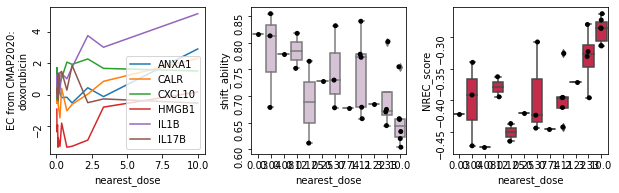

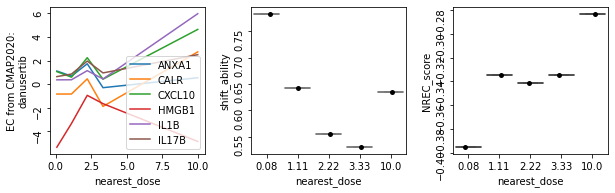

...

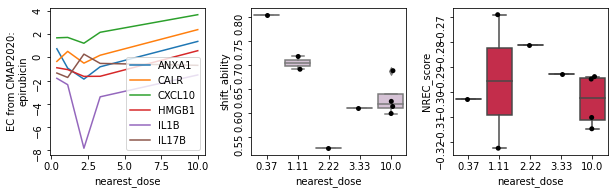

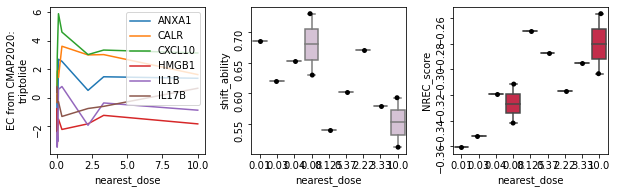

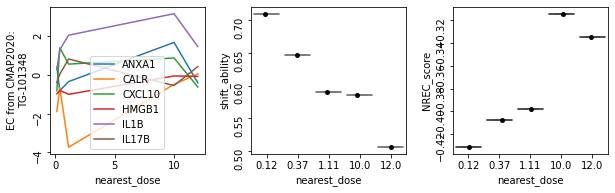

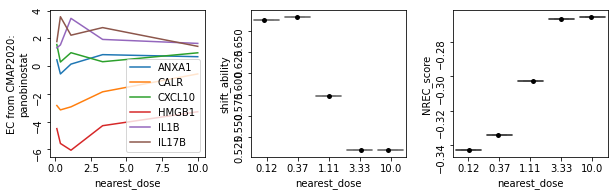

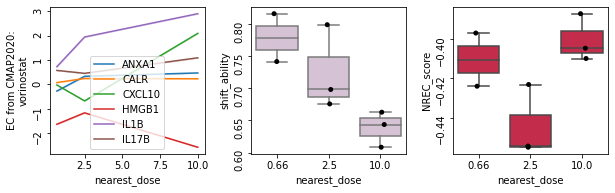

In [521]:
for c in cat_III_icd_moa.index:
    visual_ICD_lineplot(case=c,
                        merge_24h=icd_rs_expr_24h,
                        icd_glist=icd_selected,
                        save_path=poseidon_home + 'ICD/selected_case/class_iii/')

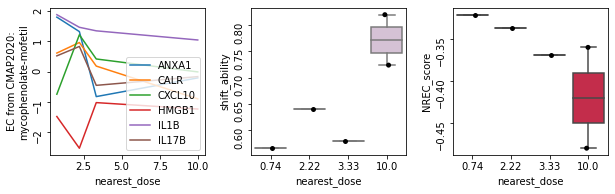

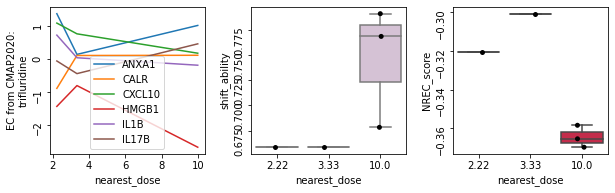

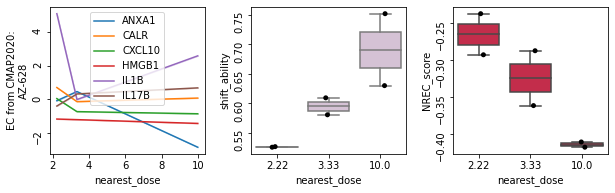

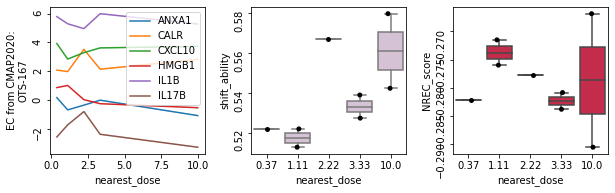

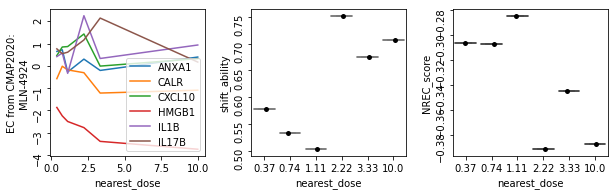

...

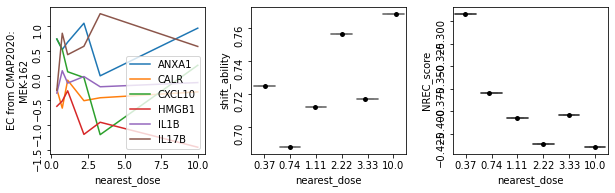

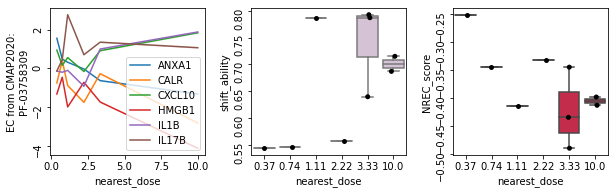

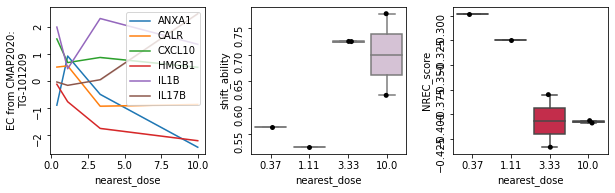

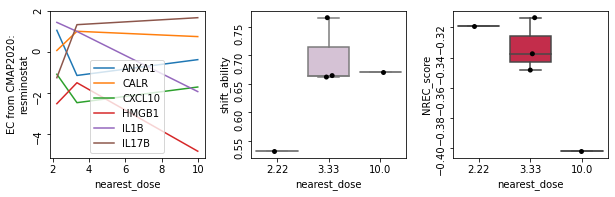

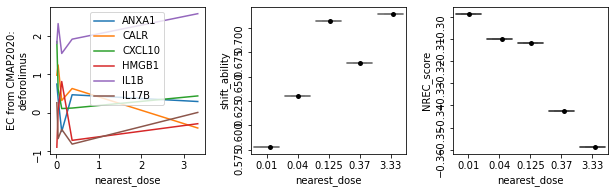

In [522]:
for c in cat_IV_icd_moa.index:
    visual_ICD_lineplot(case=c,
                        merge_24h=icd_rs_expr_24h,
                        icd_glist=icd_selected,
                        save_path=poseidon_home + 'ICD/selected_case/class_iv/')

In [525]:
cat_I.to_csv(poseidon_home + 'ICD/primary_class/class_I_primary_select.csv', sep=',')
cat_II.to_csv(poseidon_home + 'ICD/primary_class/class_II_primary_select.csv', sep=',')
cat_III.to_csv(poseidon_home + 'ICD/primary_class/class_III_primary_select.csv', sep=',')
cat_IV.to_csv(poseidon_home + 'ICD/primary_class/class_IV_primary_select.csv', sep=',')

## Expand to single ICD gene selection

In [558]:
cat_I_expand = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24['shift_r'] < -.5]
cat_I_expand_icd = cat_I_expand[[g + '_r' for g in icd_selected]]
cat_I_expand_icd = cat_I_expand_icd[cat_I_expand_icd < -.5].dropna(axis=0, how='all').fillna(0)
cat_I_expand_icd_moa = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24.index.isin(cat_I_expand_icd.index)]
cat_I_expand_icd_moa['ICD_criteria_conf'] = cat_I_expand_icd[cat_I_expand_icd == 0].fillna(1).sum(axis=1) / float(len(icd_selected))
cat_I_expand_icd_moa = cat_I_expand_icd_moa.sort_values(by='ICD_criteria_conf', ascending=False)

print(cat_I_expand_icd_moa.shape)
print(cat_I_expand_icd_moa['moa'].value_counts())

(59, 27)
HDAC inhibitor                        12
Topoisomerase inhibitor                9
Ribonucleotide reductase inhibitor     3
CDK inhibitor                          3
MTOR inhibitor                         3
Glucocorticoid receptor agonist        2
MEK inhibitor                          1
VEGFR inhibitor                        1
Dopamine receptor antagonist           1
EGFR inhibitor                         1
Proteasome inhibitor                   1
Dihydrofolate reductase inhibitor      1
RAF inhibitor                          1
FLT3 inhibitor                         1
Adenosine deaminase inhibitor          1
PLK inhibitor                          1
ATPase inhibitor                       1
Ribonucleoside reductase inhibitor     1
HMGCR inhibitor                        1
Aurora kinase inhibitor                1
IKK inhibitor                          1
Name: moa, dtype: int64


<ipython-input-558-5f0eeb5bb7b4>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_I_expand_icd_moa['ICD_criteria_conf'] = cat_I_expand_icd[cat_I_expand_icd == 0].fillna(1).sum(axis=1) / float(len(icd_selected))


In [567]:
cat_II_expand = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24['shift_r'] > .5]
cat_II_expand_icd = cat_II_expand[[g + '_r' for g in icd_selected]]
cat_II_expand_icd = cat_II_expand_icd[cat_II_expand_icd > .5].dropna(axis=0, how='all').fillna(0)
cat_II_expand_icd_moa = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24.index.isin(cat_II_expand_icd.index)]
cat_II_expand_icd_moa['ICD_criteria_conf'] = cat_II_expand_icd[cat_II_expand_icd == 0].fillna(1).sum(axis=1) / float(len(icd_selected))
cat_II_expand_icd_moa = cat_II_expand_icd_moa.sort_values(by='ICD_criteria_conf', ascending=False)

print(cat_II_expand_icd_moa.shape)
print(cat_II_expand_icd_moa['moa'].value_counts())

(70, 27)
MEK inhibitor                         9
CDK inhibitor                         8
PI3K inhibitor                        4
MTOR inhibitor                        4
Topoisomerase inhibitor               3
ALK inhibitor                         2
CLK inhibitor                         2
JAK inhibitor                         2
HSP inhibitor                         2
HDAC inhibitor                        1
Dihydrofolate reductase inhibitor     1
Ribonucleoside reductase inhibitor    1
Adenosine deaminase inhibitor         1
NFKB pathway inhibitor                1
IMPDH inhibitor                       1
PLK inhibitor                         1
Proteasome inhibitor                  1
Aurora kinase inhibitor               1
PKC inhibitor                         1
HMGCR inhibitor                       1
Survivin inhibitor                    1
WEE1 kinase inhibitor                 1
EGFR inhibitor                        1
Abl kinase inhibitor                  1
RAF inhibitor                  

<ipython-input-567-b1ab2c0c2e9e>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_II_expand_icd_moa['ICD_criteria_conf'] = cat_II_expand_icd[cat_II_expand_icd == 0].fillna(1).sum(axis=1) / float(len(icd_selected))


In [568]:
cat_III_expand = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24['shift_r'] < -.5]
cat_III_expand_icd = cat_III_expand[[g + '_r' for g in icd_selected]]
cat_III_expand_icd = cat_III_expand_icd[cat_III_expand_icd > .5].dropna(axis=0, how='all').fillna(0)
cat_III_expand_icd_moa = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24.index.isin(cat_III_expand_icd.index)]
cat_III_expand_icd_moa['ICD_criteria_conf'] = cat_III_expand_icd[cat_III_expand_icd == 0].fillna(1).sum(axis=1) / float(len(icd_selected))
cat_III_expand_icd_moa = cat_III_expand_icd_moa.sort_values(by='ICD_criteria_conf', ascending=False)

print(cat_III_expand_icd_moa.shape)
print(cat_III_expand_icd_moa['moa'].value_counts())

(71, 27)
Topoisomerase inhibitor               16
HDAC inhibitor                        14
CDK inhibitor                          3
Ribonucleotide reductase inhibitor     2
MTOR inhibitor                         2
Glucocorticoid receptor agonist        2
IKK inhibitor                          2
CHK inhibitor                          1
RNA synthesis inhibitor                1
Calcineurin inhibitor                  1
HMGCR inhibitor                        1
FLT3 inhibitor                         1
RAF inhibitor                          1
MDM inhibitor                          1
Proteasome inhibitor                   1
Aurora kinase inhibitor                1
EGFR inhibitor                         1
JAK inhibitor                          1
Dihydrofolate reductase inhibitor      1
ATPase inhibitor                       1
Name: moa, dtype: int64


<ipython-input-568-f17b1cb6f64b>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_III_expand_icd_moa['ICD_criteria_conf'] = cat_III_expand_icd[cat_III_expand_icd == 0].fillna(1).sum(axis=1) / float(len(icd_selected))


In [569]:
cat_IV_expand = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24['shift_r'] > .5]
cat_IV_expand_icd = cat_IV_expand[[g + '_r' for g in icd_selected]]
cat_IV_expand_icd = cat_IV_expand_icd[cat_IV_expand_icd < -.5].dropna(axis=0, how='all').fillna(0)
cat_IV_expand_icd_moa = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24.index.isin(cat_IV_expand_icd.index)]
cat_IV_expand_icd_moa['ICD_criteria_conf'] = cat_IV_expand_icd[cat_IV_expand_icd == 0].fillna(1).sum(axis=1) / float(len(icd_selected))
cat_IV_expand_icd_moa = cat_IV_expand_icd_moa.sort_values(by='ICD_criteria_conf', ascending=False)

print(cat_IV_expand_icd_moa.shape)
print(cat_IV_expand_icd_moa['moa'].value_counts())

(78, 27)
MEK inhibitor                         11
MTOR inhibitor                         9
HDAC inhibitor                         4
CDK inhibitor                          3
Topoisomerase inhibitor                3
P21 activated kinase inhibitor         2
Dihydrofolate reductase inhibitor      2
KIT inhibitor                          2
IMPDH inhibitor                        2
ALK inhibitor                          2
PI3K inhibitor                         2
IGF-1 inhibitor                        2
JAK inhibitor                          2
RAF inhibitor                          2
WEE1 kinase inhibitor                  1
CLK inhibitor                          1
PKC inhibitor                          1
EGFR inhibitor                         1
Akt inhibitor                          1
Proteasome inhibitor                   1
PLK inhibitor                          1
NFKB pathway inhibitor                 1
Thymidylate synthase inhibitor         1
Ribonucleoside reductase inhibitor     1
Aurora 

<ipython-input-569-4987c64091de>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  cat_IV_expand_icd_moa['ICD_criteria_conf'] = cat_IV_expand_icd[cat_IV_expand_icd == 0].fillna(1).sum(axis=1) / float(len(icd_selected))


In [570]:
cat_I_expand_icd_moa.to_csv(poseidon_home + 'ICD/primary_class/class_I_expand_select.csv', sep=',')
cat_II_expand_icd_moa.to_csv(poseidon_home + 'ICD/primary_class/class_II_expand_select.csv', sep=',')
cat_III_expand_icd_moa.to_csv(poseidon_home + 'ICD/primary_class/class_III_expand_select.csv', sep=',')
cat_IV_expand_icd_moa.to_csv(poseidon_home + 'ICD/primary_class/class_IV_expand_select.csv', sep=',')

In [571]:
cat_I_expand_icd_moa[cat_I_expand_icd_moa['moa'] == 'HDAC inhibitor']

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_ave_r,icd_ave_p,ANXA1_r,ANXA1_p,...,IL1B_p,IL17B_r,IL17B_p,cancer_type,cell_line,cmap_name,#experiments,moa,target,ICD_criteria_conf
PC3_PCI-24781,-0.882919,0.00845034,-0.774806,0.0407695,0.738769,0.0578585,-0.918956,0.00343663,-0.612637,0.143589,...,0.008450,-0.036037,0.938861,PRAD,PC3,PCI-24781,7.0,HDAC inhibitor,HDAC6,0.500000
PC3_SB-939,-0.7,0.18812,-0.8,0.104088,0.1,0.872889,-0.9,0.0373861,-0.900000,0.037386,...,0.284757,0.900000,0.037386,PRAD,PC3,SB-939,5.0,HDAC inhibitor,HDAC5,0.500000
MCF7_PCI-24781,-0.817206,0.00715465,-0.391578,0.297311,0.851257,0.00360193,-0.519266,0.151965,-0.646955,0.059659,...,0.151965,-0.042563,0.913423,BRCA,MCF7,PCI-24781,9.0,HDAC inhibitor,HDAC6,0.500000
PC3_apicidin,-0.508548,0.162109,-0.661112,0.052514,-0.42379,0.255659,-0.661112,0.052514,-0.847579,0.003909,...,0.070605,0.576354,0.104290,PRAD,PC3,apicidin,9.0,HDAC inhibitor,HDAC6,0.333333
MCF7_SB-939,-0.59666,0.0898701,0.00840366,0.982881,0.613467,0.0789152,-0.714311,0.0306167,-0.739522,0.022768,...,0.527446,0.025211,0.948668,BRCA,MCF7,SB-939,9.0,HDAC inhibitor,HDAC5,0.333333
PC3_panobinostat,-0.527094,0.00678219,-0.286059,0.165674,0.43821,0.0284483,-0.192129,0.357533,-0.355148,0.081485,...,0.009904,0.466156,0.018838,PRAD,PC3,panobinostat,25.0,HDAC inhibitor,HDAC1,0.166667
MCF7_dacinostat,-0.561916,0.0234913,-0.040031,0.88298,0.791724,0.000257581,0.115645,0.669749,-0.630117,0.008888,...,0.011952,-0.296526,0.264762,BRCA,MCF7,dacinostat,16.0,HDAC inhibitor,HDAC1,0.166667
MCF7_JNJ-26481585,-0.709253,0.0045028,-0.477975,0.0838676,0.682821,0.00711794,0.0991192,0.736023,-0.176212,0.546775,...,0.000438,0.004405,0.988075,BRCA,MCF7,JNJ-26481585,14.0,HDAC inhibitor,HDAC1,0.166667
A549_apicidin,-0.714286,0.110787,-0.6,0.208,0.771429,0.0723965,-0.2,0.704,-0.142857,0.787172,...,0.018845,-1.000000,0.000000,LUNG,A549,apicidin,6.0,HDAC inhibitor,HDAC6,0.166667
HT29_PCI-24781,-0.642857,0.119392,-0.0714286,0.879048,0.464286,0.293934,-0.571429,0.180202,-0.857143,0.013697,...,0.534509,0.142857,0.759945,CRC,HT29,PCI-24781,7.0,HDAC inhibitor,HDAC6,0.166667


In [572]:
cat_I_expand_icd_moa[cat_I_expand_icd_moa['moa'] == 'CDK inhibitor']

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_ave_r,icd_ave_p,ANXA1_r,ANXA1_p,...,IL1B_p,IL17B_r,IL17B_p,cancer_type,cell_line,cmap_name,#experiments,moa,target,ICD_criteria_conf
HELA_dinaciclib,-0.6,0.284757,-0.8,0.104088,-0.1,0.872889,-0.9,0.0373861,-1.0,1.404265e-24,...,0.284757,-0.6,0.284757,CESC,HELA,dinaciclib,5.0,CDK inhibitor,CDK2,0.833333
HT29_dinaciclib,-0.8,0.104088,0.1,0.872889,0.7,0.18812,-0.5,0.391002,-0.5,3.910022e-01,...,0.284757,-0.6,0.284757,CRC,HT29,dinaciclib,5.0,CDK inhibitor,CDK2,0.666667
YAPC_PHA-848125,-0.6,0.284757,-0.6,0.284757,-0.5,0.391002,-0.1,0.872889,0.0,1.000000e+00,...,0.284757,0.8,0.104088,PAAD,YAPC,PHA-848125,5.0,CDK inhibitor,CDK2,0.333333


In [566]:
# Some hits in primary classes can be picked by expand selection, please pay attention!
# Therefore, a confidence score is necessary for expand selection hits, here this score refers to the ICD_criteria_conf columns
# The higher means more ICD genes are follow the class selection criteria
# Therefore, the primary selection should also be include in the expand set

In [575]:
dose_dep_icd_rs_g24.loc['A375_doxorubicin', :]

shift_r                       -0.433732
shift_p                       0.0819652
rec_r                         0.0917033
rec_p                          0.726308
nrec_r                         0.493215
nrec_p                        0.0442417
icd_ave_r                      0.430014
icd_ave_p                     0.0849185
ANXA1_r                        0.205713
ANXA1_p                        0.428304
CALR_r                         0.548981
CALR_p                        0.0224726
CXCL10_r                       0.159861
CXCL10_p                       0.539955
HMGB1_r                        0.691493
HMGB1_p                      0.00210706
IL1B_r                        -0.659273
IL1B_p                       0.00399164
IL17B_r                       -0.468431
IL17B_p                       0.0578935
cancer_type                        SKCM
cell_line                          A375
cmap_name                   doxorubicin
#experiments                         17
moa             Topoisomerase inhibitor


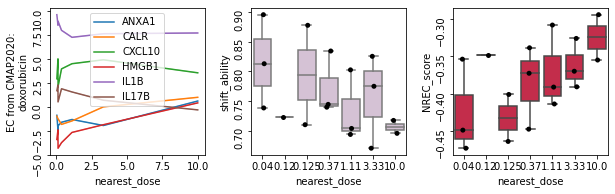

In [576]:
visual_ICD_lineplot(case='A375_doxorubicin',
                    merge_24h=icd_rs_expr_24h,
                    icd_glist=icd_selected,
                    save_path=None)

In [578]:
dose_dep_icd_rs_g24.loc['MCF7_doxorubicin', :]

shift_r                       -0.581737
shift_p                     0.000746482
rec_r                         0.0264732
rec_p                          0.889559
nrec_r                         0.669233
nrec_p                      5.26094e-05
icd_ave_r                      0.781632
icd_ave_p                   3.41024e-07
ANXA1_r                        0.387899
ANXA1_p                       0.0341697
CALR_r                         0.538437
CALR_p                       0.00214443
CXCL10_r                       0.343927
CXCL10_p                      0.0627514
HMGB1_r                        0.572763
HMGB1_p                     0.000940145
IL1B_r                          0.77176
IL1B_p                      5.92636e-07
IL17B_r                       -0.305115
IL17B_p                        0.101102
cancer_type                        BRCA
cell_line                          MCF7
cmap_name                   doxorubicin
#experiments                         30
moa             Topoisomerase inhibitor


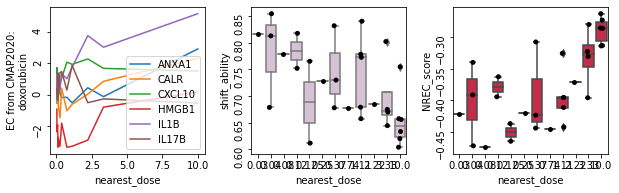

In [577]:
visual_ICD_lineplot(case='MCF7_doxorubicin',
                    merge_24h=icd_rs_expr_24h,
                    icd_glist=icd_selected,
                    save_path=None)

# Drug response: CTRP

In [579]:
ctrp_cl_v21 = pd.read_csv(poseidon_home + 'data/CTRP/CMAP2020_CTRP_v21_cell_line.csv',
                          header=0, index_col=0, sep=',')
ctrp_cl_v21

,ccl_name,ccle_primary_site,ccle_primary_hist,ccle_hist_subtype_1
master_ccl_id,,,,
3,5637,urinary_tract,carcinoma,NaN
7,22RV1,prostate,carcinoma,NaN
26,A204,soft_tissue,rhabdoid_tumor,NaN
30,A375,skin,malignant_melanoma,NaN
35,A549,lung,carcinoma,non_small_cell_carcinoma
...,...,...,...,...
155366,NCIH841,lung,carcinoma,small_cell_carcinoma
155424,NCIH1573,lung,carcinoma,adenocarcinoma
155440,NCIH1694,lung,carcinoma,small_cell_carcinoma


In [594]:
ctrp_cl_v22 = pd.read_csv(poseidon_home + 'data/CTRP/CMAP2020_CTRP_v22_cell_line.csv',
                          header=0, index_col='index_ccl', sep=',')
ctrp_cl_v22

,ccl_name,snp_fp_status,culture_media,ccle_primary_site,ccle_primary_hist,ccle_hist_subtype_1,cell_line_cluster_id,master_ccl_id
index_ccl,,,,,,,,
14,SKNSH,SNP-matched-reference,EMEM001,autonomic_ganglia,neuroblastoma,NaN,91;333;475;513;552;589;607;628;638;647;651;657...,1058
22,A673,SNP-matched-reference,DMEM001,bone,Ewings_sarcoma_peripheral_primitive_neuroectod...,NaN,8;66;202;239;350;383;459;464;514;539;569;601;6...,37
34,SKES1,SNP-matched-reference,MCCOYS5A003,bone,Ewings_sarcoma_peripheral_primitive_neuroectod...,NaN,68;75;267;349;411;459;464;514;539;569;601;604;...,1035
37,U2OS,SNP-matched-reference,DMEM001,bone,osteosarcoma,NaN,559;591;598;616;630;643;645;654;659;660,1226
39,BT20,SNP-matched-reference,EMEM001,breast,carcinoma,ductal_carcinoma,192;315;412;477;530;545;584;595;609;624;631;63...,90
...,...,...,...,...,...,...,...,...
617,BICR6,SNP-matched-reference,DMEM005,upper_aerodigestive_tract,carcinoma,squamous_cell_carcinoma,47;161;197;208;219;369;444;514;539;569;601;604...,71
643,5637,SNP-matched-reference,RPMI001,urinary_tract,carcinoma,NaN,131;189;274;400;454;538;559;591;598;616;630;64...,3
646,BC3C,SNP-matched-reference,MCCOYS5A001,urinary_tract,carcinoma,transitional_cell_carcinoma,167;230;369;444;514;539;569;601;604;615;624;63...,55


In [591]:
ctrp_cp_v22 = pd.read_csv(poseidon_home + '/data/CTRP/CTRPv2.2_2015_pub_CancerDisc_5_1210/v22.meta.per_compound.txt',
                          header=0, index_col=0, sep='\t')

In [592]:
ctrp_cp_v22

,cpd_name,broad_cpd_id,top_test_conc_umol,cpd_status,gene_symbol_of_protein_target,target_or_activity_of_compound,compound_cluster_id,cpd_smiles,master_cpd_id
index_cpd,,,,,,,,,
1,ML311,BRD-A40802033,66.0,probe,MCL1,inhibitor of MCL1,65;132;227;336;358;372;425;447;476;478;479,CCN1CCN(CC1)C(c1ccc(cc1)C(F)(F)F)c1ccc2cccnc2c1O,290356
2,zebularine,BRD-A01145011,590.0,probe,DNMT1,inhibitor of DNA methyltransferases,368;429;468;477,OC[C@H]1O[C@H](C(O)[C@H]1O)n1cccnc1=O,411739
3,BRD-A02303741,BRD-A02303741,55.0,probe,DOT1L,inhibitor of histone methyltransferases,332;402;453;466;469;472;476;478;479,CC(C)N(CCCNC(=O)Nc1ccc(cc1)C(C)(C)C)C[C@H]1O[C...,659371
4,importazole,BRD-A02481876,200.0,probe,KPNB1,inhibitor of importin,81;228;345;383;450;471;477,CC(Nc1nc(nc2ccccc12)N1CCCC1)c1ccccc1,46792
5,SR8278,BRD-A02904414,66.0,probe,NR1D1,antagonist of Rev-ErbAalpha,378;424;442;456;466;469;472;476;478;479,CCOC(=O)C1Cc2ccccc2CN1C(=O)c1ccc(SC)s1,668858
...,...,...,...,...,...,...,...,...,...
477,pluripotin,BRD-K98538768,33.0,probe,MAPK1;RASAL1,promoter of embryonic stem cell self-renewal; ...,169;355;431;460;465;474;475;479,CN1C(=O)N(Cc2cnc(Nc3cc(C)nn3C)nc12)c1cc(NC(=O)...,411833
478,BRD-K99006945,BRD-K99006945,66.0,probe,NaN,screening hit,55;408;453;466;469;472;476;478;479,CCN(CC)c1ccc(cc1)C1=NNC(=O)C[C@H]1C,687395
479,JW-480,BRD-K99655327,66.0,probe,NCEH1,inhibitor of serine hydrolase enzyme NCEH,364;406;456;466;469;472;476;478;479,CC(C)c1ccccc1OC(=O)NCCc1ccc2ccccc2c1,660227


In [582]:
cmap_ctrp_drug = pd.read_csv(poseidon_home + 'data/CTRP/CMAP2020_to_CTRP_name.csv',
                             header=0, index_col=0, sep=',')
cmap_ctrp_drug

,CTRP_name,BRD_ID,CTRP_ID
3-Cl-AHPC,3-Cl-AHPC,BRD-A09890259,660796
ABT-737,ABT-737,BRD-K56301217,411738
AGK-2,AGK-2,BRD-K32536677,411716
AM-580,AM-580,BRD-K06854232,58455
AT-406,AT-406,BRD-K02834582,710154
...,...,...,...
BRD-K33583600,isoliquiritigenin,BRD-K33583600,25393
ixazomib,MLN2238,BRD-K78659596,632873
RAF-265,RAF265,BRD-K93123848,660414
KU-0060648,KU 0060648,BRD-K09499853,632119


In [589]:
ctrp_auc_v21 = pd.read_csv(poseidon_home + '/data/CTRP/CTRPv2.1_2016_pub_NatChemBiol_12_109/v21.data.auc_sensitivities.txt',
                          header=0, index_col=['master_ccl_id', 'master_cpd_id'], sep='\t')
ctrp_auc_v22 = pd.read_csv(poseidon_home + '/data/CTRP/CTRPv2.2_2015_pub_CancerDisc_5_1210/v22.data.auc_sensitivities.txt',
                          header=0, index_col=['index_ccl', 'index_cpd'], sep='\t')

In [588]:
ctrp_auc_v21

,,experiment_id,area_under_curve
master_ccl_id,master_cpd_id,,
130,1788,1,14.782
569,1788,2,15.680
682,1788,3,15.400
9,1788,4,14.388
61,1788,5,14.843
...,...,...,...
1052,710154,872,15.280
53,710154,873,15.158
157,710154,874,14.895


In [590]:
ctrp_auc_v22

,,area_under_curve
index_ccl,index_cpd,
1,1,11.025
2,1,9.356
3,1,10.734
4,1,11.337
5,1,14.064
...,...,...
655,481,14.684
656,481,15.000
659,481,13.282


In [652]:
def query_auc_21(cmap_cl, cmap_drug, cl_hash, drug_hash, ctrp_res):
    tmp_ctrp_cl = cl_hash[cl_hash['ccl_name'] == cmap_cl].index[0]
    tmp_ctrp_drug = drug_hash.loc[cmap_drug, 'CTRP_ID']
    if (tmp_ctrp_cl, tmp_ctrp_drug) in ctrp_res.index:
        tmp_ctrp_res = ctrp_res.loc[(tmp_ctrp_cl, tmp_ctrp_drug), 'area_under_curve'].mean()
    else:
        tmp_ctrp_res = 'Not available'
    
    return tmp_ctrp_res

In [658]:
def query_auc_22(cmap_cl, cmap_drug, cl_hash, drug_hash, drug_hash_22, ctrp_res):
    tmp_ctrp_cl = cl_hash[cl_hash['ccl_name'] == cmap_cl].index[0]
    tmp_ctrp_drug = drug_hash.loc[cmap_drug, 'CTRP_ID']
    tmp_ctrp_drug_id = drug_hash_22[drug_hash_22['master_cpd_id'] == tmp_ctrp_drug].index[0]
    if (tmp_ctrp_cl, tmp_ctrp_drug_id) in ctrp_res.index:
        tmp_ctrp_res = ctrp_res.loc[(tmp_ctrp_cl, tmp_ctrp_drug_id), 'area_under_curve'].mean()
    else:
        tmp_ctrp_res = 'Not available'
    
    return tmp_ctrp_res

In [659]:
query_auc_21(cmap_cl='A375',
             cmap_drug='doxorubicin',
             cl_hash=ctrp_cl_v21,
             drug_hash=cmap_ctrp_drug,
             ctrp_res=ctrp_auc_v21)

/home/dyang-server/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:2877: PerformanceWarning: indexing past lexsort depth may impact performance.
  result = self._run_cell(
/home/dyang-server/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


7.46495

In [660]:
query_auc_22(cmap_cl='A375',
             cmap_drug='doxorubicin',
             cl_hash=ctrp_cl_v22,
             drug_hash=cmap_ctrp_drug,
             drug_hash_22=ctrp_cp_v22,
             ctrp_res=ctrp_auc_v22)

7.6949

In [661]:
# merge the drug response data available for CMAP2020
cmap2020_auc_merged = df(columns=['cell_line', 'drug_name', 'auc_CTRP_21', 'auc_CTRP_22'])

# v21
for cl in ctrp_cl_v21['ccl_name'].unique():
    for d in cmap_ctrp_drug.index:
        tmp_id = cl + '_' + d
        cmap2020_auc_merged.at[tmp_id, 'cell_line'] = cl
        cmap2020_auc_merged.at[tmp_id, 'drug_name'] = d
        cmap2020_auc_merged.at[tmp_id, 'auc_CTRP_21'] = query_auc_21(cmap_cl=cl,
                                                                     cmap_drug=d,
                                                                     cl_hash=ctrp_cl_v21,
                                                                     drug_hash=cmap_ctrp_drug,
                                                                     ctrp_res=ctrp_auc_v21)
# v22
for cl in ctrp_cl_v22['ccl_name'].unique():
    for d in cmap_ctrp_drug.index:
        tmp_id = cl + '_' + d
        cmap2020_auc_merged.at[tmp_id, 'cell_line'] = cl
        cmap2020_auc_merged.at[tmp_id, 'drug_name'] = d
        cmap2020_auc_merged.at[tmp_id, 'auc_CTRP_22'] = query_auc_22(cmap_cl=cl,
                                                                     cmap_drug=d,
                                                                     cl_hash=ctrp_cl_v22,
                                                                     drug_hash=cmap_ctrp_drug,
                                                                     drug_hash_22=ctrp_cp_v22,
                                                                     ctrp_res=ctrp_auc_v22)

/home/dyang-server/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:2877: PerformanceWarning: indexing past lexsort depth may impact performance.
  result = self._run_cell(
/home/dyang-server/anaconda3/lib/python3.8/site-packages/pandas/core/indexing.py:873: PerformanceWarning: indexing past lexsort depth may impact performance.
  return self._getitem_tuple(key)


In [662]:
cmap2020_auc_merged

,cell_line,drug_name,auc_CTRP_21,auc_CTRP_22
5637_3-Cl-AHPC,5637,3-Cl-AHPC,9.3751,9.3751
5637_ABT-737,5637,ABT-737,12.746,12.746
5637_AGK-2,5637,AGK-2,15,15
5637_AM-580,5637,AM-580,12.917,12.917
5637_AT-406,5637,AT-406,Not available,Not available
...,...,...,...,...
HELA_BRD-K33583600,HELA,BRD-K33583600,NaN,Not available
HELA_ixazomib,HELA,ixazomib,NaN,10.396
HELA_RAF-265,HELA,RAF-265,NaN,17.168
HELA_KU-0060648,HELA,KU-0060648,NaN,15.435


In [665]:
cmap2020_auc_merged = cmap2020_auc_merged.fillna('Not available')

In [663]:
cmap2020_auc_merged.loc['A375_doxorubicin', :]

cell_line             A375
drug_name      doxorubicin
auc_CTRP_21        7.46495
auc_CTRP_22         7.6949
Name: A375_doxorubicin, dtype: object

In [692]:
# drop detections with both unavailable
cmap2020_auc_merged_tmp1 = cmap2020_auc_merged[cmap2020_auc_merged['auc_CTRP_21'] != 'Not available']
cmap2020_auc_merged_tmp2 = cmap2020_auc_merged[cmap2020_auc_merged['auc_CTRP_22'] != 'Not available']
cmap2020_auc_merged_tmp = cmap2020_auc_merged[cmap2020_auc_merged.index.isin(set(cmap2020_auc_merged_tmp1.index) | set(cmap2020_auc_merged_tmp2.index))]

In [693]:
cmap2020_auc_merged_tmp.shape

(42809, 4)

In [694]:
cmap2020_auc_merged_tmp.to_csv(data_home + 'CTRP/merged_v21_v22_CMAP2020_CTRP_AUC.csv', sep=',')

In [668]:
cmap2020_auc_merged_available = cmap2020_auc_merged[cmap2020_auc_merged['auc_CTRP_21'] != 'Not available']
cmap2020_auc_merged_available = cmap2020_auc_merged_available[cmap2020_auc_merged_available['auc_CTRP_22'] != 'Not available']
print(cmap2020_auc_merged_available.shape)

(34551, 4)


In [669]:
cmap2020_auc_merged_available.to_csv(data_home + 'CTRP/merged_v21_v22_available_CMAP2020_CTRP_AUC.csv', sep=',')

<AxesSubplot:xlabel='auc_CTRP_21', ylabel='auc_CTRP_22'>

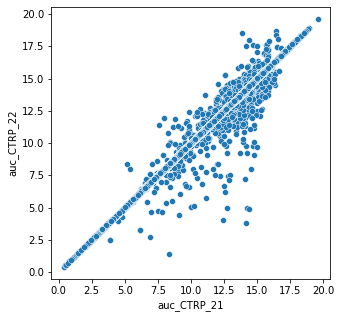

In [671]:
# consistency between two version
plt.figure(figsize=(5, 5))
sns.scatterplot(x='auc_CTRP_21', y='auc_CTRP_22', data=cmap2020_auc_merged_available)

In [677]:
# range
print(cmap2020_auc_merged_available['auc_CTRP_21'].max())
print(cmap2020_auc_merged_available['auc_CTRP_21'].min())

print(cmap2020_auc_merged_available['auc_CTRP_22'].max())
print(cmap2020_auc_merged_available['auc_CTRP_22'].min())

19.588
0.4239
19.588
0.42393000000000003


## Combine drug res with ICD and shift assessment

In [678]:
dose_dep_icd_rs_g24

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_ave_r,icd_ave_p,ANXA1_r,ANXA1_p,...,IL1B_r,IL1B_p,IL17B_r,IL17B_p,cancer_type,cell_line,cmap_name,#experiments,moa,target
SKBR3_mitoxantrone,0.176547,0.737931,-0.0882735,0.867934,-0.882735,0.0198204,0.794461,0.0590276,0.706188,0.116807,...,0.882735,0.019820,0.794461,0.059028,BRCA,SKBR3,mitoxantrone,6.0,Topoisomerase inhibitor,TOP2A
SKBR3_afatinib,0.0857143,0.871743,-0.257143,0.622787,-0.0857143,0.871743,0.371429,0.468478,-0.485714,0.328723,...,0.028571,0.957155,-0.142857,0.787172,BRCA,SKBR3,afatinib,6.0,EGFR inhibitor,EGFR
SKBR3_neratinib,-0.175734,0.651084,0.43515,0.241757,0.661094,0.0525229,0.217575,0.573875,-0.460255,0.212522,...,0.569043,0.109804,0.000000,1.000000,BRCA,SKBR3,neratinib,9.0,EGFR inhibitor,EGFR
SKBR3_CGP-60474,-0.265079,0.525768,-0.25303,0.545429,-0.0843435,0.842604,0.228932,0.585514,0.337374,0.413785,...,0.144589,0.732651,0.192785,0.647384,BRCA,SKBR3,CGP-60474,8.0,CDK inhibitor,CDK1
SKBR3_NVP-BEZ235,-0.6,0.284757,-0.6,0.284757,0.7,0.18812,-0.6,0.284757,0.100000,0.872889,...,-0.700000,0.188120,0.100000,0.872889,BRCA,SKBR3,NVP-BEZ235,5.0,MTOR inhibitor,MTOR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SKMEL5_cobimetinib,0.6,0.208,0.485714,0.328723,-0.828571,0.0415627,0.542857,0.265703,0.485714,0.328723,...,0.085714,0.871743,0.371429,0.468478,SKCM,SKMEL5,cobimetinib,6.0,NaN,NaN
SKMEL5_selumetinib,0.9,0.0373861,0.6,0.284757,-0.9,0.0373861,0.2,0.74706,0.200000,0.747060,...,0.500000,0.391002,-0.100000,0.872889,SKCM,SKMEL5,selumetinib,5.0,MEK inhibitor,MAP2K1
SKMEL5_bortezomib,0.126592,0.745527,0.126592,0.745527,0.253185,0.51098,0.970542,1.40362e-05,0.903026,0.000849,...,0.936784,0.000197,-0.438854,0.237315,SKCM,SKMEL5,bortezomib,9.0,Proteasome inhibitor,PSMB1
SKMEL5_dinaciclib,0.2,0.704,0.257143,0.622787,-0.142857,0.787172,0.942857,0.00480466,0.371429,0.468478,...,0.828571,0.041563,0.428571,0.396501,SKCM,SKMEL5,dinaciclib,6.0,CDK inhibitor,CDK2


In [705]:
ctrp_dd_icd_rs_24 = dose_dep_icd_rs_g24[dose_dep_icd_rs_g24.index.isin(cmap2020_auc_merged_available.index)]
ctrp_dd_icd_rs_24.shape

(192, 26)

In [706]:
ctrp_dd_icd_rs_24['auc_CTRP21'] = cmap2020_auc_merged['auc_CTRP_21']
ctrp_dd_icd_rs_24['auc_CTRP22'] = cmap2020_auc_merged['auc_CTRP_22']

<ipython-input-706-74404c50fc41>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ctrp_dd_icd_rs_24['auc_CTRP21'] = cmap2020_auc_merged['auc_CTRP_21']
<ipython-input-706-74404c50fc41>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  ctrp_dd_icd_rs_24['auc_CTRP22'] = cmap2020_auc_merged['auc_CTRP_22']


In [707]:
ctrp_dd_icd_rs_24

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_ave_r,icd_ave_p,ANXA1_r,ANXA1_p,...,IL17B_r,IL17B_p,cancer_type,cell_line,cmap_name,#experiments,moa,target,auc_CTRP21,auc_CTRP22
SKBR3_afatinib,0.0857143,0.871743,-0.257143,0.622787,-0.0857143,0.871743,0.371429,0.468478,-0.485714,0.328723,...,-0.142857,0.787172,BRCA,SKBR3,afatinib,6.0,EGFR inhibitor,EGFR,4.8166,4.8166
SKBR3_neratinib,-0.175734,0.651084,0.43515,0.241757,0.661094,0.0525229,0.217575,0.573875,-0.460255,0.212522,...,0.000000,1.000000,BRCA,SKBR3,neratinib,9.0,EGFR inhibitor,EGFR,5.6581,5.6581
SKBR3_NVP-BEZ235,-0.6,0.284757,-0.6,0.284757,0.7,0.18812,-0.6,0.284757,0.100000,0.872889,...,0.100000,0.872889,BRCA,SKBR3,NVP-BEZ235,5.0,MTOR inhibitor,MTOR,7.8046,7.8046
SKBR3_alvocidib,-0.6,0.284757,-0.7,0.18812,-0.6,0.284757,0.1,0.872889,0.800000,0.104088,...,-0.100000,0.872889,BRCA,SKBR3,alvocidib,5.0,CDK inhibitor,CDK2,7.1397,7.1397
MCF7_RITA,-0.223607,0.717686,0.111803,0.857945,0.447214,0.450185,-0.223607,0.717686,0.335410,0.581091,...,-0.447214,0.450185,BRCA,MCF7,RITA,5.0,MDM inhibitor,MDM2,13.884,13.884
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SKMEL5_sirolimus,0.782624,0.117614,-0.111803,0.857945,-0.894427,0.0405193,-0.33541,0.581091,-0.223607,0.717686,...,-0.111803,0.857945,SKCM,SKMEL5,sirolimus,5.0,MTOR inhibitor,FKBP1A,14.284,14.284
SKMEL5_vorinostat,-0.881917,0.00376031,-0.793725,0.0186875,0.352767,0.391388,0.881917,0.00376031,0.655138,0.077844,...,0.390563,0.338756,SKCM,SKMEL5,vorinostat,8.0,HDAC inhibitor,HDAC6,11.524,11.524
SKMEL5_selumetinib,0.9,0.0373861,0.6,0.284757,-0.9,0.0373861,0.2,0.74706,0.200000,0.747060,...,-0.100000,0.872889,SKCM,SKMEL5,selumetinib,5.0,MEK inhibitor,MAP2K1,10.721,10.721
SKMEL5_bortezomib,0.126592,0.745527,0.126592,0.745527,0.253185,0.51098,0.970542,1.40362e-05,0.903026,0.000849,...,-0.438854,0.237315,SKCM,SKMEL5,bortezomib,9.0,Proteasome inhibitor,PSMB1,11.38,11.38


In [708]:
ctrp_dd_icd_rs_24.to_csv(poseidon_home + 'ICD/CTRP_merged_all_Rshifting_ICD_gene_24h_dose_dependence.csv', sep=',')

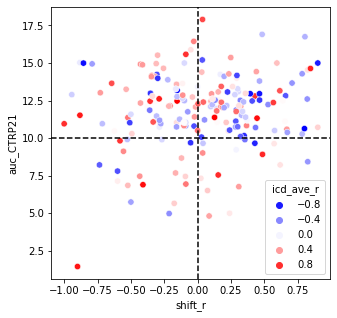

In [712]:
plt.figure(figsize=(5, 5))
sns.scatterplot(x='shift_r',
                y='auc_CTRP21',
                hue='icd_ave_r',
                palette='bwr',
                s=40, alpha=1,
                data=ctrp_dd_icd_rs_24)
plt.axvline(x=0.0, ls='--', c='k')
plt.axhline(y=10.0, ls='--', c='k')

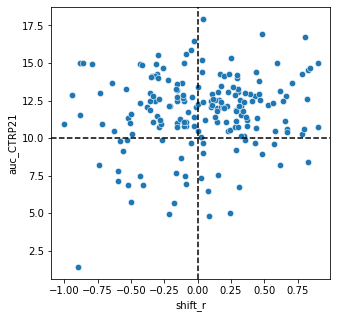

In [713]:
plt.figure(figsize=(5, 5))
sns.scatterplot(x='shift_r',
                y='auc_CTRP21',
                # hue='icd_ave_r',
                # palette='bwr',
                s=40, alpha=1,
                data=ctrp_dd_icd_rs_24)
plt.axvline(x=0.0, ls='--', c='k')
plt.axhline(y=10.0, ls='--', c='k')

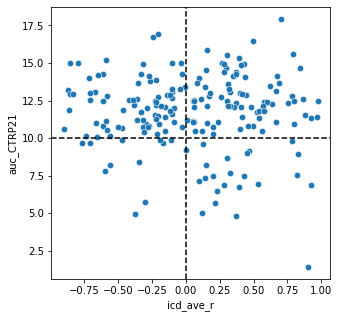

In [714]:
plt.figure(figsize=(5, 5))
sns.scatterplot(x='icd_ave_r',
                y='auc_CTRP21',
                s=40, alpha=1,
                data=ctrp_dd_icd_rs_24)
plt.axvline(x=0.0, ls='--', c='k')
plt.axhline(y=10.0, ls='--', c='k')

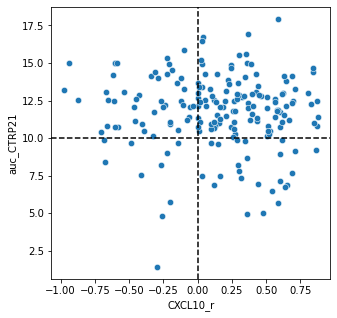

In [737]:
plt.figure(figsize=(5, 5))
sns.scatterplot(x='CXCL10_r',
                y='auc_CTRP21',
                s=40, alpha=1,
                data=ctrp_dd_icd_rs_24)
plt.axvline(x=0.0, ls='--', c='k')
plt.axhline(y=10.0, ls='--', c='k')

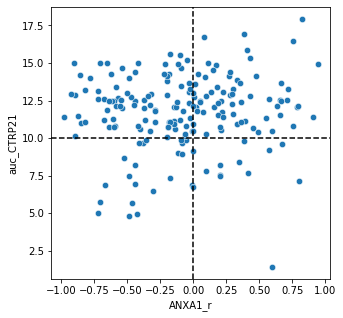

In [738]:
plt.figure(figsize=(5, 5))
sns.scatterplot(x='ANXA1_r',
                y='auc_CTRP21',
                s=40, alpha=1,
                data=ctrp_dd_icd_rs_24)
plt.axvline(x=0.0, ls='--', c='k')
plt.axhline(y=10.0, ls='--', c='k')

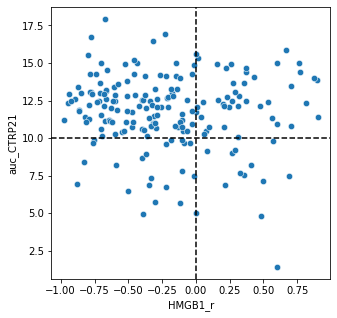

In [739]:
plt.figure(figsize=(5, 5))
sns.scatterplot(x='HMGB1_r',
                y='auc_CTRP21',
                s=40, alpha=1,
                data=ctrp_dd_icd_rs_24)
plt.axvline(x=0.0, ls='--', c='k')
plt.axhline(y=10.0, ls='--', c='k')

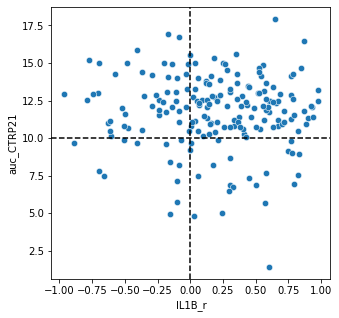

In [741]:
plt.figure(figsize=(5, 5))
sns.scatterplot(x='IL1B_r',
                y='auc_CTRP21',
                s=40, alpha=1,
                data=ctrp_dd_icd_rs_24)
plt.axvline(x=0.0, ls='--', c='k')
plt.axhline(y=10.0, ls='--', c='k')

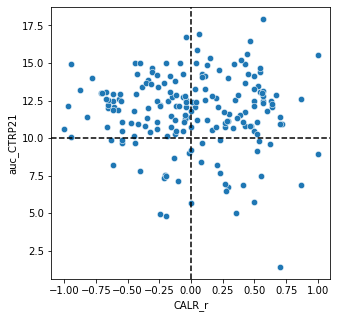

In [742]:
plt.figure(figsize=(5, 5))
sns.scatterplot(x='CALR_r',
                y='auc_CTRP21',
                s=40, alpha=1,
                data=ctrp_dd_icd_rs_24)
plt.axvline(x=0.0, ls='--', c='k')
plt.axhline(y=10.0, ls='--', c='k')

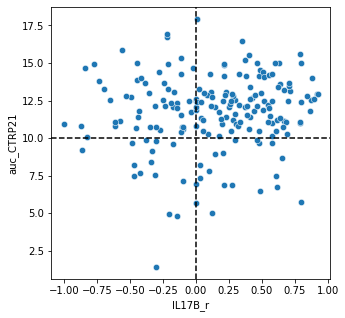

In [743]:
plt.figure(figsize=(5, 5))
sns.scatterplot(x='IL17B_r',
                y='auc_CTRP21',
                s=40, alpha=1,
                data=ctrp_dd_icd_rs_24)
plt.axvline(x=0.0, ls='--', c='k')
plt.axhline(y=10.0, ls='--', c='k')

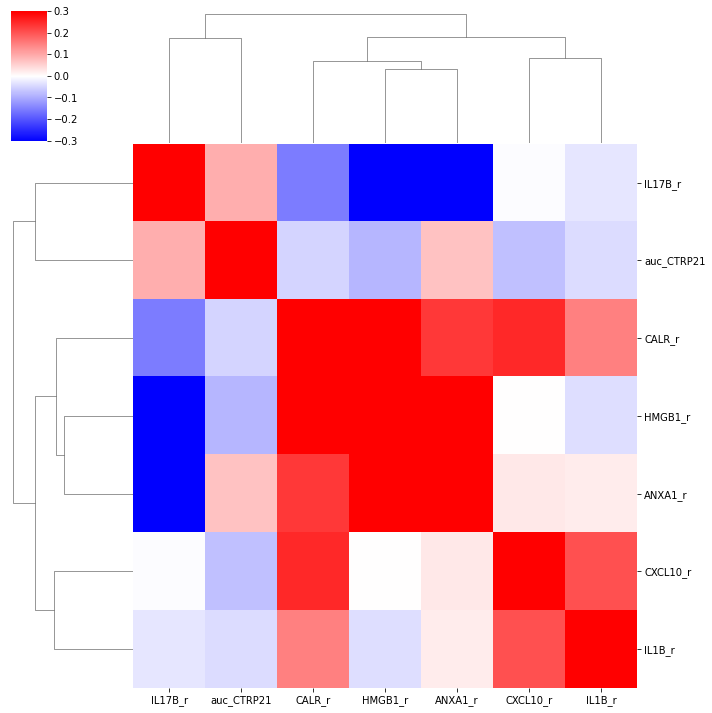

In [752]:
sns.clustermap(ctrp_dd_icd_rs_24[['CXCL10_r', 'HMGB1_r', 'IL17B_r', 'CALR_r', 'IL1B_r', 'ANXA1_r', 'auc_CTRP21']].astype(float).corr(),
               vmin=-.3, vmax=.3, cmap='bwr')

In [753]:
ctrp_dd_icd_rs_24[['CXCL10_r', 'HMGB1_r', 'IL17B_r', 'CALR_r', 'IL1B_r', 'ANXA1_r', 'auc_CTRP21']].astype(float).corr()

,CXCL10_r,HMGB1_r,IL17B_r,CALR_r,IL1B_r,ANXA1_r,auc_CTRP21
CXCL10_r,1.000000,0.001124,-0.002804,0.251485,0.205039,0.027652,-0.074210
HMGB1_r,0.001124,1.000000,-0.337056,0.307894,-0.039790,0.314194,-0.086210
IL17B_r,-0.002804,-0.337056,1.000000,-0.152350,-0.028765,-0.429064,0.093992
CALR_r,0.251485,0.307894,-0.152350,1.000000,0.149617,0.232254,-0.050985
IL1B_r,0.205039,-0.039790,-0.028765,0.149617,1.000000,0.022599,-0.040461
ANXA1_r,0.027652,0.314194,-0.429064,0.232254,0.022599,1.000000,0.071379
auc_CTRP21,-0.074210,-0.086210,0.093992,-0.050985,-0.040461,0.071379,1.000000


<AxesSubplot:xlabel='icd_ave_r', ylabel='auc_CTRP21'>

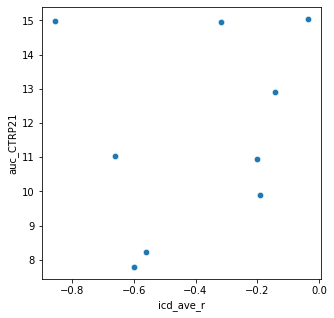

In [719]:
# cat I
plt.figure(figsize=(5, 5))
sns.scatterplot(x='icd_ave_r',
                y='auc_CTRP21',
                s=40, alpha=1,
                data=ctrp_dd_icd_rs_24[ctrp_dd_icd_rs_24.index.isin(cat_I_expand_icd_moa.index)])

In [728]:
ctrp_dd_icd_rs_24[ctrp_dd_icd_rs_24.index.isin(cat_I_expand_icd_moa.index)]

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_ave_r,icd_ave_p,ANXA1_r,ANXA1_p,...,IL17B_r,IL17B_p,cancer_type,cell_line,cmap_name,#experiments,moa,target,auc_CTRP21,auc_CTRP22
SKBR3_NVP-BEZ235,-0.6,0.284757,-0.6,0.284757,0.7,0.18812,-0.6,0.284757,0.100000,0.872889,...,0.100000,0.872889,BRCA,SKBR3,NVP-BEZ235,5.0,MTOR inhibitor,MTOR,7.8046,7.8046
MCF7_ixazomib,-0.942857,0.00480466,-0.885714,0.0188455,0.942857,0.00480466,-0.142857,0.787172,-0.200000,0.704000,...,0.085714,0.871743,BRCA,MCF7,ixazomib,6.0,Proteasome inhibitor,PSMB1,12.896,12.896
MDAMB231_BI-2536,-0.735612,0.0956108,-0.647339,0.164625,-0.470792,0.345986,-0.559065,0.248771,-0.441367,0.380939,...,0.029424,0.955876,BRCA,MDAMB231,BI-2536,6.0,PLK inhibitor,PLK1,8.2157,8.2157
HT29_SN-38,-0.882919,0.00845034,-0.900937,0.00562059,-0.0900937,0.847672,-0.0360375,0.938861,-0.414431,0.355269,...,0.630656,0.128888,CRC,HT29,SN-38,7.0,Topoisomerase inhibitor,TOP1,15.028,15.028
HT29_foretinib,-0.790569,0.111367,-0.790569,0.111367,-0.737865,0.154619,-0.316228,0.604181,-0.210819,0.733579,...,-0.210819,0.733579,CRC,HT29,foretinib,5.0,VEGFR inhibitor,KDR,14.944,14.944
A549_apicidin,-0.714286,0.110787,-0.6,0.208,0.771429,0.0723965,-0.2,0.704,-0.142857,0.787172,...,-1.000000,0.000000,LUNG,A549,apicidin,6.0,HDAC inhibitor,HDAC6,10.9593,10.78
PC3_panobinostat,-0.527094,0.00678219,-0.286059,0.165674,0.43821,0.0284483,-0.192129,0.357533,-0.355148,0.081485,...,0.466156,0.018838,PRAD,PC3,panobinostat,25.0,HDAC inhibitor,HDAC1,9.9078,9.9078
PC3_cytarabine,-0.855606,0.00673489,-0.855606,0.00673489,0.932227,0.000739205,-0.855606,0.00673489,-0.651282,0.080221,...,-0.446958,0.266876,PRAD,PC3,cytarabine,8.0,Ribonucleotide reductase inhibitor,POLA1,14.995,14.995
PC3_apicidin,-0.508548,0.162109,-0.661112,0.052514,-0.42379,0.255659,-0.661112,0.052514,-0.847579,0.003909,...,0.576354,0.104290,PRAD,PC3,apicidin,9.0,HDAC inhibitor,HDAC6,11.027,11.027


In [733]:
ctrp_dd_icd_rs_24[ctrp_dd_icd_rs_24.index.isin(cat_I_expand_icd_moa.index)]['auc_CTRP21'].mean()

11.753048148148148

In [721]:
ctrp_dd_icd_rs_24.loc['PC3_panobinostat', :]

shift_r              -0.527094
shift_p             0.00678219
rec_r                -0.286059
rec_p                 0.165674
nrec_r                 0.43821
nrec_p               0.0284483
icd_ave_r            -0.192129
icd_ave_p             0.357533
ANXA1_r              -0.355148
ANXA1_p              0.0814848
CALR_r                0.227838
CALR_p                0.273362
CXCL10_r              0.289552
CXCL10_p              0.160341
HMGB1_r              -0.105574
HMGB1_p                0.61549
IL1B_r               -0.505746
IL1B_p              0.00990362
IL17B_r               0.466156
IL17B_p              0.0188377
cancer_type               PRAD
cell_line                  PC3
cmap_name         panobinostat
#experiments                25
moa             HDAC inhibitor
target                   HDAC1
auc_CTRP21              9.9078
auc_CTRP22              9.9078
Name: PC3_panobinostat, dtype: object

In [722]:
ctrp_dd_icd_rs_24.loc['PC3_cytarabine', :]

shift_r                                  -0.855606
shift_p                                 0.00673489
rec_r                                    -0.855606
rec_p                                   0.00673489
nrec_r                                    0.932227
nrec_p                                 0.000739205
icd_ave_r                                -0.855606
icd_ave_p                               0.00673489
ANXA1_r                                  -0.651282
ANXA1_p                                   0.080221
CALR_r                                   0.0383107
CALR_p                                    0.928238
CXCL10_r                                 -0.587431
CXCL10_p                                  0.125721
HMGB1_r                                   0.766214
HMGB1_p                                  0.0266052
IL1B_r                                   -0.485269
IL1B_p                                    0.222872
IL17B_r                                  -0.446958
IL17B_p                        

In [723]:
ctrp_dd_icd_rs_24.loc['PC3_apicidin', :]

shift_r              -0.508548
shift_p               0.162109
rec_r                -0.661112
rec_p                 0.052514
nrec_r                -0.42379
nrec_p                0.255659
icd_ave_r            -0.661112
icd_ave_p             0.052514
ANXA1_r              -0.847579
ANXA1_p             0.00390855
CALR_r                0.271225
CALR_p                0.480225
CXCL10_r              0.847579
CXCL10_p            0.00390855
HMGB1_r              -0.305129
HMGB1_p               0.424627
IL1B_r               -0.627209
IL1B_p               0.0706052
IL17B_r               0.576354
IL17B_p                0.10429
cancer_type               PRAD
cell_line                  PC3
cmap_name             apicidin
#experiments                 9
moa             HDAC inhibitor
target                   HDAC6
auc_CTRP21              11.027
auc_CTRP22              11.027
Name: PC3_apicidin, dtype: object

In [724]:
# cat II
ctrp_dd_icd_rs_24[ctrp_dd_icd_rs_24.index.isin(cat_II_expand_icd_moa.index)]

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_ave_r,icd_ave_p,ANXA1_r,ANXA1_p,...,IL17B_r,IL17B_p,cancer_type,cell_line,cmap_name,#experiments,moa,target,auc_CTRP21,auc_CTRP22
MCF7_teniposide,0.615587,0.268998,0.359092,0.552815,-0.46169,0.433766,0.666886,0.218894,-0.718185,0.171795,...,0.718185,0.171795,BRCA,MCF7,teniposide,5.0,Topoisomerase inhibitor,TOP2A,13.153,13.153
MDAMB231_selumetinib,0.654654,0.110567,0.672838,0.0976491,-0.218218,0.638299,0.0545545,0.907523,-0.145479,0.755633,...,0.672838,0.097649,BRCA,MDAMB231,selumetinib,7.0,MEK inhibitor,MAP2K1,11.119,11.119
HEPG2_clofarabine,0.9,0.0373861,0.7,0.18812,-0.7,0.18812,-0.8,0.104088,-0.900000,0.037386,...,0.600000,0.284757,LIHC,HEPG2,clofarabine,5.0,Ribonucleoside reductase inhibitor,POLA1,15,15
A549_tanespimycin,0.668153,0.100897,0.267261,0.562312,-0.534522,0.216437,0.400892,0.372769,-0.133631,0.775162,...,0.400892,0.372769,LUNG,A549,tanespimycin,7.0,HSP inhibitor,HSP90AA1,10.592,10.726
YAPC_MK-1775,0.820783,0.088587,0.153897,0.804829,-0.872082,0.0538542,-0.359092,0.552815,-0.718185,0.171795,...,0.410391,0.492536,PAAD,YAPC,MK-1775,5.0,WEE1 kinase inhibitor,WEE1,12.603,12.603
PC3_crizotinib,0.707107,0.18169,0,1,-0.707107,0.18169,-0.353553,0.559404,0.353553,0.559404,...,0.707107,0.181690,PRAD,PC3,crizotinib,5.0,ALK inhibitor,ALK,13.668,13.668
PC3_PI-103,0.576354,0.10429,0.186467,0.630967,-0.695015,0.0376883,-0.152564,0.695164,0.593306,0.092162,...,0.610257,0.080940,PRAD,PC3,PI-103,9.0,MTOR inhibitor,MTOR,10.505,10.505
PC3_BMS-387032,0.566947,0.1428,0.818923,0.0129004,-0.251976,0.547162,0.755929,0.0300197,0.188982,0.654005,...,-0.188982,0.654005,PRAD,PC3,BMS-387032,8.0,CDK inhibitor,CDK2,12.367,12.367
PC3_dinaciclib,0.572823,0.0654876,0.669833,0.0241411,-0.161684,0.634824,0.129347,0.704658,0.669833,0.024141,...,-0.170923,0.615325,PRAD,PC3,dinaciclib,11.0,CDK inhibitor,CDK2,9.6294,9.6294
A375_manumycin-a,0.845154,0.0341094,0.777542,0.0687269,-0.169031,0.748868,0.845154,0.0341094,-0.540899,0.267778,...,-0.845154,0.034109,SKCM,A375,manumycin-a,6.0,NFKB pathway inhibitor,FNTA,14.6365,13.201


In [734]:
ctrp_dd_icd_rs_24[ctrp_dd_icd_rs_24.index.isin(cat_II_expand_icd_moa.index)]['auc_CTRP21'].mean()

12.503616666666666

In [725]:
# cat III
ctrp_dd_icd_rs_24[ctrp_dd_icd_rs_24.index.isin(cat_III_expand_icd_moa.index)]

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_ave_r,icd_ave_p,ANXA1_r,ANXA1_p,...,IL17B_r,IL17B_p,cancer_type,cell_line,cmap_name,#experiments,moa,target,auc_CTRP21,auc_CTRP22
SKBR3_alvocidib,-0.6,0.284757,-0.7,0.18812,-0.6,0.284757,0.1,0.872889,0.800000,0.104088,...,-0.100000,0.872889,BRCA,SKBR3,alvocidib,5.0,CDK inhibitor,CDK2,7.1397,7.1397
MCF7_triptolide,-0.522472,0.0217361,-0.346259,0.146442,0.71102,0.000643091,0.540093,0.0169822,0.552428,0.014178,...,0.042291,0.863513,BRCA,MCF7,triptolide,19.0,NaN,NaN,11.367,11.367
MCF7_doxorubicin,-0.581737,0.000746482,0.0264732,0.889559,0.669233,5.26094e-05,0.781632,3.41024e-07,0.387899,0.034170,...,-0.305115,0.101102,BRCA,MCF7,doxorubicin,30.0,Topoisomerase inhibitor,TOP2A,9.8217,9.8217
MCF7_ixazomib,-0.942857,0.00480466,-0.885714,0.0188455,0.942857,0.00480466,-0.142857,0.787172,-0.200000,0.704000,...,0.085714,0.871743,BRCA,MCF7,ixazomib,6.0,Proteasome inhibitor,PSMB1,12.896,12.896
HT29_SN-38,-0.882919,0.00845034,-0.900937,0.00562059,-0.0900937,0.847672,-0.0360375,0.938861,-0.414431,0.355269,...,0.630656,0.128888,CRC,HT29,SN-38,7.0,Topoisomerase inhibitor,TOP1,15.028,15.028
HT29_doxorubicin,-0.729474,0.000591275,-0.633737,0.00474324,0.294495,0.235514,0.398557,0.101369,-0.003122,0.990191,...,0.061397,0.808772,CRC,HT29,doxorubicin,18.0,Topoisomerase inhibitor,TOP2A,13.02,13.02
HT29_panobinostat,-0.522958,0.0988132,-0.362401,0.273392,0.46791,0.146674,0.279828,0.40462,-0.009175,0.978641,...,0.211018,0.533390,CRC,HT29,panobinostat,11.0,HDAC inhibitor,HDAC1,6.8542,6.8542
A549_doxorubicin,-0.55578,0.00261366,-0.435298,0.0232466,0.554215,0.00270322,0.464401,0.0146729,0.000000,1.000000,...,-0.336722,0.085900,LUNG,A549,doxorubicin,27.0,Topoisomerase inhibitor,TOP2A,9.1233,9.4522
A549_apicidin,-0.714286,0.110787,-0.6,0.208,0.771429,0.0723965,-0.2,0.704,-0.142857,0.787172,...,-1.000000,0.000000,LUNG,A549,apicidin,6.0,HDAC inhibitor,HDAC6,10.9593,10.78
PC3_triptolide,-0.643842,0.0325356,-0.337903,0.309475,0.78083,0.00455803,0.684939,0.0200397,0.662107,0.026454,...,-0.388132,0.238175,PRAD,PC3,triptolide,11.0,NaN,NaN,13.651,13.651


In [735]:
ctrp_dd_icd_rs_24[ctrp_dd_icd_rs_24.index.isin(cat_III_expand_icd_moa.index)]['auc_CTRP21'].mean()

10.816539583333336

In [726]:
# cat IV
ctrp_dd_icd_rs_24[ctrp_dd_icd_rs_24.index.isin(cat_IV_expand_icd_moa.index)]

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_ave_r,icd_ave_p,ANXA1_r,ANXA1_p,...,IL17B_r,IL17B_p,cancer_type,cell_line,cmap_name,#experiments,moa,target,auc_CTRP21,auc_CTRP22
MCF7_entinostat,0.782717,2.74149e-05,0.508007,0.0187145,-0.748896,9.3818e-05,-0.21259,0.354866,0.095251,0.681289,...,0.093181,0.687878,BRCA,MCF7,entinostat,21.0,HDAC inhibitor,HDAC1,10.274,10.274
MCF7_teniposide,0.615587,0.268998,0.359092,0.552815,-0.46169,0.433766,0.666886,0.218894,-0.718185,0.171795,...,0.718185,0.171795,BRCA,MCF7,teniposide,5.0,Topoisomerase inhibitor,TOP2A,13.153,13.153
MCF7_sirolimus,0.824786,0.0117424,-0.123718,0.770385,-0.866025,0.00542395,-0.343661,0.404572,0.343661,0.404572,...,-0.343661,0.404572,BRCA,MCF7,sirolimus,8.0,MTOR inhibitor,FKBP1A,8.4275,8.4275
MDAMB231_selumetinib,0.654654,0.110567,0.672838,0.0976491,-0.218218,0.638299,0.0545545,0.907523,-0.145479,0.755633,...,0.672838,0.097649,BRCA,MDAMB231,selumetinib,7.0,MEK inhibitor,MAP2K1,11.119,11.119
HT29_selumetinib,0.527426,0.029574,0.487993,0.0468925,-0.330258,0.195437,-0.385711,0.126245,-0.449791,0.070060,...,0.325328,0.202593,CRC,HT29,selumetinib,17.0,MEK inhibitor,MAP2K1,12.234,12.234
HT29_MK-2206,0.823329,0.0228546,0.018712,0.968239,-0.898177,0.00601109,0.149696,0.748706,0.149696,0.748706,...,0.486513,0.268241,CRC,HT29,MK-2206,7.0,Akt inhibitor,AKT1,14.54,14.54
HT29_dasatinib,0.658699,0.0383403,0.401493,0.250141,-0.746525,0.0131258,-0.583419,0.0766446,0.094100,0.795970,...,-0.526959,0.117566,CRC,HT29,dasatinib,10.0,KIT inhibitor,EPHA2,12.821,12.821
HT29_sirolimus,0.803756,0.00163169,0.617999,0.0322211,-0.600138,0.039106,-0.242913,0.44681,0.082162,0.799614,...,-0.217907,0.496277,CRC,HT29,sirolimus,12.0,MTOR inhibitor,FKBP1A,16.75,16.75
HEPG2_clofarabine,0.9,0.0373861,0.7,0.18812,-0.7,0.18812,-0.8,0.104088,-0.900000,0.037386,...,0.600000,0.284757,LIHC,HEPG2,clofarabine,5.0,Ribonucleoside reductase inhibitor,POLA1,15,15
HEPG2_topotecan,0.8,0.104088,0.6,0.284757,0.2,0.74706,-0.9,0.0373861,-0.400000,0.504632,...,-0.100000,0.872889,LIHC,HEPG2,topotecan,5.0,Topoisomerase inhibitor,TOP1,10.633,10.633


In [736]:
ctrp_dd_icd_rs_24[ctrp_dd_icd_rs_24.index.isin(cat_IV_expand_icd_moa.index)]['auc_CTRP21'].mean()

12.457694444444446

# ICD ssGSEA enrichment

In [22]:
# read ICD results
enr_icd_nes = []
enr_icd_fdr = []
for ct in compound_cancer:
    tmp_nes = pd.read_csv(gsea_home + ct + '/enr_result_trt_cp/nes_hallmark_ICD.csv',
                          index_col=0, header=0, sep=',')
    tmp_fdr = pd.read_csv(gsea_home + ct + '/enr_result_trt_cp/fdr_hallmark_ICD.csv',
                          index_col=0, header=0, sep=',')
    
    tmp_nes['cancer_type'] = ct
    tmp_fdr['cancer_type'] = ct
    
    enr_icd_nes.append(tmp_nes)
    enr_icd_fdr.append(tmp_fdr)

In [23]:
enr_icd_nes_matrix = pd.concat(enr_icd_nes, axis=0)
enr_icd_nes_matrix

,ICD_chemical,cmap_name,nearest_dose,pert_idose,cancer_type
ERBB2001_VMCUB1_24H:BRD-K42805893:10,0.662209,AZD-9291,10.0,10 uM,BLCA
ERBB2001_VMCUB1_24H:BRD-K66175015:10,-0.591002,afatinib,10.0,10 uM,BLCA
ERBB2002_5637_24H:BRD-K66175015:10,-1.512297,afatinib,10.0,10 uM,BLCA
ERBB2002_J82_24H:BRD-K42805893:10,0.688498,AZD-9291,10.0,10 uM,BLCA
ERBB2002_J82_24H:BRD-K66175015:10,1.002603,afatinib,10.0,10 uM,BLCA
...,...,...,...,...,...
CPC006_SNGM_6H:BRD-K92317137-001-04-0:10,-1.062202,BRD-K92317137,10.0,10 uM,UCEC
ERBB2001_MFE319_24H:BRD-K42805893:10,-0.807737,AZD-9291,10.0,10 uM,UCEC
ERBB2002_AN3CA_24H:BRD-K42805893:10,0.703145,AZD-9291,10.0,10 uM,UCEC
ERBB2002_AN3CA_24H:BRD-K66175015:10,0.959695,afatinib,10.0,10 uM,UCEC


In [24]:
enr_icd_fdr_matrix = pd.concat(enr_icd_fdr, axis=0)
enr_icd_fdr_matrix

,ICD_chemical,cmap_name,nearest_dose,pert_idose,cancer_type
ERBB2001_VMCUB1_24H:BRD-K42805893:10,0.862069,AZD-9291,10.0,10 uM,BLCA
ERBB2001_VMCUB1_24H:BRD-K66175015:10,1.000000,afatinib,10.0,10 uM,BLCA
ERBB2002_5637_24H:BRD-K66175015:10,0.071429,afatinib,10.0,10 uM,BLCA
ERBB2002_J82_24H:BRD-K42805893:10,0.933333,AZD-9291,10.0,10 uM,BLCA
ERBB2002_J82_24H:BRD-K66175015:10,0.410714,afatinib,10.0,10 uM,BLCA
...,...,...,...,...,...
CPC006_SNGM_6H:BRD-K92317137-001-04-0:10,0.355556,BRD-K92317137,10.0,10 uM,UCEC
ERBB2001_MFE319_24H:BRD-K42805893:10,0.652174,AZD-9291,10.0,10 uM,UCEC
ERBB2002_AN3CA_24H:BRD-K42805893:10,0.844444,AZD-9291,10.0,10 uM,UCEC
ERBB2002_AN3CA_24H:BRD-K66175015:10,0.539683,afatinib,10.0,10 uM,UCEC


In [28]:
# add treatment time
enr_icd_nes_matrix['time'] = sig_info['pert_time']
enr_icd_fdr_matrix['time'] = sig_info['pert_time']

# add tas
enr_icd_fdr_matrix['tas'] = sig_info['tas']
enr_icd_nes_matrix['tas'] = sig_info['tas']

# add cell line
enr_icd_fdr_matrix['cell_line'] = sig_info['cell_mfc_name']
enr_icd_nes_matrix['cell_line'] = sig_info['cell_mfc_name']

# add dosage cat
enr_icd_nes_matrix['dose_cat'] = merged_rs_cp_table['dosage']
enr_icd_fdr_matrix['dose_cat'] = merged_rs_cp_table['dosage']


In [29]:
enr_icd_fdr_matrix.to_csv(poseidon_home + 'results/compound_top_moa/icd_enr_fdr.csv')
enr_icd_nes_matrix.to_csv(poseidon_home + 'results/compound_top_moa/icd_enr_nes.csv')

In [30]:
enr_icd_nes_matrix

,ICD_chemical,cmap_name,nearest_dose,pert_idose,cancer_type,time,tas,cell_line,dose_cat
ERBB2001_VMCUB1_24H:BRD-K42805893:10,0.662209,AZD-9291,10.0,10 uM,BLCA,24.0,0.633699,VMCUB1,NaN
ERBB2001_VMCUB1_24H:BRD-K66175015:10,-0.591002,afatinib,10.0,10 uM,BLCA,24.0,0.642751,VMCUB1,NaN
ERBB2002_5637_24H:BRD-K66175015:10,-1.512297,afatinib,10.0,10 uM,BLCA,24.0,0.547723,5637,NaN
ERBB2002_J82_24H:BRD-K42805893:10,0.688498,AZD-9291,10.0,10 uM,BLCA,24.0,0.401416,J82,NaN
ERBB2002_J82_24H:BRD-K66175015:10,1.002603,afatinib,10.0,10 uM,BLCA,24.0,0.543158,J82,NaN
...,...,...,...,...,...,...,...,...,...
CPC006_SNGM_6H:BRD-K92317137-001-04-0:10,-1.062202,BRD-K92317137,10.0,10 uM,UCEC,6.0,0.481806,SNGM,NaN
ERBB2001_MFE319_24H:BRD-K42805893:10,-0.807737,AZD-9291,10.0,10 uM,UCEC,24.0,0.420342,MFE319,NaN
ERBB2002_AN3CA_24H:BRD-K42805893:10,0.703145,AZD-9291,10.0,10 uM,UCEC,24.0,0.440858,AN3CA,NaN
ERBB2002_AN3CA_24H:BRD-K66175015:10,0.959695,afatinib,10.0,10 uM,UCEC,24.0,0.428437,AN3CA,NaN


In [34]:
enr_icd_nes_matrix['dose_cat'].value_counts()

medium    13716
low        3233
high       2921
Name: dose_cat, dtype: int64

In [36]:
merged_rs_cp_table['dosage'].value_counts()

medium    13716
low        3233
high       2921
Name: dosage, dtype: int64

In [37]:
# take only responder-shifting subset
enr_icd_nes_rs = enr_icd_nes_matrix.dropna(axis=0, how='any')
enr_icd_fdr_rs = enr_icd_fdr_matrix.dropna(axis=0, how='any')

In [45]:
# add shift ability
enr_icd_nes_rs['shift_ability'] = merged_rs_cp_table['shift_ability']
enr_icd_fdr_rs['shift_ability'] = merged_rs_cp_table['shift_ability']

enr_icd_nes_rs['NREC_profile'] = merged_rs_cp_table['NREC_profile']
enr_icd_fdr_rs['NREC_profile'] = merged_rs_cp_table['NREC_profile']

enr_icd_nes_rs['REC_profile'] = merged_rs_cp_table['REC_profile']
enr_icd_fdr_rs['REC_profile'] = merged_rs_cp_table['REC_profile']

<ipython-input-45-29da99e64151>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  enr_icd_nes_rs['shift_ability'] = merged_rs_cp_table['shift_ability']
<ipython-input-45-29da99e64151>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  enr_icd_fdr_rs['shift_ability'] = merged_rs_cp_table['shift_ability']
<ipython-input-45-29da99e64151>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the doc

In [46]:
enr_icd_fdr_rs

,ICD_chemical,cmap_name,nearest_dose,pert_idose,cancer_type,time,tas,cell_line,dose_cat,shift_ability,NREC_profile,REC_profile
ABY001_SKBR3_XH:BRD-K19687926:0.625:24,0.600000,lapatinib,0.66,0.66 uM,BRCA,24.0,0.412509,SKBR3,low,0.700579,-0.416129,0.284450
ABY001_SKBR3_XH:BRD-K19687926:10:24,0.987013,lapatinib,10.00,10 uM,BRCA,24.0,0.616939,SKBR3,medium,0.620540,-0.361039,0.259501
ABY001_SKBR3_XH:BRD-K19687926:2.5:24,0.967213,lapatinib,2.50,2.5 uM,BRCA,24.0,0.533049,SKBR3,medium,0.561296,-0.358472,0.202824
ABY001_SKBR3_XH:BRD-K21680192:2.5:24,0.000000,mitoxantrone,2.50,2.5 uM,BRCA,24.0,0.636131,SKBR3,medium,0.530530,-0.263938,0.266592
ABY001_SKBR3_XH:BRD-K66175015:0.625:24,0.050000,afatinib,0.66,0.66 uM,BRCA,24.0,0.502163,SKBR3,low,0.690177,-0.341525,0.348652
...,...,...,...,...,...,...,...,...,...,...,...,...
REP.B028_A375_24H:K20,0.102041,brequinar,0.74,0.74 uM,SKCM,24.0,0.695585,A375,low,0.953838,-0.407992,0.545847
REP.B028_A375_24H:K21,0.022222,brequinar,0.25,0.25 uM,SKCM,24.0,0.626767,A375,low,0.927420,-0.407876,0.519543
REP.B028_A375_24H:L07,0.404255,BRD-K63750851,2.22,2.22 uM,SKCM,24.0,0.696944,A375,medium,0.945450,-0.406314,0.539136
REP.B028_A375_24H:L08,0.078431,BRD-K63750851,0.74,0.74 uM,SKCM,24.0,0.648442,A375,low,0.909560,-0.386062,0.523497


In [47]:
enr_icd_nes_rs

,ICD_chemical,cmap_name,nearest_dose,pert_idose,cancer_type,time,tas,cell_line,dose_cat,shift_ability,NREC_profile,REC_profile
ABY001_SKBR3_XH:BRD-K19687926:0.625:24,-0.877065,lapatinib,0.66,0.66 uM,BRCA,24.0,0.412509,SKBR3,low,0.700579,-0.416129,0.284450
ABY001_SKBR3_XH:BRD-K19687926:10:24,0.562791,lapatinib,10.00,10 uM,BRCA,24.0,0.616939,SKBR3,medium,0.620540,-0.361039,0.259501
ABY001_SKBR3_XH:BRD-K19687926:2.5:24,0.555482,lapatinib,2.50,2.5 uM,BRCA,24.0,0.533049,SKBR3,medium,0.561296,-0.358472,0.202824
ABY001_SKBR3_XH:BRD-K21680192:2.5:24,2.075618,mitoxantrone,2.50,2.5 uM,BRCA,24.0,0.636131,SKBR3,medium,0.530530,-0.263938,0.266592
ABY001_SKBR3_XH:BRD-K66175015:0.625:24,1.578171,afatinib,0.66,0.66 uM,BRCA,24.0,0.502163,SKBR3,low,0.690177,-0.341525,0.348652
...,...,...,...,...,...,...,...,...,...,...,...,...
REP.B028_A375_24H:K20,1.437456,brequinar,0.74,0.74 uM,SKCM,24.0,0.695585,A375,low,0.953838,-0.407992,0.545847
REP.B028_A375_24H:K21,1.694157,brequinar,0.25,0.25 uM,SKCM,24.0,0.626767,A375,low,0.927420,-0.407876,0.519543
REP.B028_A375_24H:L07,0.962670,BRD-K63750851,2.22,2.22 uM,SKCM,24.0,0.696944,A375,medium,0.945450,-0.406314,0.539136
REP.B028_A375_24H:L08,1.332911,BRD-K63750851,0.74,0.74 uM,SKCM,24.0,0.648442,A375,low,0.909560,-0.386062,0.523497


In [48]:
enr_icd_fdr_rs.to_csv(poseidon_home + 'results/compound_top_moa/icd_enr_fdr_Rshifting.csv')
enr_icd_nes_rs.to_csv(poseidon_home + 'results/compound_top_moa/icd_enr_nes_Rshifting.csv')

# Shift vs. ICD

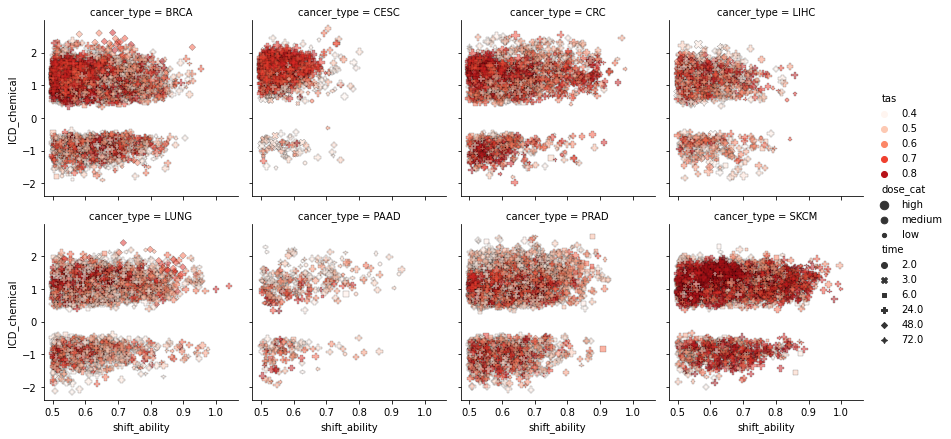

In [56]:
# alpha-gamma by cancer type
sns.relplot(x='shift_ability',
            y='ICD_chemical',
            col='cancer_type', col_wrap=4,
            size='dose_cat', size_order=['high', 'medium', 'low'],
            height=3, aspect=1,
            vmin=0.4, vmax=1,
            style='time',
            hue='tas', palette='Reds',
            alpha=0.5, edgecolor='k',
            data=enr_icd_nes_rs)

# Dosage

In [60]:
# dosage-dependence in each cell line (R-shifting)
dose_dep_icd_rs = df(columns=['shift_r', 'shift_p', 'rec_r', 'rec_p', 'nrec_r', 'nrec_p',
                            'icd_r', 'icd_p', 'cell_line', 'cancer_type',
                           'cmap_name', '#experiments', 'moa', 'target'])
for ct in enr_icd_nes_rs['cancer_type'].unique():
    tmp_rs = enr_icd_nes_rs[enr_icd_nes_rs['cancer_type'] == ct]
    for cl in tmp_rs['cell_line'].unique():
        tmp_rs_cl = tmp_rs[tmp_rs['cell_line'] == cl]
        for d in tmp_rs_cl['cmap_name'].unique():
            tmp_rs_cl_d = tmp_rs_cl[tmp_rs_cl['cmap_name'] == d]
            if tmp_rs_cl_d.shape[0] >= 5:
                tmp_a_r, tmp_a_p = stats.spearmanr(tmp_rs_cl_d['shift_ability'], tmp_rs_cl_d['nearest_dose'])
                tmp_g_r, tmp_g_p = stats.spearmanr(tmp_rs_cl_d['REC_profile'], tmp_rs_cl_d['nearest_dose'])
                tmp_ng_r, tmp_ng_p = stats.spearmanr(tmp_rs_cl_d['NREC_profile'], tmp_rs_cl_d['nearest_dose'])
                tmp_m_r, tmp_m_p = stats.spearmanr(tmp_rs_cl_d['ICD_chemical'], tmp_rs_cl_d['nearest_dose'])
                
                dose_dep_icd_rs.at[cl + '_' + d, 'shift_r'] = tmp_a_r
                dose_dep_icd_rs.at[cl + '_' + d, 'shift_p'] = tmp_a_p
                dose_dep_icd_rs.at[cl + '_' + d, 'rec_r'] = tmp_g_r
                dose_dep_icd_rs.at[cl + '_' + d, 'rec_p'] = tmp_g_p
                dose_dep_icd_rs.at[cl + '_' + d, 'nrec_r'] = tmp_ng_r
                dose_dep_icd_rs.at[cl + '_' + d, 'nrec_p'] = tmp_ng_p
                dose_dep_icd_rs.at[cl + '_' + d, 'icd_r'] = tmp_m_r
                dose_dep_icd_rs.at[cl + '_' + d, 'icd_p'] = tmp_m_p
                dose_dep_icd_rs.at[cl + '_' + d, 'cancer_type'] = ct
                dose_dep_icd_rs.at[cl + '_' + d, 'cell_line'] = cl
                dose_dep_icd_rs.at[cl + '_' + d, 'cmap_name'] = d
                dose_dep_icd_rs.at[cl + '_' + d, '#experiments'] = tmp_rs_cl_d.shape[0]
                dose_dep_icd_rs.at[cl + '_' + d, 'moa'] = compound_info.loc[d, 'moa']
                dose_dep_icd_rs.at[cl + '_' + d, 'target'] = compound_info.loc[d, 'target']

/home/dyang-server/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


In [61]:
dose_dep_icd_rs

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_r,icd_p,cell_line,cancer_type,cmap_name,#experiments,moa,target
SKBR3_mitoxantrone,0.176547,0.737931,-0.0882735,0.867934,-0.882735,0.0198204,-0.441367,0.380939,SKBR3,BRCA,mitoxantrone,6,Topoisomerase inhibitor,TOP2A
SKBR3_afatinib,0.133892,0.731279,-0.209207,0.589047,-0.43515,0.241757,0.29289,0.444355,SKBR3,BRCA,afatinib,9,EGFR inhibitor,EGFR
SKBR3_neratinib,-0.175734,0.651084,0.43515,0.241757,0.661094,0.0525229,0.0502096,0.897928,SKBR3,BRCA,neratinib,9,EGFR inhibitor,EGFR
SKBR3_CGP-60474,-0.079514,0.827159,-0.256892,0.473689,-0.287474,0.420594,0.452618,0.189017,SKBR3,BRCA,CGP-60474,10,CDK inhibitor,CDK1
SKBR3_alvocidib,-0.6,0.208,-0.6,0.208,-0.485714,0.328723,0.142857,0.787172,SKBR3,BRCA,alvocidib,6,CDK inhibitor,CDK2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SKMEL5_cobimetinib,0.6,0.208,0.485714,0.328723,-0.828571,0.0415627,-0.0857143,0.871743,SKMEL5,SKCM,cobimetinib,6,NaN,NaN
SKMEL5_selumetinib,0.9,0.0373861,0.6,0.284757,-0.9,0.0373861,0.3,0.623838,SKMEL5,SKCM,selumetinib,5,MEK inhibitor,MAP2K1
SKMEL5_bortezomib,0.126592,0.745527,0.126592,0.745527,0.253185,0.51098,0.936784,0.000196533,SKMEL5,SKCM,bortezomib,9,Proteasome inhibitor,PSMB1
SKMEL5_dinaciclib,0.2,0.704,0.257143,0.622787,-0.142857,0.787172,0.257143,0.622787,SKMEL5,SKCM,dinaciclib,6,CDK inhibitor,CDK2


In [62]:
dose_dep_icd_rs.to_csv(poseidon_home + 'results/compound_top_moa/all_Rshifting_ICD_dose_dependence.csv', sep=',')

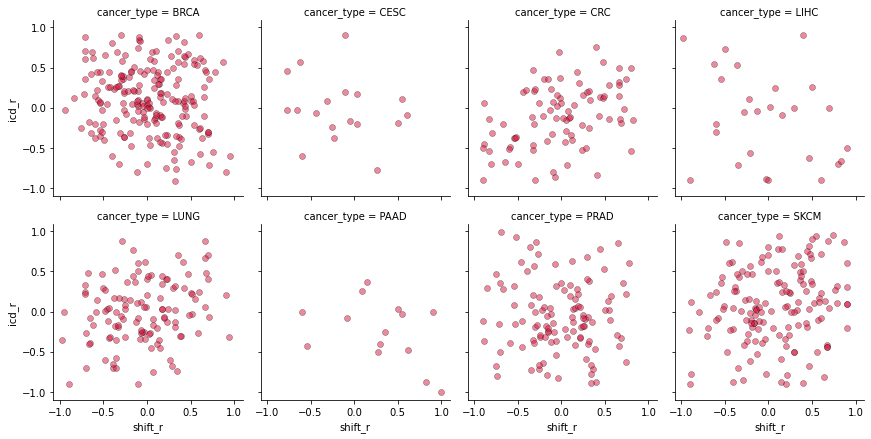

In [79]:
# shift_r vs. icd_r
sns.relplot(x='shift_r',
            y='icd_r',
            col='cancer_type', col_wrap=4,
            height=3, aspect=1,
            color='crimson',
            alpha=0.5, edgecolor='k',
            data=dose_dep_icd_rs)

In [78]:
for ct in dose_dep_icd_rs['cancer_type'].unique():
    tmp = dose_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
    tmp = tmp.dropna(axis=0, how='any')
    print(ct)
    print(stats.spearmanr(tmp['shift_r'], tmp['icd_r']))

BRCA
SpearmanrResult(correlation=-0.12460649577643218, pvalue=0.11527859577532856)
CESC
SpearmanrResult(correlation=-0.22222235669368168, pvalue=0.4451160510821579)
CRC
SpearmanrResult(correlation=0.3276551480771797, pvalue=0.00638054876794422)
LIHC
SpearmanrResult(correlation=-0.2756829379034587, pvalue=0.22643527761737167)
LUNG
SpearmanrResult(correlation=0.21908432475612005, pvalue=0.03020429299196262)
PAAD
SpearmanrResult(correlation=-0.5056960728118078, pvalue=0.1125258312012272)
PRAD
SpearmanrResult(correlation=-0.012330171158554521, pvalue=0.9071340525641739)
SKCM
SpearmanrResult(correlation=0.13904375776809835, pvalue=0.14010585870932005)


In [ ]:
# negative correlation between shift_r and icd_r: high dosage R-shifting, low dosage ICD
# positive correlation between shift_r and icd_r: high dosage R-shifting, high dosage ICD

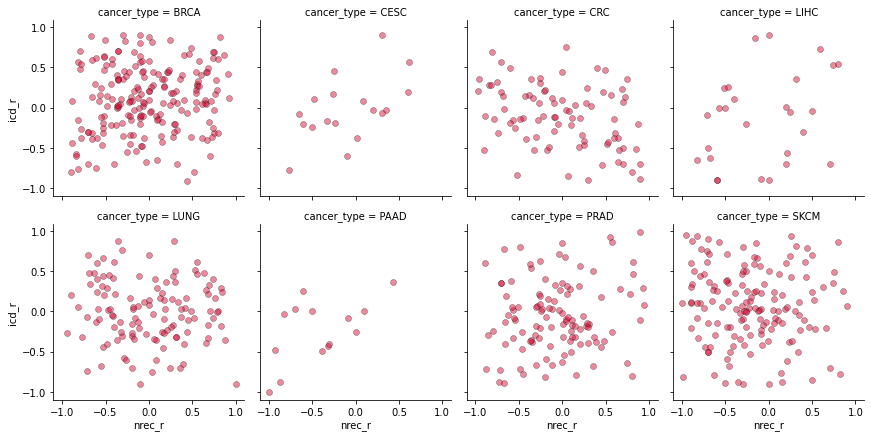

In [80]:
# NREC_r vs. icd_r
sns.relplot(x='nrec_r',
            y='icd_r',
            col='cancer_type', col_wrap=4,
            height=3, aspect=1,
            color='crimson',
            alpha=0.5, edgecolor='k',
            data=dose_dep_icd_rs)

In [81]:
for ct in dose_dep_icd_rs['cancer_type'].unique():
    tmp = dose_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
    tmp = tmp.dropna(axis=0, how='any')
    print(ct)
    print(stats.spearmanr(tmp['nrec_r'], tmp['icd_r']))

BRCA
SpearmanrResult(correlation=0.10193995032997093, pvalue=0.19818171116076003)
CESC
SpearmanrResult(correlation=0.4092411717329187, pvalue=0.14621677007543604)
CRC
SpearmanrResult(correlation=-0.26048784211932663, pvalue=0.031920801470101484)
LIHC
SpearmanrResult(correlation=0.3993497835494167, pvalue=0.0728983954151098)
LUNG
SpearmanrResult(correlation=-0.05192958743233853, pvalue=0.6115770346643012)
PAAD
SpearmanrResult(correlation=0.6423706870852693, pvalue=0.03306470725172023)
PRAD
SpearmanrResult(correlation=0.01906589447609479, pvalue=0.8568466839735938)
SKCM
SpearmanrResult(correlation=-0.009903095480208367, pvalue=0.916714320564783)


In [ ]:
# negative correlation between nrec_r and icd_r: high dosage NREC-inhibiting, low dosage ICD
# positive correlation between nrec_r and icd_r: low dosage NREC-inhibition, high dosage ICD

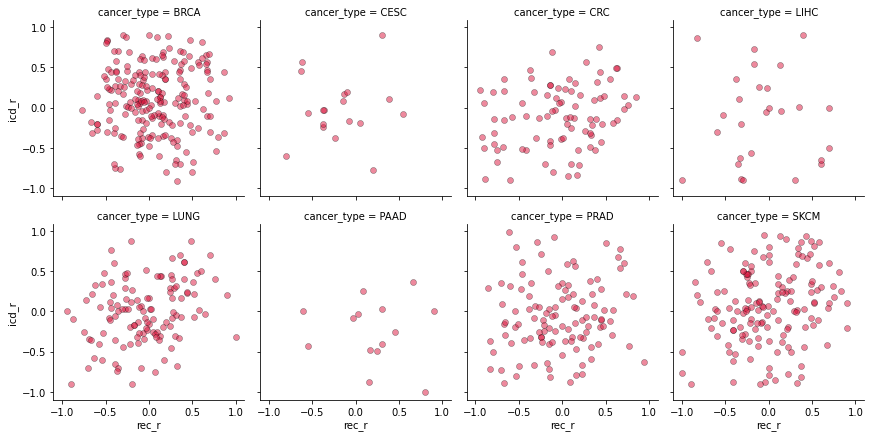

In [82]:
# REC_r vs. icd_r
sns.relplot(x='rec_r',
            y='icd_r',
            col='cancer_type', col_wrap=4,
            height=3, aspect=1,
            color='crimson',
            alpha=0.5, edgecolor='k',
            data=dose_dep_icd_rs)

In [83]:
for ct in dose_dep_icd_rs['cancer_type'].unique():
    tmp = dose_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
    tmp = tmp.dropna(axis=0, how='any')
    print(ct)
    print(stats.spearmanr(tmp['rec_r'], tmp['icd_r']))

BRCA
SpearmanrResult(correlation=-0.013439749019417156, pvalue=0.8656313203482108)
CESC
SpearmanrResult(correlation=0.15621571609159798, pvalue=0.5938237149642159)
CRC
SpearmanrResult(correlation=0.12975387243616693, pvalue=0.29160520513051397)
LIHC
SpearmanrResult(correlation=0.1404878717372541, pvalue=0.5435859137245671)
LUNG
SpearmanrResult(correlation=0.2884243880979554, pvalue=0.00397556953245975)
PAAD
SpearmanrResult(correlation=-0.10022805046720515, pvalue=0.7693624440895604)
PRAD
SpearmanrResult(correlation=0.11384732759801382, pvalue=0.27988725431315253)
SKCM
SpearmanrResult(correlation=0.19234196477364424, pvalue=0.040344664657787084)


## Conclusion

    For lung cancer, melanoma and CRC, the association between dosage and immunogeneic cell death is consistent with the association between dosage and shift ability as well as REC-activation/NREC-inhibition.
    For breast cancer, LIHC, CESC and PAAD, the association between dosage and immunogeneic cell death is anti-correlated with the association between dosage and shift ability, NREC inhibition as well as REC activation.

In [84]:
# merge with type II IFN (type II IFN is non-ICD, while type I is ICD; however, ICD will finally induce type II IFN)
dose_dep_icd_rs['ifn_g_r'] = dose_dep_ifn['ifn_g_r']
dose_dep_icd_rs['ifn_g_p'] = dose_dep_ifn['ifn_g_p']

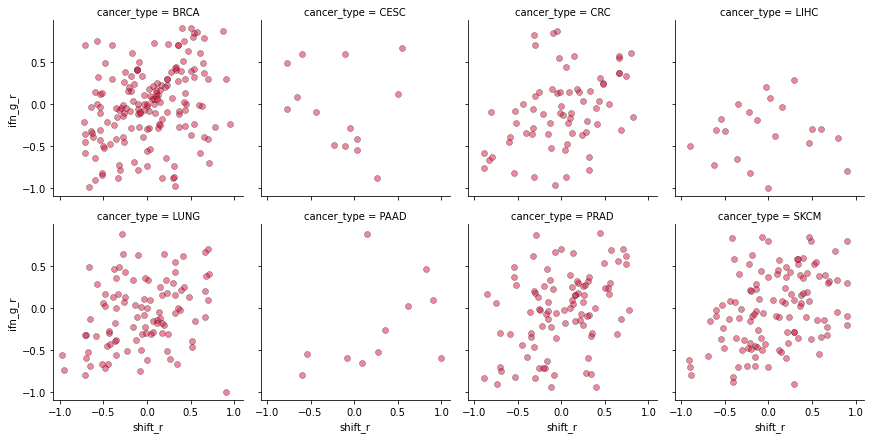

In [85]:
# shift_r vs. ifn_g_r
sns.relplot(x='shift_r',
            y='ifn_g_r',
            col='cancer_type', col_wrap=4,
            height=3, aspect=1,
            color='crimson',
            alpha=0.5, edgecolor='k',
            data=dose_dep_icd_rs)

In [86]:
for ct in dose_dep_icd_rs['cancer_type'].unique():
    tmp = dose_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
    tmp = tmp.dropna(axis=0, how='any')
    print(ct)
    print(stats.spearmanr(tmp['shift_r'], tmp['ifn_g_r']))

BRCA
SpearmanrResult(correlation=0.3147531225503941, pvalue=4.772515433258262e-05)
CESC
SpearmanrResult(correlation=-0.18171806167400884, pvalue=0.5341087163374434)
CRC
SpearmanrResult(correlation=0.3891375510980967, pvalue=0.0010391027457779278)
LIHC
SpearmanrResult(correlation=0.07662337662337662, pvalue=0.7413113765158403)
LUNG
SpearmanrResult(correlation=0.3052705067773705, pvalue=0.0022389155722227555)
PAAD
SpearmanrResult(correlation=0.5102518932875899, pvalue=0.10879394857540128)
PRAD
SpearmanrResult(correlation=0.30342776116642517, pvalue=0.0032796157127255804)
SKCM
SpearmanrResult(correlation=0.3535687381053294, pvalue=0.00011390356338780297)


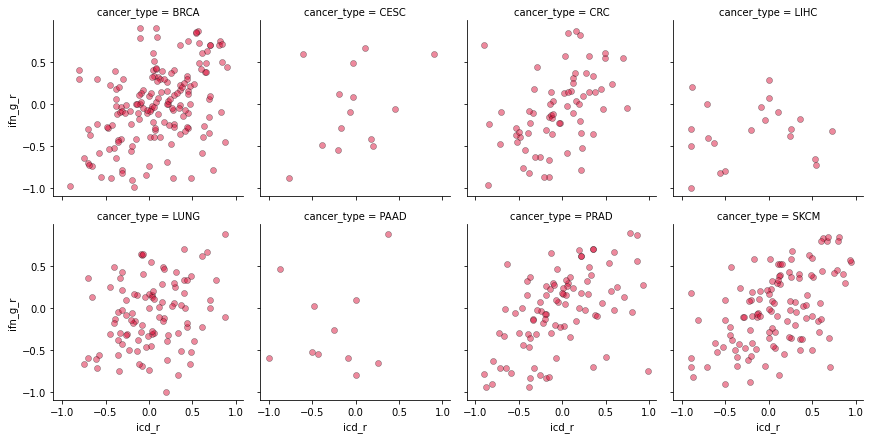

In [92]:
# icd_r vs. ifn_g_r
sns.relplot(x='icd_r',
            y='ifn_g_r',
            col='cancer_type', col_wrap=4,
            height=3, aspect=1,
            color='crimson',
            alpha=0.5, edgecolor='k',
            data=dose_dep_icd_rs)

    +(-) icd_corr, + (-) ifng_corr: immunogeneic cell death, triggering type II response, at high (low) dosage
    +(-) icd_corr, - (+) ifng_corr: immunogeneic cell death, without triggering type II, however at the opposite dosage, will induce non-immunogeneic cell death through IFNG-related pathway

## case in SKCM

In [93]:
case_skcm = dose_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == 'SKCM']

In [96]:
case_skcm

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_r,icd_p,cell_line,cancer_type,cmap_name,#experiments,moa,target,ifn_g_r,ifn_g_p
A375_mitoxantrone,-0.546894,6.9638e-05,-0.155679,0.296056,0.73678,3.54438e-09,0.356887,0.0137971,A375,SKCM,mitoxantrone,47,Topoisomerase inhibitor,TOP2A,-0.369293,0.010632
A375_vorinostat,0.238345,0.0300164,0.168376,0.12811,-0.220304,0.0453613,-0.297654,0.0062785,A375,SKCM,vorinostat,83,HDAC inhibitor,HDAC6,-0.112600,0.310821
A375_BRD-A19037878,0.0314763,0.783027,0.0539015,0.637074,0.104577,0.359036,0.00715727,0.950083,A375,SKCM,BRD-A19037878,79,NaN,NaN,NaN,NaN
A375_dabrafenib,0.361641,0.0586314,0.230285,0.238428,-0.480631,0.00962893,0.392419,0.0388761,A375,SKCM,dabrafenib,28,RAF inhibitor,BRAF,0.018137,0.927013
A375_PLX-4720,0.104101,0.723221,-0.228135,0.432777,-0.47399,0.0868533,0.349955,0.219978,A375,SKCM,PLX-4720,14,RAF inhibitor,BRAF,0.403113,0.152952
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
SKMEL5_cobimetinib,0.6,0.208,0.485714,0.328723,-0.828571,0.0415627,-0.0857143,0.871743,SKMEL5,SKCM,cobimetinib,6,NaN,NaN,NaN,NaN
SKMEL5_selumetinib,0.9,0.0373861,0.6,0.284757,-0.9,0.0373861,0.3,0.623838,SKMEL5,SKCM,selumetinib,5,MEK inhibitor,MAP2K1,-0.200000,0.747060
SKMEL5_bortezomib,0.126592,0.745527,0.126592,0.745527,0.253185,0.51098,0.936784,0.000196533,SKMEL5,SKCM,bortezomib,9,Proteasome inhibitor,PSMB1,0.565446,0.112580
SKMEL5_dinaciclib,0.2,0.704,0.257143,0.622787,-0.142857,0.787172,0.257143,0.622787,SKMEL5,SKCM,dinaciclib,6,CDK inhibitor,CDK2,0.371429,0.468478


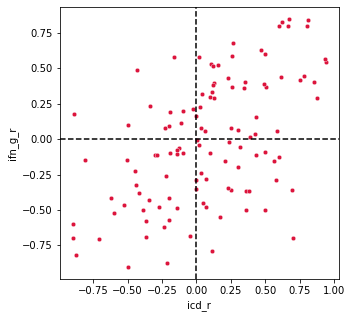

In [111]:
plt.figure(figsize=(5, 5))
sns.scatterplot(x='icd_r',
                y='ifn_g_r',
                data=case_skcm,
                color='crimson',
                s=20, alpha=1,)
plt.axvline(x=0.0, c='k', ls='--')
plt.axhline(y=0.0, c='k', ls='--')

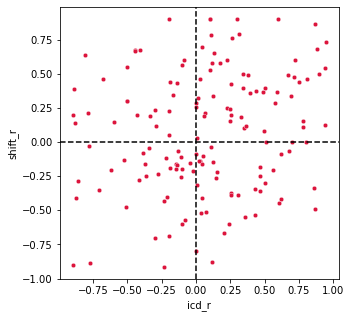

In [112]:
plt.figure(figsize=(5, 5))
sns.scatterplot(x='icd_r',
                y='shift_r',
                data=case_skcm,
                color='crimson',
                s=20, alpha=1,)
plt.axvline(x=0.0, c='k', ls='--')
plt.axhline(y=0.0, c='k', ls='--')

<Figure size 720x720 with 0 Axes>

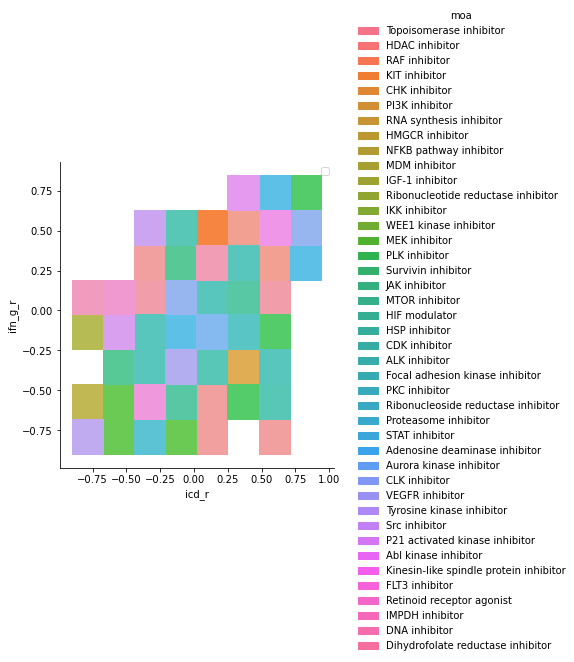

In [121]:
plt.figure(figsize=(10, 10))
sns.displot(x='icd_r',
            y='ifn_g_r',
            hue='moa',
            data=case_skcm)
plt.legend(loc='upper right', ncol=5)

<Figure size 720x720 with 0 Axes>

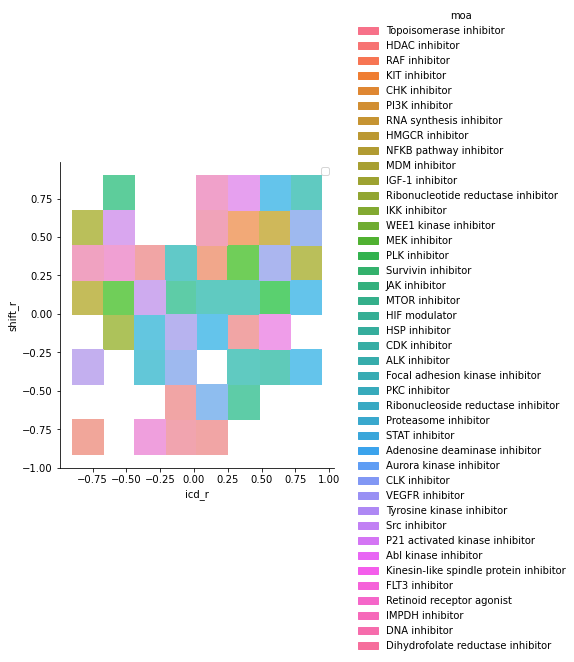

In [122]:
plt.figure(figsize=(10, 10))
sns.displot(x='icd_r',
            y='shift_r',
            hue='moa',
            data=case_skcm)
plt.legend(loc='upper right', ncol=5)

In [98]:
case_skcm.loc['A375_PF-03758309', :]

shift_r                               0.553317
shift_p                               0.122249
rec_r                                 0.255377
rec_p                                 0.507201
nrec_r                               -0.451166
nrec_p                                0.222869
icd_r                                -0.502241
icd_p                                 0.168255
cell_line                                 A375
cancer_type                               SKCM
cmap_name                          PF-03758309
#experiments                                 9
moa             P21 activated kinase inhibitor
target                                    PAK4
ifn_g_r                              -0.144714
ifn_g_p                               0.710288
Name: A375_PF-03758309, dtype: object

In [100]:
enr_icd_nes_rs[enr_icd_nes_rs['cmap_name'] == 'PF-03758309']

,ICD_chemical,cmap_name,nearest_dose,pert_idose,cancer_type,time,tas,cell_line,dose_cat,shift_ability,NREC_profile,REC_profile
REP.A014_MCF7_24H:K13,1.356046,PF-03758309,10.000,10 uM,BRCA,24.0,0.779119,MCF7,medium,0.571729,-0.298327,0.273402
REP.A014_MCF7_24H:K15,-1.184115,PF-03758309,1.110,1.11 uM,BRCA,24.0,0.495805,MCF7,medium,0.649409,-0.361099,0.288309
REP.A014_MCF7_24H:K17,-1.039446,PF-03758309,0.125,0.125 uM,BRCA,24.0,0.442109,MCF7,low,0.790873,-0.395146,0.395726
REP.B014_MCF7_24H:K13,1.387529,PF-03758309,2.220,2.22 uM,BRCA,24.0,0.533314,MCF7,medium,0.575058,-0.266355,0.308703
REP.B014_MCF7_24H:K16,-1.404661,PF-03758309,0.080,0.08 uM,BRCA,24.0,0.423978,MCF7,low,0.573726,-0.265991,0.307735
LJP009_HELA_24H:D04,1.309741,PF-03758309,0.370,0.37 uM,CESC,24.0,0.475080,HELA,low,0.508504,-0.312359,0.196146
LJP009_HT29_24H:D01,1.088656,PF-03758309,10.000,10 uM,CRC,24.0,0.672932,HT29,medium,0.617426,-0.324770,0.292656
LJP009_HT29_24H:D03,1.383143,PF-03758309,1.110,1.11 uM,CRC,24.0,0.501583,HT29,medium,0.545189,-0.355668,0.189521
REP.A014_HT29_24H:K13,0.878120,PF-03758309,10.000,10 uM,CRC,24.0,0.758722,HT29,medium,0.608420,-0.438454,0.169966
REP.A014_HT29_24H:K14,1.541068,PF-03758309,3.330,3.33 uM,CRC,24.0,0.648232,HT29,medium,0.727225,-0.438640,0.288585


In [123]:
enr_icd_fdr_rs[enr_icd_fdr_rs['cmap_name'] == 'PF-03758309']

,ICD_chemical,cmap_name,nearest_dose,pert_idose,cancer_type,time,tas,cell_line,dose_cat,shift_ability,NREC_profile,REC_profile
REP.A014_MCF7_24H:K13,0.133333,PF-03758309,10.000,10 uM,BRCA,24.0,0.779119,MCF7,medium,0.571729,-0.298327,0.273402
REP.A014_MCF7_24H:K15,0.274510,PF-03758309,1.110,1.11 uM,BRCA,24.0,0.495805,MCF7,medium,0.649409,-0.361099,0.288309
REP.A014_MCF7_24H:K17,0.428571,PF-03758309,0.125,0.125 uM,BRCA,24.0,0.442109,MCF7,low,0.790873,-0.395146,0.395726
REP.B014_MCF7_24H:K13,0.117647,PF-03758309,2.220,2.22 uM,BRCA,24.0,0.533314,MCF7,medium,0.575058,-0.266355,0.308703
REP.B014_MCF7_24H:K16,0.159091,PF-03758309,0.080,0.08 uM,BRCA,24.0,0.423978,MCF7,low,0.573726,-0.265991,0.307735
LJP009_HELA_24H:D04,0.162791,PF-03758309,0.370,0.37 uM,CESC,24.0,0.475080,HELA,low,0.508504,-0.312359,0.196146
LJP009_HT29_24H:D01,0.310811,PF-03758309,10.000,10 uM,CRC,24.0,0.672932,HT29,medium,0.617426,-0.324770,0.292656
LJP009_HT29_24H:D03,0.111111,PF-03758309,1.110,1.11 uM,CRC,24.0,0.501583,HT29,medium,0.545189,-0.355668,0.189521
REP.A014_HT29_24H:K13,0.695652,PF-03758309,10.000,10 uM,CRC,24.0,0.758722,HT29,medium,0.608420,-0.438454,0.169966
REP.A014_HT29_24H:K14,0.000000,PF-03758309,3.330,3.33 uM,CRC,24.0,0.648232,HT29,medium,0.727225,-0.438640,0.288585


# Time

In [64]:
# dosage-dependence in each cell line (R-shifting)
time_dep_icd_rs = df(columns=['shift_r', 'shift_p', 'rec_r', 'rec_p', 'nrec_r', 'nrec_p',
                            'icd_r', 'icd_p', 'cell_line', 'cancer_type',
                           'cmap_name', '#experiments', 'moa', 'target'])
for ct in enr_icd_nes_rs['cancer_type'].unique():
    tmp_rs = enr_icd_nes_rs[enr_icd_nes_rs['cancer_type'] == ct]
    for cl in tmp_rs['cell_line'].unique():
        tmp_rs_cl = tmp_rs[tmp_rs['cell_line'] == cl]
        for d in tmp_rs_cl['cmap_name'].unique():
            tmp_rs_cl_d = tmp_rs_cl[tmp_rs_cl['cmap_name'] == d]
            if tmp_rs_cl_d.shape[0] >= 5:
                tmp_a_r, tmp_a_p = stats.spearmanr(tmp_rs_cl_d['shift_ability'], tmp_rs_cl_d['time'])
                tmp_g_r, tmp_g_p = stats.spearmanr(tmp_rs_cl_d['REC_profile'], tmp_rs_cl_d['time'])
                tmp_ng_r, tmp_ng_p = stats.spearmanr(tmp_rs_cl_d['NREC_profile'], tmp_rs_cl_d['time'])
                tmp_m_r, tmp_m_p = stats.spearmanr(tmp_rs_cl_d['ICD_chemical'], tmp_rs_cl_d['time'])
                
                time_dep_icd_rs.at[cl + '_' + d, 'shift_r'] = tmp_a_r
                time_dep_icd_rs.at[cl + '_' + d, 'shift_p'] = tmp_a_p
                time_dep_icd_rs.at[cl + '_' + d, 'rec_r'] = tmp_g_r
                time_dep_icd_rs.at[cl + '_' + d, 'rec_p'] = tmp_g_p
                time_dep_icd_rs.at[cl + '_' + d, 'nrec_r'] = tmp_ng_r
                time_dep_icd_rs.at[cl + '_' + d, 'nrec_p'] = tmp_ng_p
                time_dep_icd_rs.at[cl + '_' + d, 'icd_r'] = tmp_m_r
                time_dep_icd_rs.at[cl + '_' + d, 'icd_p'] = tmp_m_p
                time_dep_icd_rs.at[cl + '_' + d, 'cancer_type'] = ct
                time_dep_icd_rs.at[cl + '_' + d, 'cell_line'] = cl
                time_dep_icd_rs.at[cl + '_' + d, 'cmap_name'] = d
                time_dep_icd_rs.at[cl + '_' + d, '#experiments'] = tmp_rs_cl_d.shape[0]
                time_dep_icd_rs.at[cl + '_' + d, 'moa'] = compound_info.loc[d, 'moa']
                time_dep_icd_rs.at[cl + '_' + d, 'target'] = compound_info.loc[d, 'target']

/home/dyang-server/anaconda3/lib/python3.8/site-packages/scipy/stats/stats.py:4196: SpearmanRConstantInputWarning: An input array is constant; the correlation coefficent is not defined.
  warnings.warn(SpearmanRConstantInputWarning())


In [66]:
time_dep_icd_rs = time_dep_icd_rs.dropna(axis=0, how='any')

In [69]:
time_dep_icd_rs

,shift_r,shift_p,rec_r,rec_p,nrec_r,nrec_p,icd_r,icd_p,cell_line,cancer_type,cmap_name,#experiments,moa,target
SKBR3_afatinib,0.273861,0.475797,0.0912871,0.815318,-0.63901,0.0639241,0.273861,0.475797,SKBR3,BRCA,afatinib,9,EGFR inhibitor,EGFR
SKBR3_CGP-60474,0,1,0.435194,0.208749,0.696311,0.0252932,-0.261116,0.466185,SKBR3,BRCA,CGP-60474,10,CDK inhibitor,CDK1
SKBR3_alvocidib,-0.130931,0.804726,0.130931,0.804726,0.130931,0.804726,-0.654654,0.158302,SKBR3,BRCA,alvocidib,6,CDK inhibitor,CDK2
SKBR3_BMS-387032,0.507093,0.304559,-0.507093,0.304559,-0.169031,0.748868,0.676123,0.140357,SKBR3,BRCA,BMS-387032,6,CDK inhibitor,CDK2
SKBR3_NVP-BEZ235,-0.130931,0.804726,0.130931,0.804726,0.654654,0.158302,-0.392792,0.441113,SKBR3,BRCA,NVP-BEZ235,6,MTOR inhibitor,MTOR
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
A375_irinotecan,0.547723,0.12687,0.547723,0.12687,-0.547723,0.12687,0.547723,0.12687,A375,SKCM,irinotecan,9,Topoisomerase inhibitor,TOP1
A375_MG-132,0.00383275,0.946501,-0.0076655,0.893242,-0.0351335,0.538371,0.0574912,0.313771,A375,SKCM,MG-132,309,Proteasome inhibitor,PSMB1
A375_niclosamide,0.707107,0.18169,0,1,-0.707107,0.18169,-0.353553,0.559404,A375,SKCM,niclosamide,5,STAT inhibitor,STAT3
A375_cladribine,0.353553,0.559404,0.707107,0.18169,0,1,-0.707107,0.18169,A375,SKCM,cladribine,5,Adenosine deaminase inhibitor,ADA


In [68]:
time_dep_icd_rs.to_csv(poseidon_home + 'results/compound_top_moa/all_Rshifting_ICD_time_dependence.csv', sep=',')

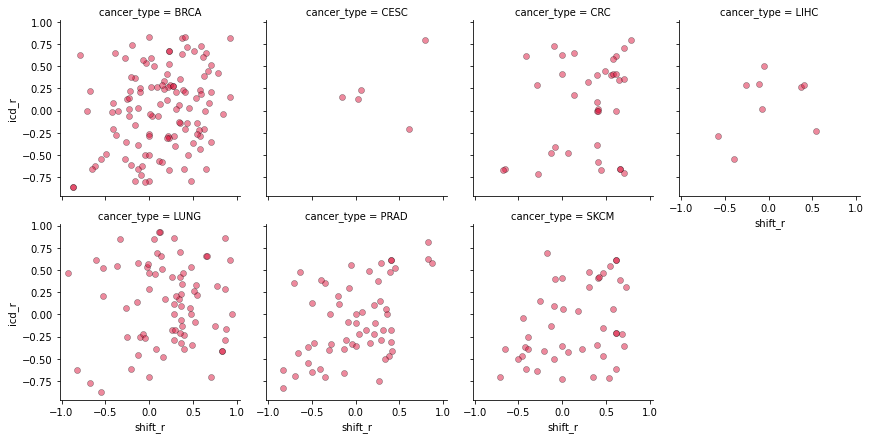

In [87]:
# shift_r vs. icd_r
sns.relplot(x='shift_r',
            y='icd_r',
            col='cancer_type', col_wrap=4,
            height=3, aspect=1,
            color='crimson',
            alpha=0.5, edgecolor='k',
            data=time_dep_icd_rs)

In [90]:
for ct in time_dep_icd_rs['cancer_type'].unique():
    tmp = time_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
    tmp = tmp.dropna(axis=0, how='any')
    print(ct)
    print(stats.spearmanr(tmp['shift_r'], tmp['icd_r']))

BRCA
SpearmanrResult(correlation=0.218898705828297, pvalue=0.017732230020926835)
CESC
SpearmanrResult(correlation=0.3, pvalue=0.6238376647810728)
CRC
SpearmanrResult(correlation=0.15845093144565128, pvalue=0.3560056388305963)
LIHC
SpearmanrResult(correlation=0.35, pvalue=0.35581957250178897)
LUNG
SpearmanrResult(correlation=-0.012363155236870173, pvalue=0.9161585895423607)
PRAD
SpearmanrResult(correlation=0.4247230771241292, pvalue=0.0008904648313105575)
SKCM
SpearmanrResult(correlation=0.3539771248725007, pvalue=0.01705418912163242)


<ipython-input-90-d78a9cb00bf3>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = time_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
<ipython-input-90-d78a9cb00bf3>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = time_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
<ipython-input-90-d78a9cb00bf3>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = time_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
<ipython-input-90-d78a9cb00bf3>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = time_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
<ipython-input-90-d78a9cb00bf3>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = time_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
<ipython-input-90-d78a9cb00bf3>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = time_dep_icd_rs[

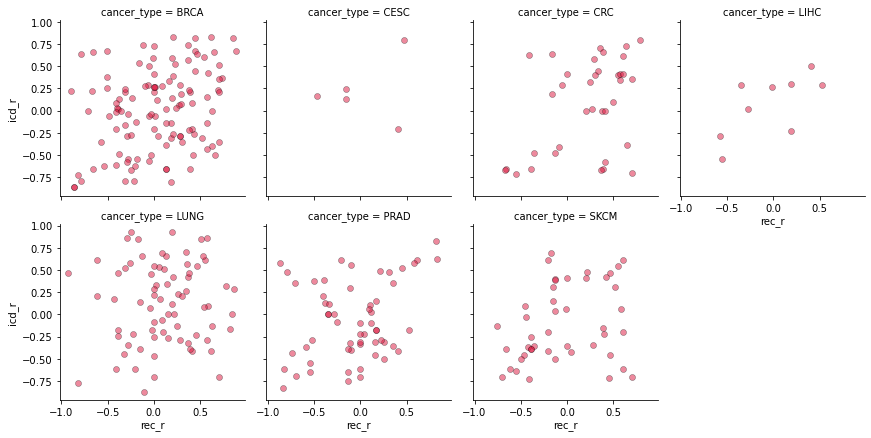

In [88]:
# rec_r vs. icd_r
sns.relplot(x='rec_r',
            y='icd_r',
            col='cancer_type', col_wrap=4,
            height=3, aspect=1,
            color='crimson',
            alpha=0.5, edgecolor='k',
            data=time_dep_icd_rs)

In [91]:
for ct in time_dep_icd_rs['cancer_type'].unique():
    tmp = time_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
    tmp = tmp.dropna(axis=0, how='any')
    print(ct)
    print(stats.spearmanr(tmp['rec_r'], tmp['icd_r']))

BRCA
SpearmanrResult(correlation=0.2775382807432102, pvalue=0.002449149862629373)
CESC
SpearmanrResult(correlation=0.09999999999999999, pvalue=0.8728885715695383)
CRC
SpearmanrResult(correlation=0.32481002038948126, pvalue=0.05325436361960454)
LIHC
SpearmanrResult(correlation=0.7, pvalue=0.03576957497026169)
LUNG
SpearmanrResult(correlation=0.03295335062571161, pvalue=0.7789655814792161)
PRAD
SpearmanrResult(correlation=0.2522933224681232, pvalue=0.056054002839865544)
SKCM
SpearmanrResult(correlation=0.3006426101484179, pvalue=0.04478051092047579)


<ipython-input-91-f5f1a7715247>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = time_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
<ipython-input-91-f5f1a7715247>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = time_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
<ipython-input-91-f5f1a7715247>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = time_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
<ipython-input-91-f5f1a7715247>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = time_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
<ipython-input-91-f5f1a7715247>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = time_dep_icd_rs[dose_dep_icd_rs['cancer_type'] == ct]
<ipython-input-91-f5f1a7715247>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  tmp = time_dep_icd_rs[

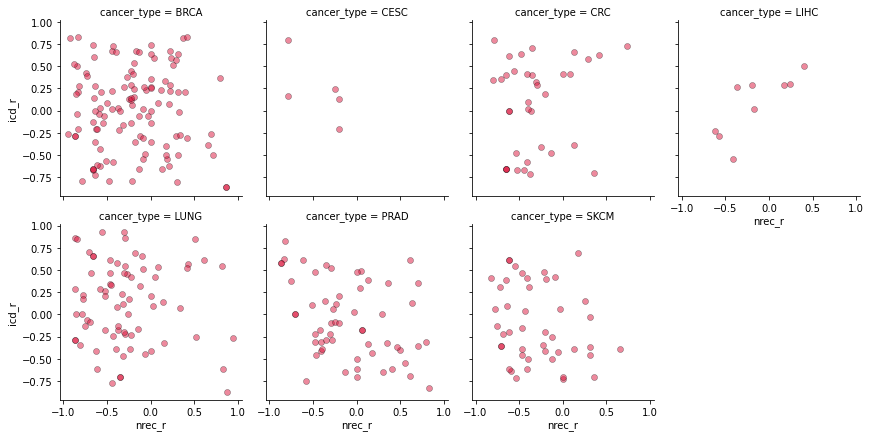

In [89]:
# nrec_r vs. icd_r
sns.relplot(x='nrec_r',
            y='icd_r',
            col='cancer_type', col_wrap=4,
            height=3, aspect=1,
            color='crimson',
            alpha=0.5, edgecolor='k',
            data=time_dep_icd_rs)